In [1]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.options.display.max_rows = 1500

In [2]:
# prompt: uninstall and reinstall yfinance

!pip uninstall yfinance -y
!pip install yfinance

Found existing installation: yfinance 0.2.58
Uninstalling yfinance-0.2.58:
  Successfully uninstalled yfinance-0.2.58
  Using cached yfinance-0.2.58-py2.py3-none-any.whl.metadata (5.5 kB)
Using cached yfinance-0.2.58-py2.py3-none-any.whl (113 kB)


In [3]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from matplotlib.colors import ListedColormap
import numpy as np
import pandas as pd
import matplotlib.dates as mdates
from PIL import Image, ImageFilter, ImageDraw
import io
from scipy import ndimage
from matplotlib.image import BboxImage
from matplotlib.transforms import Bbox, TransformedBbox
import datetime


def ma(df, alpha):
    if type(alpha) == int:
        # Calculate the simple moving average
        window_size = alpha
        df[f'SMA{window_size}'] = df['score'].rolling(window=window_size, center=False).mean()
        # Handle NaN values at the beginning and end (optional)
        df[f'SMA{window_size}'] = df[f'SMA{window_size}'].bfill().ffill()
        # score[f'SMA{window_size}'] = score[f'SMA{window_size}'].fillna(method='ffill')
    elif type(alpha) == float:
        df[f'EMA{alpha}'] = df['score'].ewm(alpha=alpha, adjust=False, min_periods=20).mean()
    return df


def graph(df_list, alpha, with_mean=True, vertical=None, text=None, hightlight=False, color=None, label=None, verbose=1):
    if verbose == 1:
        plt.figure(figsize=(12, 6))
    if type(alpha) != list:
        alpha = [alpha] * len(df_list)



    # scaler = MinMaxScaler()
    if type(with_mean) == bool:
        with_mean = [with_mean] * len(df_list)
    scaler = [StandardScaler(with_mean=with_mean[i]) for i in range(len(df_list))]

    # scaler = StandardScaler()
    # scaler = StandardScaler(with_mean=False)

    x_min = min(df.index.min() for df in df_list)
    x_max = max(df.index.max() for df in df_list)

    for i, df in enumerate(df_list):
        ma_type = 'EMA' if type(alpha[i]) == float else 'SMA'
        w = alpha[i]
        df = ma(df, w)
        df[f'{ma_type}{w}_scaled'] = scaler[i].fit_transform(df[[f'{ma_type}{w}']])
        df = df[df.index >= '2024-03-01']
        if verbose == 1:
            plt.plot(df.index, df[f'{ma_type}{w}_scaled'], label=f'{ma_type} {w}' if label is None else label[i], color=color[i])

    if verbose == 1:
        plt.xlabel('Date')
        # plt.ylabel('Scaled Value')

        # Plot the scaled data
        plt.yticks([0], [0])
        # plt.ylabel('Scaled Value')
        plt.legend()
        # plt.grid(True)
        plt.axhline(y=0, color='black', alpha=0.1, linestyle='--')
        plt.ylim(-6, 6)
        y_min, y_max = plt.ylim()
        # print(y_min, y_max)


        # top_color = np.array([0.7, 1, 0.7, 1])  # Light green with alpha=1
        # bottom_color = np.array([1, 0.7, 0.7, 1]) # Light red with alpha=1
        # mid_color = np.array([1, 1, 1, 1])      # White with alpha=1

        top_color = np.array([0, 0.7, 0, 1])  # Darker green with alpha=1
        bottom_color = np.array([0.8, 0, 0, 1]) # Darker red with alpha=1
        mid_color = np.array([1, 1, 1, 1])      # White with alpha=1


        gradient = np.vstack((
            np.linspace(bottom_color, mid_color, int(abs(y_min * 100))),  # Red to white
            np.linspace(mid_color, top_color, int(abs(y_max * 100)))   # White to green
        ))
        cmap = ListedColormap(gradient)

        # Create background image with gradient
        extent = ['2024-03-01', x_max, y_min, y_max]
        plt.imshow(np.tile(np.arange(y_min, y_max, 0.1).reshape(-1, 1), (1, 2)),
                  cmap=cmap, extent=extent, aspect='auto', origin='lower', alpha=0.3, zorder=0)  # zorder=0 to place it behind the lines

        # plt.fill_between(['2024-03-01', x_max], 0, y_max, color='lightgreen', alpha=0.3)  # Above the line
        # plt.fill_between(['2024-03-01', x_max], y_min, 0, color='lightcoral', alpha=0.3) # Below the line

        if vertical is not None:
            plt.axvline(x=pd.to_datetime(vertical), color='gray', linestyle='-', linewidth=plt.rcParams['lines.linewidth'] * 1.2)
            plt.text(pd.to_datetime(vertical), y_max, text, color='black', ha='center', va='bottom', fontsize=plt.rcParams['font.size'] * 1.5)

        # Create a blank image (marker) for blurring
        marker = np.zeros((100, 100, 4))  # Adjust size if needed
        # marker[:, :, 3] = 1  # Make it fully opaque
        marker[:, :, :3] = [0.4, 0.4, 0.4]  # Dark gray color
        marker[:, :, 3] = 0.8  # Fully opaque

        # Define blur regions and sigma values
        if hightlight != False:
            blur_regions = [
                (mdates.date2num(pd.to_datetime('2024-03-01')), mdates.date2num(pd.to_datetime(vertical) - datetime.timedelta(weeks = hightlight[0]))),
                (mdates.date2num(pd.to_datetime(vertical) + datetime.timedelta(weeks = hightlight[1])), mdates.date2num(x_max))
            ]
            sigma_values = [100, 100]  # Adjust blur intensity for each region

            # Apply blurring to the defined regions
            for (x_start, x_end), sigma in zip(blur_regions, sigma_values):
                # Calculate bounding box for the region
                bb = Bbox.from_bounds(x_start, y_min, x_end - x_start, y_max - y_min)
                bb2 = TransformedBbox(bb, plt.gca().transData)

                # Blur the marker image
                markerBlur = ndimage.gaussian_filter(marker, sigma)

                # Create and add BboxImage for the blurred region
                bbox_image = BboxImage(bb2, norm=None, origin=None, clip_on=False)
                bbox_image.set_data(markerBlur)
                plt.gca().add_artist(bbox_image)



        plt.margins(0)
        # plt.subplots_adjust(left=0.2, bottom=0.1, right=1.2, top=0.9)

        plt.show()
    return

In [4]:
def graph2(df_list, alpha, with_mean=True, vertical=None, text=None, hightlight=[1.5, 1.5], color=None, label=None):

    plt.figure(figsize=(12, 6))
    if type(alpha) != list:
        alpha = [alpha] * len(df_list)

    # ma_type = 'EMA' if type(alpha[0]) == float else 'SMA'

    if type(with_mean) == bool:
        with_mean = [with_mean] * len(df_list)
    scaler = [StandardScaler(with_mean=with_mean[i]) for i in range(len(df_list))]
    # scaler = MinMaxScaler()
    # scaler = StandardScaler()
    # scaler = StandardScaler(with_mean=False)

    x_min = min(df.index.min() for df in df_list)
    x_max = max(df.index.max() for df in df_list)

    for i, df in enumerate(df_list):
        ma_type = 'EMA' if type(alpha[0]) == float else 'SMA'
        w = alpha[i]
        df = ma(df, w)
        df[f'{ma_type}{w}_scaled'] = scaler[i].fit_transform(df[[f'{ma_type}{w}']])
        df = df[df.index >= '2024-03-01']

        plt.plot(df.index, df[f'{ma_type}{w}_scaled'], label=f'{ma_type} {w}' if label is None else label[i], color=color[i])
    plt.xlabel('Date')
    # plt.ylabel('Scaled Value')

    # Plot the scaled data
    plt.yticks([0], [0])
    # plt.ylabel('Scaled Value')
    plt.legend()
    # plt.grid(True)
    plt.axhline(y=0, color='black', alpha=0.1, linestyle='--')
    plt.ylim(-6, 6)
    y_min, y_max = plt.ylim()
    # print(y_min, y_max)

    # top_color = np.array([0.7, 1, 0.7, 1])  # Light green with alpha=1
    # bottom_color = np.array([1, 0.7, 0.7, 1]) # Light red with alpha=1
    # mid_color = np.array([1, 1, 1, 1])      # White with alpha=1

    top_color = np.array([0, 0.7, 0, 1])  # Darker green with alpha=1
    bottom_color = np.array([0.8, 0, 0, 1]) # Darker red with alpha=1
    mid_color = np.array([1, 1, 1, 1])      # White with alpha=1


    gradient = np.vstack((
        np.linspace(bottom_color, mid_color, int(abs(y_min * 100))),  # Red to white
        np.linspace(mid_color, top_color, int(abs(y_max * 100)))   # White to green
    ))
    cmap = ListedColormap(gradient)

    # Create background image with gradient
    extent = ['2024-03-01', x_max, y_min, y_max]
    plt.imshow(np.tile(np.arange(y_min, y_max, 0.1).reshape(-1, 1), (1, 2)),
               cmap=cmap, extent=extent, aspect='auto', origin='lower', alpha=0.3, zorder=0)  # zorder=0 to place it behind the lines

    # plt.fill_between(['2024-03-01', x_max], 0, y_max, color='lightgreen', alpha=0.3)  # Above the line
    # plt.fill_between(['2024-03-01', x_max], y_min, 0, color='lightcoral', alpha=0.3) # Below the line

    if vertical is not None:
        for idx, v in enumerate(vertical):
            plt.axvline(x=pd.to_datetime(v), color='gray', linestyle='-', linewidth=plt.rcParams['lines.linewidth'] * 1.2)
            plt.text(pd.to_datetime(v), y_max, text[idx], color='black', ha='center', va='bottom', fontsize=plt.rcParams['font.size'] * 1.5)

    # Create a blank image (marker) for blurring
    marker = np.zeros((100, 100, 4))  # Adjust size if needed
    # marker[:, :, 3] = 1  # Make it fully opaque
    marker[:, :, :3] = [0.4, 0.4, 0.4]  # Dark gray color
    marker[:, :, 3] = 0.8  # Fully opaque

    # Define blur regions and sigma values

    if hightlight != False:
        # print([pd.to_datetime(vertical) - datetime.timedelta(weeks = hightlight[0]) for v in vertical][0])
        blur_list_left = [pd.to_datetime('2024-03-01')] + [pd.to_datetime(v) + datetime.timedelta(weeks = hightlight[1]) for v in vertical]
        blur_list_right = [pd.to_datetime(v) - datetime.timedelta(weeks = hightlight[0]) for v in vertical] + [pd.to_datetime(x_max)]
        # print(len(blur_list_left), blur_list_right)
        blur_regions = [
            (mdates.date2num(left), mdates.date2num(right)) if left < right else (mdates.date2num(right), mdates.date2num(right))
            for left, right in zip(blur_list_left, blur_list_right)
        ]
            # (mdates.date2num(pd.to_datetime('2024-03-01')), mdates.date2num(pd.to_datetime(vertical) - datetime.timedelta(weeks = hightlight[0]))),
            # (mdates.date2num(pd.to_datetime(vertical) + datetime.timedelta(weeks = hightlight[1])), mdates.date2num(x_max))

        sigma_values = [100] * len(blur_list_left) + [100]  # Adjust blur intensity for each region

        # Apply blurring to the defined regions
        for (x_start, x_end), sigma in zip(blur_regions, sigma_values):

            # Calculate bounding box for the region
            # print(x_start, x_end)
            # print(x_start, y_min, x_end - x_start, y_max - y_min)
            bb = Bbox.from_bounds(x_start, y_min, x_end - x_start, y_max - y_min)
            bb2 = TransformedBbox(bb, plt.gca().transData)

            # Blur the marker image
            markerBlur = ndimage.gaussian_filter(marker, sigma)

            # Create and add BboxImage for the blurred region
            bbox_image = BboxImage(bb2, norm=None, origin=None, clip_on=False)
            bbox_image.set_data(markerBlur)
            plt.gca().add_artist(bbox_image)



    plt.margins(0)

    # plt.subplots_adjust(left=0.2, bottom=0.1, right=1.2, top=0.9)
    plt.show()
    return

In [5]:
def graph3(df_list, alpha, with_mean=True, hightlight=False, color=None, label=None):

    plt.figure(figsize=(12, 6))
    if type(alpha) != list:
        alpha = [alpha] * len(df_list)

    # ma_type = 'EMA' if type(alpha[0]) == float else 'SMA'

    if type(with_mean) == bool:
        with_mean = [with_mean] * len(df_list)
    scaler = [StandardScaler(with_mean=with_mean[i]) for i in range(len(df_list))]

    # scaler = MinMaxScaler()
    # scaler = StandardScaler()
    # scaler = StandardScaler(with_mean=False)

    x_min = min(df.index.min() for df in df_list)
    x_max = max(df.index.max() for df in df_list)

    for i, df in enumerate(df_list):
        ma_type = 'EMA' if type(alpha[i]) == float else 'SMA'
        w = alpha[i]
        df = ma(df, w)
        df[f'{ma_type}{w}_scaled'] = scaler[i].fit_transform(df[[f'{ma_type}{w}']])
        df = df[df.index >= '2024-03-01']

        plt.plot(df.index, df[f'{ma_type}{w}_scaled'], label=f'{ma_type} {w}' if label is None else label[i], color=color[i])
    plt.xlabel('Date')
    # plt.ylabel('Scaled Value')

    # Plot the scaled data
    plt.yticks([0], [0])
    # plt.ylabel('Scaled Value')
    plt.legend()
    # plt.grid(True)
    plt.axhline(y=0, color='black', alpha=0.1, linestyle='--')
    plt.ylim(-6, 6)
    y_min, y_max = plt.ylim()
    # print(y_min, y_max)


    # top_color = np.array([0.7, 1, 0.7, 1])  # Light green with alpha=1
    # bottom_color = np.array([1, 0.7, 0.7, 1]) # Light red with alpha=1
    # mid_color = np.array([1, 1, 1, 1])      # White with alpha=1

    top_color = np.array([0, 0.7, 0, 1])  # Darker green with alpha=1
    bottom_color = np.array([0.8, 0, 0, 1]) # Darker red with alpha=1
    mid_color = np.array([1, 1, 1, 1])      # White with alpha=1


    gradient = np.vstack((
        np.linspace(bottom_color, mid_color, int(abs(y_min * 100))),  # Red to white
        np.linspace(mid_color, top_color, int(abs(y_max * 100)))   # White to green
    ))
    cmap = ListedColormap(gradient)

    # Create background image with gradient
    extent = ['2024-03-01', x_max, y_min, y_max]
    plt.imshow(np.tile(np.arange(y_min, y_max, 0.1).reshape(-1, 1), (1, 2)),
               cmap=cmap, extent=extent, aspect='auto', origin='lower', alpha=0.3, zorder=0)  # zorder=0 to place it behind the lines

    # plt.fill_between(['2024-03-01', x_max], 0, y_max, color='lightgreen', alpha=0.3)  # Above the line
    # plt.fill_between(['2024-03-01', x_max], y_min, 0, color='lightcoral', alpha=0.3) # Below the line

    # Create a blank image (marker) for blurring
    marker = np.zeros((100, 100, 4))  # Adjust size if needed
    # marker[:, :, 3] = 1  # Make it fully opaque
    marker[:, :, :3] = [0.4, 0.4, 0.4]  # Dark gray color
    marker[:, :, 3] = 0.8  # Fully opaque

    # Define blur regions and sigma values
    if hightlight != False:
        blur_regions = [
            (mdates.date2num(pd.to_datetime('2024-03-01')), mdates.date2num(pd.to_datetime(hightlight[0]))),
            (mdates.date2num(pd.to_datetime(hightlight[1])), mdates.date2num(x_max))
        ]
        # blur_regions = [
        #     (mdates.date2num(pd.to_datetime('2024-03-01')), mdates.date2num(pd.to_datetime('2024-09-01')))
        # ]
        sigma_values = [100] * len(blur_regions)  # Adjust blur intensity for each region

        # Apply blurring to the defined regions
        for (x_start, x_end), sigma in zip(blur_regions, sigma_values):
            # Calculate bounding box for the region
            # print(y_min, y_max)
            bb = Bbox.from_bounds(x_start, -5, x_end - x_start,  10)
            bb2 = TransformedBbox(bb, plt.gca().transData)

            # Blur the marker image
            markerBlur = ndimage.gaussian_filter(marker, sigma)

            # Create and add BboxImage for the blurred region
            bbox_image = BboxImage(bb2, norm=None, origin=None, clip_on=False)
            bbox_image.set_data(markerBlur)
            plt.gca().add_artist(bbox_image)


        x_start = mdates.date2num(pd.to_datetime('2024-03-01'))
        x_end = mdates.date2num(x_max)
        bb = Bbox.from_bounds(x_start, 5, x_end - x_start,  y_max-5)
        bb2 = TransformedBbox(bb, plt.gca().transData)

        # Blur the marker image
        markerBlur = ndimage.gaussian_filter(marker, sigma)

        # Create and add BboxImage for the blurred region
        bbox_image = BboxImage(bb2, norm=None, origin=None, clip_on=False)
        bbox_image.set_data(markerBlur)
        plt.gca().add_artist(bbox_image)


        x_start = mdates.date2num(pd.to_datetime('2024-03-01'))
        x_end = mdates.date2num(x_max)
        bb = Bbox.from_bounds(x_start, -6, x_end - x_start, 1)
        bb2 = TransformedBbox(bb, plt.gca().transData)

        # Blur the marker image
        markerBlur = ndimage.gaussian_filter(marker, sigma)

        # Create and add BboxImage for the blurred region
        bbox_image = BboxImage(bb2, norm=None, origin=None, clip_on=False)
        bbox_image.set_data(markerBlur)
        plt.gca().add_artist(bbox_image)




    plt.margins(0)
    # plt.subplots_adjust(left=0.2, bottom=0.1, right=1.2, top=0.9)

    plt.show()
    return

In [6]:

def graph4(df_list, alpha, windows=20, with_mean=True, vertical=None, text=None, hightlight=False, color=None, label=None):

    plt.figure(figsize=(12, 6))
    if type(alpha) != list:
        alpha = [alpha] * len(df_list)
    if type(windows) != list:
        windows = [windows] * len(df_list)



    # scaler = MinMaxScaler()
    if type(with_mean) == bool:
        with_mean = [with_mean] * len(df_list)
    scaler = [StandardScaler(with_mean=with_mean[i]) for i in range(len(df_list))]

    # scaler = StandardScaler()
    # scaler = StandardScaler(with_mean=False)

    x_min = min(df.index.min() for df in df_list)
    x_max = max(df.index.max() for df in df_list)

    for i, df in enumerate(df_list):
        ma_type = 'EMA' if type(alpha[i]) == float else 'SMA'
        w = alpha[i]
        df = ma(df, w)
        df[f'{ma_type}{w}_scaled'] = scaler[i].fit_transform(df[[f'{ma_type}{w}']])
        if windows[i] is not None:
            df[f'{ma_type}{w}_scaled_mean'] = df[f'{ma_type}{w}_scaled'].rolling(windows[i]).mean()
            df[f'{ma_type}{w}_scaled_std'] = df[f'{ma_type}{w}_scaled'].rolling(windows[i]).std()
        df = df[df.index >= '2024-03-01']

        plt.plot(df.index, df[f'{ma_type}{w}_scaled'], label=f'{ma_type} {w}' if label is None else label[i], color=color[i])
        if windows[i] is not None:
            plt.plot(df.index, df[f'{ma_type}{w}_scaled_mean'] + df[f'{ma_type}{w}_scaled_std'], color='grey', linestyle='--')
            plt.plot(df.index, df[f'{ma_type}{w}_scaled_mean'] - df[f'{ma_type}{w}_scaled_std'], color='grey', linestyle='--')
    plt.xlabel('Date')
    # plt.ylabel('Scaled Value')

    # Plot the scaled data
    plt.yticks([0], [0])
    # plt.ylabel('Scaled Value')
    plt.legend()
    # plt.grid(True)
    plt.axhline(y=0, color='black', alpha=0.1, linestyle='--')
    plt.ylim(-6, 6)
    y_min, y_max = plt.ylim()
    # print(y_min, y_max)


    # top_color = np.array([0.7, 1, 0.7, 1])  # Light green with alpha=1
    # bottom_color = np.array([1, 0.7, 0.7, 1]) # Light red with alpha=1
    # mid_color = np.array([1, 1, 1, 1])      # White with alpha=1

    top_color = np.array([0, 0.7, 0, 1])  # Darker green with alpha=1
    bottom_color = np.array([0.8, 0, 0, 1]) # Darker red with alpha=1
    mid_color = np.array([1, 1, 1, 1])      # White with alpha=1


    gradient = np.vstack((
        np.linspace(bottom_color, mid_color, int(abs(y_min * 100))),  # Red to white
        np.linspace(mid_color, top_color, int(abs(y_max * 100)))   # White to green
    ))
    cmap = ListedColormap(gradient)

    # Create background image with gradient
    extent = ['2024-03-01', x_max, y_min, y_max]
    plt.imshow(np.tile(np.arange(y_min, y_max, 0.1).reshape(-1, 1), (1, 2)),
               cmap=cmap, extent=extent, aspect='auto', origin='lower', alpha=0.3, zorder=0)  # zorder=0 to place it behind the lines

    # plt.fill_between(['2024-03-01', x_max], 0, y_max, color='lightgreen', alpha=0.3)  # Above the line
    # plt.fill_between(['2024-03-01', x_max], y_min, 0, color='lightcoral', alpha=0.3) # Below the line

    if vertical is not None:
        plt.axvline(x=pd.to_datetime(vertical), color='gray', linestyle='-', linewidth=plt.rcParams['lines.linewidth'] * 1.2)
        plt.text(pd.to_datetime(vertical), y_max, text, color='black', ha='center', va='bottom', fontsize=plt.rcParams['font.size'] * 1.5)

    # Create a blank image (marker) for blurring
    marker = np.zeros((100, 100, 4))  # Adjust size if needed
    # marker[:, :, 3] = 1  # Make it fully opaque
    marker[:, :, :3] = [0.4, 0.4, 0.4]  # Dark gray color
    marker[:, :, 3] = 0.8  # Fully opaque

    # Define blur regions and sigma values
    if hightlight != False:
        blur_regions = [
            (mdates.date2num(pd.to_datetime('2024-03-01')), mdates.date2num(pd.to_datetime(vertical) - datetime.timedelta(weeks = hightlight[0]))),
            (mdates.date2num(pd.to_datetime(vertical) + datetime.timedelta(weeks = hightlight[1])), mdates.date2num(x_max))
        ]
        sigma_values = [100, 100]  # Adjust blur intensity for each region

        # Apply blurring to the defined regions
        for (x_start, x_end), sigma in zip(blur_regions, sigma_values):
            # Calculate bounding box for the region
            bb = Bbox.from_bounds(x_start, y_min, x_end - x_start, y_max - y_min)
            bb2 = TransformedBbox(bb, plt.gca().transData)

            # Blur the marker image
            markerBlur = ndimage.gaussian_filter(marker, sigma)

            # Create and add BboxImage for the blurred region
            bbox_image = BboxImage(bb2, norm=None, origin=None, clip_on=False)
            bbox_image.set_data(markerBlur)
            plt.gca().add_artist(bbox_image)



    plt.margins(0)
    # plt.subplots_adjust(left=0.2, bottom=0.1, right=1.2, top=0.9)

    plt.show()
    return

In [7]:
tic = 'TSLA'
windows = 1
version = 9

In [8]:
with open(f"/content/drive/MyDrive/eecs6414/data/reddit_chat{version}.pkl", "rb") as f:
    news_df = pickle.load(f)

In [9]:
with open(f"/content/drive/MyDrive/eecs6414/data/{tic.lower()}_chat{version}.pkl", "rb") as f:
    news_df = pickle.load(f)

_news_df = pd.DataFrame(news_df['answer'])
_news_df = _news_df[_news_df['answer'] != 'unknown']
print(_news_df.shape)
_news_df['sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})
# score1 = _news_df.groupby('date')['score'].mean()
score1 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
score1['count'] = pd.DataFrame(_news_df.groupby('date')['sentiment'].count())
score1['rolling_sum'] = score1.rolling(windows)['sentiment'].sum()
score1['rolling_count'] = score1.rolling(windows)['count'].sum()
score1['score'] = score1['rolling_sum'] / score1['rolling_count'] + 0.04
# score1['score'] = score1['rolling_sum']
score1 = score1[score1.index >= '2023-09-01']
score1 = score1[score1.index <= '2025-04-14']
score1 = pd.DataFrame(score1)

(10594, 1)


In [10]:
with open(f"/content/drive/MyDrive/eecs6414/data/sentiment_score_ds_20250426.pkl", "rb") as f:
    news_df = pickle.load(f)

news_df = news_df[news_df.index.get_level_values(1) == tic]
_news_df = news_df.reset_index()
print(_news_df.shape)
# score1 = _news_df.groupby('date')['score'].mean()
score4 = pd.DataFrame(_news_df.groupby('date')['score0'].sum())
score4['count'] = pd.DataFrame(_news_df.groupby('date')['score0'].count())
score4['rolling_sum'] = score4.rolling(windows)['score0'].sum()
score4['rolling_count'] = score4.rolling(windows)['count'].sum()
score4['score'] = score4['rolling_sum'] / score4['rolling_count']

score4 = score4[score4.index >= '2023-09-01']
score4 = score4[score4.index <= '2025-04-14']
score4 = pd.DataFrame(score4)

score5 = pd.DataFrame(_news_df.groupby('date')['score1'].sum())
score5['count'] = pd.DataFrame(_news_df.groupby('date')['score1'].count())
score5['rolling_sum'] = score5.rolling(windows)['score1'].sum()
score5['rolling_count'] = score5.rolling(windows)['count'].sum()
score5['score'] = score5['rolling_sum'] / score5['rolling_count']

score5 = score5[score5.index >= '2023-09-01']
score5 = score5[score5.index <= '2025-04-14']
score5 = pd.DataFrame(score5)

score6 = pd.DataFrame(_news_df.groupby('date')['score2'].sum())
score6['count'] = pd.DataFrame(_news_df.groupby('date')['score2'].count())
score6['rolling_sum'] = score6.rolling(windows)['score2'].sum()
score6['rolling_count'] = score6.rolling(windows)['count'].sum()
score6['score'] = score6['rolling_sum'] / score6['rolling_count']

score6 = score6[score6.index >= '2023-09-01']
score6 = score6[score6.index <= '2025-04-14']
score6 = pd.DataFrame(score6)

score7 = pd.DataFrame(_news_df.groupby('date')['score3'].sum())
score7['count'] = pd.DataFrame(_news_df.groupby('date')['score3'].count())
score7['rolling_sum'] = score7.rolling(windows)['score3'].sum()
score7['rolling_count'] = score7.rolling(windows)['count'].sum()
score7['score'] = score7['rolling_sum'] / score7['rolling_count']

score7 = score7[score7.index >= '2023-09-01']
score7 = score7[score7.index <= '2025-04-14']
score7 = pd.DataFrame(score7)



(6419, 1034)


In [11]:
news_df

datetime  \
date       tic                              
2023-01-03 TSLA 2023-01-03 00:00:00+00:00   
           TSLA 2023-01-03 00:00:00+00:00   
           TSLA 2023-01-03 00:00:00+00:00   
           TSLA 2023-01-03 00:00:00+00:00   
           TSLA 2023-01-03 00:00:00+00:00   
...                                   ...   
2025-04-25 TSLA 2025-04-26 04:00:00+00:00   
           TSLA 2025-04-26 08:00:00+00:00   
           TSLA 2025-04-26 11:00:00+00:00   
           TSLA 2025-04-26 16:00:00+00:00   
           TSLA 2025-04-26 19:00:00+00:00   

                                                          headline  \
date       tic                                                       
2023-01-03 TSLA  Consumer Sector Update for 01/03/2023: TSLA,OT...   
           TSLA  Consumer Sector Update for 01/03/2023: BIOX,SA...   
           TSLA                       Nasdaq 100 Movers: TSLA, PDD   
           TSLA                          S&P 500 Movers: TSLA, NEM   
           TSLA  Pre-Market Most Active for Jan 3, 2023 : TQQQ,...   
...                                                            ...   
2025-04-25 TSLA  Bezos Vs. Tesla Vs. Rivian Stock? Company Back...   
           TSLA                   Better EV Stock: Lucid vs. Tesla   
           TSLA  Tesla Stock Climbs Despite Pulling Guidance, b...   
           TSLA  A New Community Of Homes Powered By Tesla Tech...   
           TSLA  Ross Gerber Says Elon Musk A 'Negative' For Te...   

                                                               url   delta_t  \
date       tic                                                                 
2023-01-03 TSLA                                                NaN  1.000000   
           TSLA                                                NaN  1.000000   
           TSLA                                                NaN  1.000000   
           TSLA                                                NaN  1.000000   
           TSLA                                                NaN  1.000000   
...                                                            ...       ...   
2025-04-25 TSLA  https://www.benzinga.com/trading-ideas/25/04/4...  1.000000   
           TSLA  https://www.nasdaq.com/articles/better-ev-stoc...  0.833333   
           TSLA  https://www.nasdaq.com/articles/tesla-stock-cl...  0.708333   
           TSLA  https://www.benzinga.com/news/25/04/45027626/a...  0.500000   
           TSLA  https://www.benzinga.com/personal-finance/25/0...  0.375000   

                        0         1         2         3         4         5  \
date       tic                                                                
2023-01-03 TSLA -0.560166  0.825978 -0.370189  0.446228 -0.408755 -0.403309   
           TSLA -0.269479  0.475822 -0.006468  0.396134 -0.319080 -0.332630   
           TSLA -0.355438  1.381690  0.184563  1.165655 -0.390806 -0.031245   
           TSLA  0.575470  1.828884  0.117962  0.899661 -0.472567  0.134394   
           TSLA -0.136936  0.728049  0.150336  0.721506 -0.751152 -0.237122   
...                   ...       ...       ...       ...       ...       ...   
2025-04-25 TSLA  0.543311  0.586249 -0.248875 -0.086970 -0.067557  0.401453   
           TSLA  0.324698  0.908585 -0.110175  0.222756 -0.689789 -0.093408   
           TSLA  0.515834  0.894608 -0.166641  0.100904 -0.023590 -0.137445   
           TSLA -0.006619  1.606787 -0.409485  0.062648 -0.576685 -0.550385   
           TSLA  0.868231  0.686539  0.547326  0.220481 -0.349429 -0.246523   

                 ...      1018      1019      1020      1021      1022  \
date       tic   ...                                                     
2023-01-03 TSLA  ...  0.864579  0.356157  0.893544  0.103256 -0.805755   
           TSLA  ...  0.703766  0.484236  0.879034  0.111789 -0.639322   
           TSLA  ...  0.695742 -0.108200  0.234438 -0.919840 -0.041520   
           TSLA  ...  0.671220 -0.074123 -0.326697 -0.305369 -0.860591   
           TSLA  ...  0

In [12]:
version = 9

In [13]:

with open(f"/content/drive/MyDrive/eecs6414/data/reddit_chat{version}.pkl", "rb") as f:
    news_df = pickle.load(f)


# news_df = news_df[~news_df['subreddit'].isin(['nvidia'])]
# string = ['nvda', 'nvidia']
# news_df['flag'] = news_df['headline'].str.lower().str.contains('|'.join(string))
# news_df['flag1'] = (news_df['subreddit'].isin(['nvda_stock', 'nvidia', 'nvidiastock']))
# _news_df = news_df[ (news_df['flag1'] == True)| (news_df['flag'] == True) ]


# news_df = news_df[~news_df.index.get_level_values(1).isin(['tesla'])]
# string = ['tesla', 'tsla', 'elon', 'musk']
# news_df['flag'] = news_df['headline'].str.lower().str.contains('|'.join(string))
# news_df['flag1'] = news_df['subreddit'].isin(['teslainvestorsclub', 'tsla', 'tslalounge'])
# _news_df = news_df[ (news_df['flag1'] == True)| (news_df['flag'] == True) ]

# string = [' qqq', ' tqqq', 'nasdaq', 'nyse', 'market', 'fed', 'rate', 'inflation', 'tariff', 'overall', 'employment']
# news_df['flag'] = news_df['headline'].str.lower().str.contains('|'.join(string))
# _news_df = news_df[ (news_df['flag'] == True)]

# string = ['s and p', 's&p', 's & p', 'nyse', 'market', 'fed', 'rate', 'inflation', 'tariff', 'overall', 'employment']
# news_df['flag'] = news_df['headline'].str.lower().str.contains('|'.join(string))
# _news_df = news_df[ (news_df['flag'] == True)]



# string = ['palantir', 'pltr']
# news_df['flag'] = news_df['headline'].str.lower().str.contains('|'.join(string))
# news_df['flag1'] = news_df['subreddit'].isin(['palantir', 'palantir_investors', 'pltr'])
# _news_df = news_df[ (news_df['flag1'] == True)| (news_df['flag'] == True) ]
# # _news_df = news_df[ (news_df['flag'] == True)]
# _news_df = news_df[news_df.index.get_level_values(1).isin(['palantir_investors']) |(news_df['flag'] == True) ]
# # _news_df = news_df[ (news_df['flag'] == True)]


# string = ['aapl', 'apple']
# news_df['flag'] = news_df['headline'].str.lower().str.contains('|'.join(string))
# # _news_df = news_df[ (news_df['flag'] == True)]
# _news_df = news_df[news_df.index.get_level_values(1).isin(['aapl', 'apple']) | (news_df['flag'] == True)]
# # _news_df = news_df[news_df.index.get_level_values(1).isin(['palantir', 'palantir_investors', 'pltr']) | (news_df['flag'] == True)]


# news_df = news_df[~news_df.index.get_level_values(1).isin(['facebookads'])]
# string = ['meta', 'facebook', 'zuckerberg']
# news_df['flag'] = news_df['headline'].str.lower().str.contains('|'.join(string))
# # _news_df = news_df[ (news_df['flag'] == True)]
# _news_df = news_df[news_df.index.get_level_values(1).isin(['facebook']) | (news_df['flag'] == True)]
# # _news_df = news_df[news_df.index.get_level_values(1).isin(['palantir', 'palantir_investors', 'pltr']) | (news_df['flag'] == True)]


# _news_df = news_df[news_df.index.get_level_values(1).isin(['wallstreetbets', 'options', 'investing', 'stockmarket', 'stocks', 'wallstreetbetselite', 'wallstreetbetsnew'])]
# _news_df = news_df[(news_df['tic'].isin([tic]))]
_news_df = news_df[(news_df.index.get_level_values(1).isin([tic]))]
# _news_df = news_df
_news_df.loc[:,'answer'] = _news_df['answer']
_news_df = _news_df[_news_df['answer'] != 'unknown']
print(_news_df.shape)
print(_news_df[_news_df['answer'] == 'positive'].shape)
print(_news_df[_news_df['answer'] == 'negative'].shape)
print(_news_df[_news_df['answer'] == 'neutral'].shape)
print(_news_df[_news_df['answer'] == 'unknown'].shape)
_news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})

# score2 = _news_df.groupby('date')['score'].mean()
# _news_df['sentiment'] = _news_df['sentiment'] * _news_df['upvote']
# _news_df['sentiment'] = _news_df['sentiment'] * _news_df['upvote'] * np.log(_news_df['num_comment']+1)
# _news_df['sentiment'] = _news_df['sentiment1'].rolling(1).mean()

score2 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
score2['count'] = _news_df.groupby('date')['sentiment'].count()
score2['rolling_sum'] = score2.rolling(windows)['sentiment'].sum()
score2['rolling_count'] = score2.rolling(windows)['count'].sum()
score2['score'] = score2['rolling_sum'] / score2['rolling_count'] + 0.0596
# score2['score'] = score2['rolling_sum']

score2 = score2[score2.index >= '2023-09-01']
score2 = score2[score2.index <= '2025-04-14']
score2 = pd.DataFrame(score2)


(4802, 6)
(696, 6)
(708, 6)
(3398, 6)
(0, 6)


In [14]:
# prompt: use yfinance to download the stock price info for nvda starting from 2022-01-01 till now
import yfinance as yf
# Download data
data = yf.download([tic], start="2023-09-01")
# data = yf.download(["TSLA"], start="2023-09-01")
# Print the data (optional)
data.columns = data.columns.get_level_values(0)
data = data.shift(-1)
data['movement'] = data['Open'].shift(-1)/data['Open'] - 1
data['score'] = data['movement'].rolling(windows).mean()

score3 = pd.DataFrame(data['score'])
score3 = score3[score3.index <= '2025-04-14']
# score3 = pd.DataFrame(score3)

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed


In [15]:
cmap = plt.get_cmap("tab10")

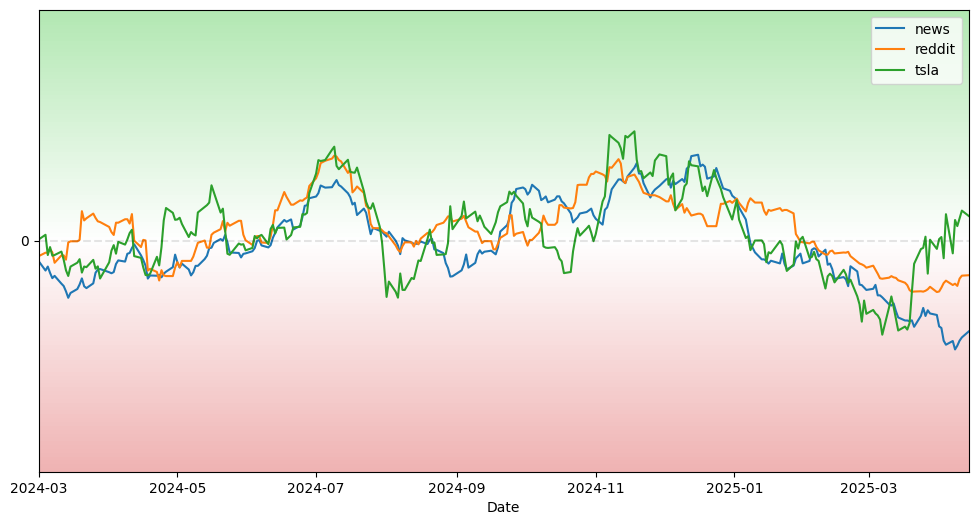

In [16]:
ma_value = 20
for i in [ma_value]:
    graph([score1, score2, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])

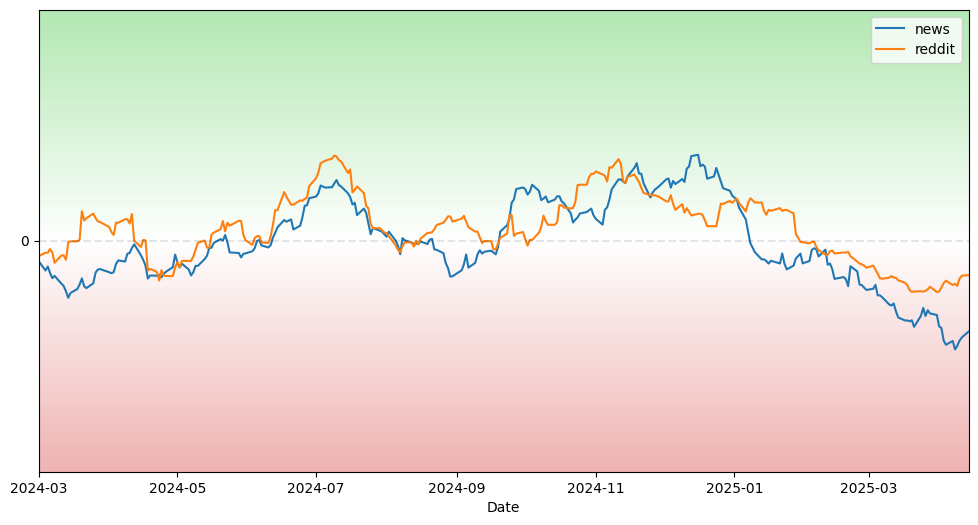

In [32]:
ma_value = 20
for i in [ma_value]:
    graph([score1, score2], i, with_mean=[True, True], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1)], label=['news', 'reddit'])

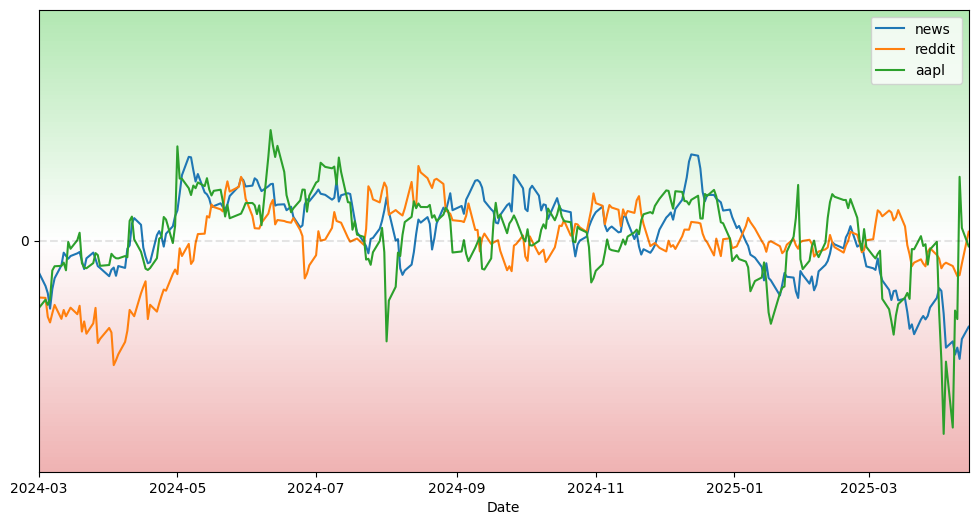

In [ ]:
ma_value = 0.1
for i in [ma_value]:
    graph([score1, score2, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])

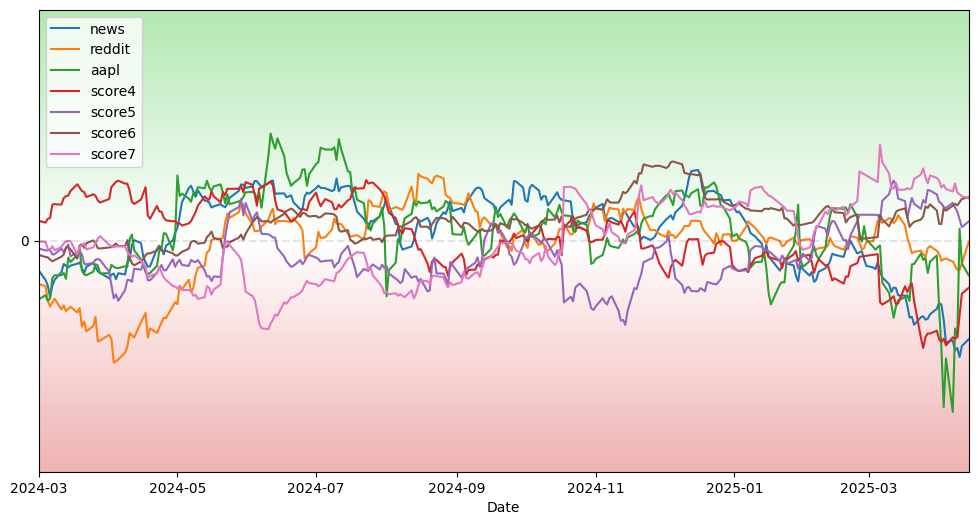

In [ ]:
ma_value = 0.05
for i in [ma_value]:
    graph([score1, score2, score3, score4, score5, score6, score7], i, with_mean=[True, True, False, True, True, True, True], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2), cmap(3), cmap(4), cmap(5), cmap(6)], label=['news', 'reddit', tic.lower(), 'score4', 'score5', 'score6', 'score7'])

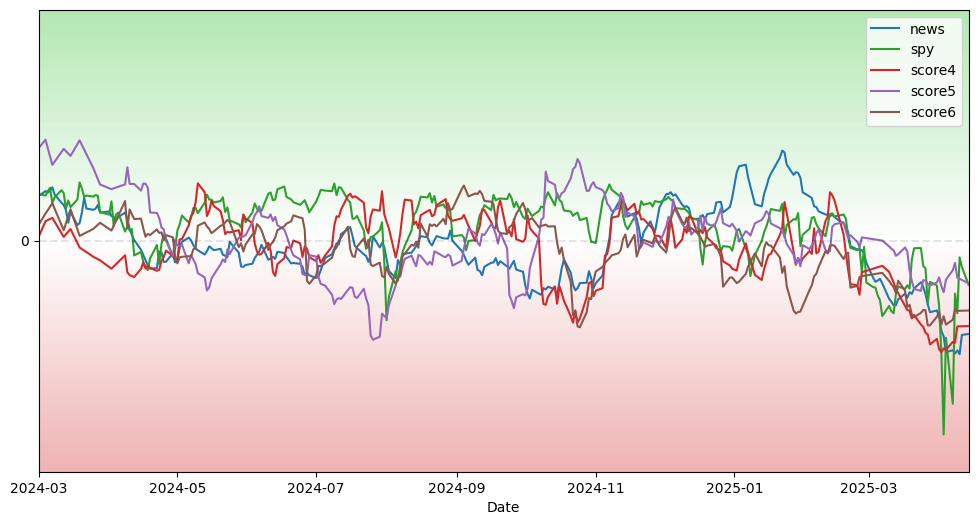

In [ ]:
ma_value = 0.05
for i in [ma_value]:
    graph([score1, score3, score4, score5, score6], i, with_mean=[True,  False, True, True, True], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(2), cmap(3), cmap(4), cmap(5), cmap(6)], label=['news', tic.lower(), 'score4', 'score5', 'score6'])

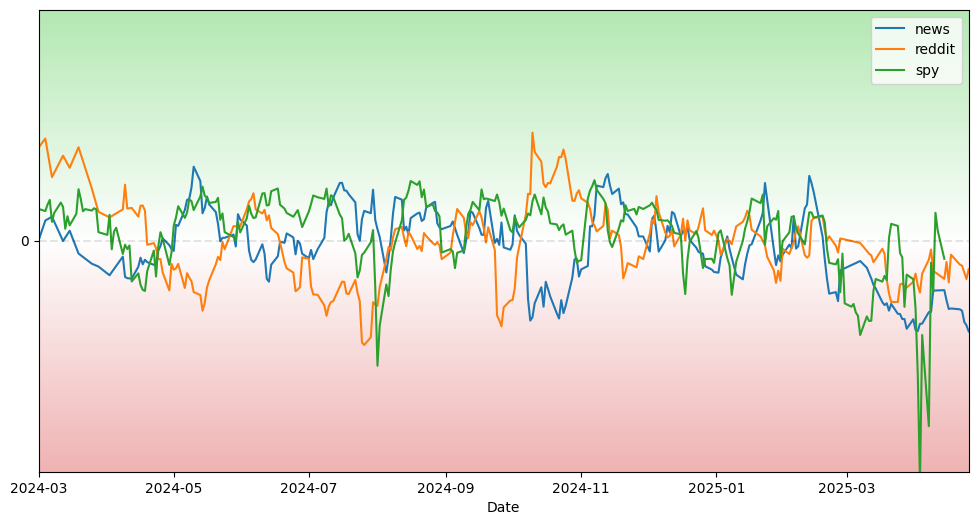

In [ ]:
ma_value = 0.1
for i in [ma_value]:
    graph([score4, score5, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])

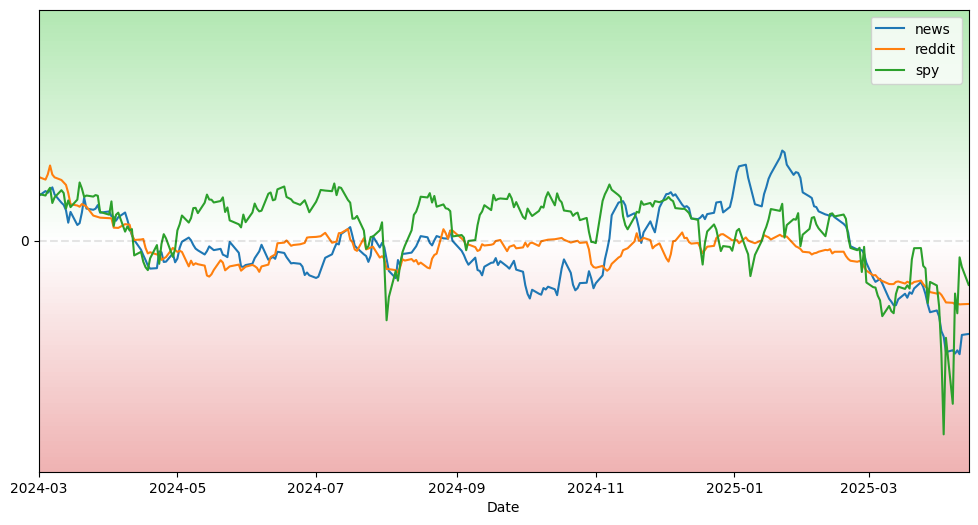

In [ ]:
ma_value = 0.05
for i in [ma_value]:
    graph([score1, score2, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])

In [ ]:
# prompt: calculate the lead lag correlation of the column EMA0.05_scaled between score1 and score3
import pandas as pd

def lead_lag_correlation(df1, df2, column_name, lags):
    """
    Calculates the lead-lag correlation between two dataframes.

    Args:
        df1: First dataframe.
        df2: Second dataframe.
        column_name: The name of the column to correlate. Both dataframes must have this column.
        lags: A list of lags to calculate correlation for (positive values mean df2 leads).

    Returns:
        A pandas Series with lag as index and the correlation as values.
    """
    correlations = pd.Series(index=lags)
    # Reindex the DataFrames to have a common index
    common_index = df1.index.intersection(df2.index)
    df1 = df1.reindex(common_index)
    df2 = df2.reindex(common_index)

    for lag in lags:
        if lag == 0:
            correlations.loc[lag] = df1[column_name].corr(df2[column_name])
        else:
            # Aligns the two columns considering the lag
            aligned_df1 = df1[column_name].shift(lag)
            aligned_df2 = df2[column_name]

            # Drops NA values created by the shift
            aligned_df1 = aligned_df1.dropna()
            # Reindex aligned_df2 to align with aligned_df1
            aligned_df2 = aligned_df2.reindex(aligned_df1.index)

            # Calculate and store the correlation
            correlations.loc[lag] = aligned_df1.corr(aligned_df2)
    return correlations

# Assuming 'score1', 'score3', and 'data' are defined from your previous code
# Replace 'EMA0.05_scaled' with the actual column name if different
lags = list(range(-8,9))  # Example lags: -5 to 5
correlation_result_news = lead_lag_correlation(score1, score3, f'EMA{ma_value}_scaled', lags)
print(correlation_result_news)
correlation_result_reddit = lead_lag_correlation(score2, score3, f'EMA{ma_value}_scaled', lags)
print(correlation_result_reddit)


-8    0.392866
-7    0.424482
-6    0.454821
-5    0.486086
-4    0.505942
-3    0.531404
-2    0.540318
-1    0.539835
 0    0.506214
 1    0.468842
 2    0.426051
 3    0.386369
 4    0.348842
 5    0.322495
 6    0.298441
 7    0.271445
 8    0.246480
dtype: float64
-8    0.559993
-7    0.546704
-6    0.555346
-5    0.554514
-4    0.553619
-3    0.553412
-2    0.547708
-1    0.541816
 0    0.530065
 1    0.512311
 2    0.500961
 3    0.487709
 4    0.466661
 5    0.449175
 6    0.430917
 7    0.413056
 8    0.399177
dtype: float64


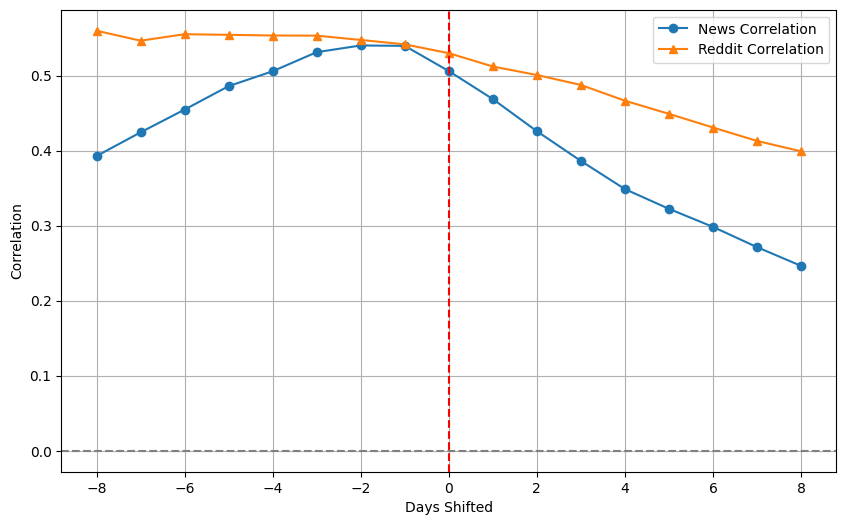

In [ ]:
# prompt: plot correlation_result_news and correlation_result_reddit

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(correlation_result_news.index, correlation_result_news.values, label='News Correlation', marker='o')
plt.plot(correlation_result_reddit.index, correlation_result_reddit.values, label='Reddit Correlation', marker='^' )
plt.axvline(x=0, color='red', linestyle='--')
plt.axhline(y=0, color='grey', linestyle='--')
plt.xlabel('Days Shifted')
plt.ylabel('Correlation')
# plt.title('Lead-Lag Correlation with Stock Movement')
plt.legend()
plt.grid(True)
plt.show()


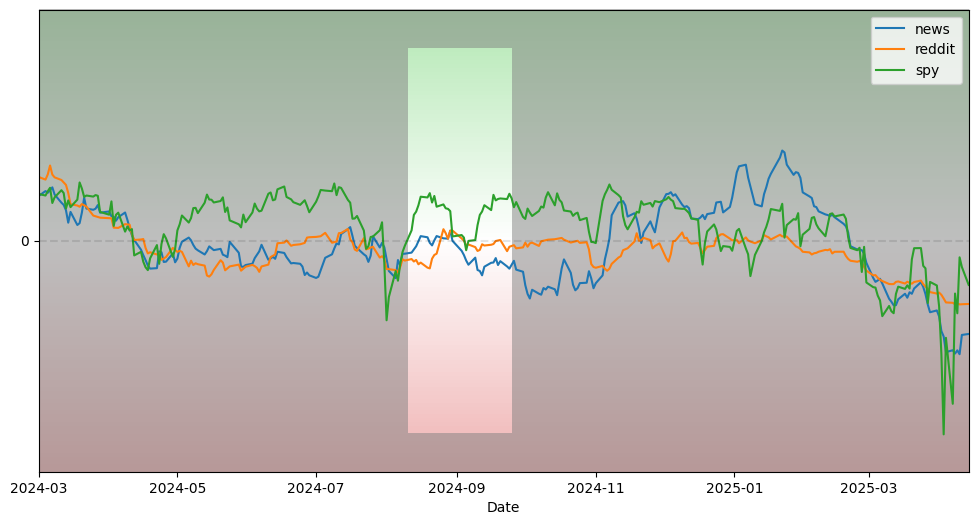

In [ ]:
graph3([score1, score2, score3], 0.05, with_mean=[True, True, False], hightlight=['2024-8-10', '2024-09-25'], color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit',tic.lower()])

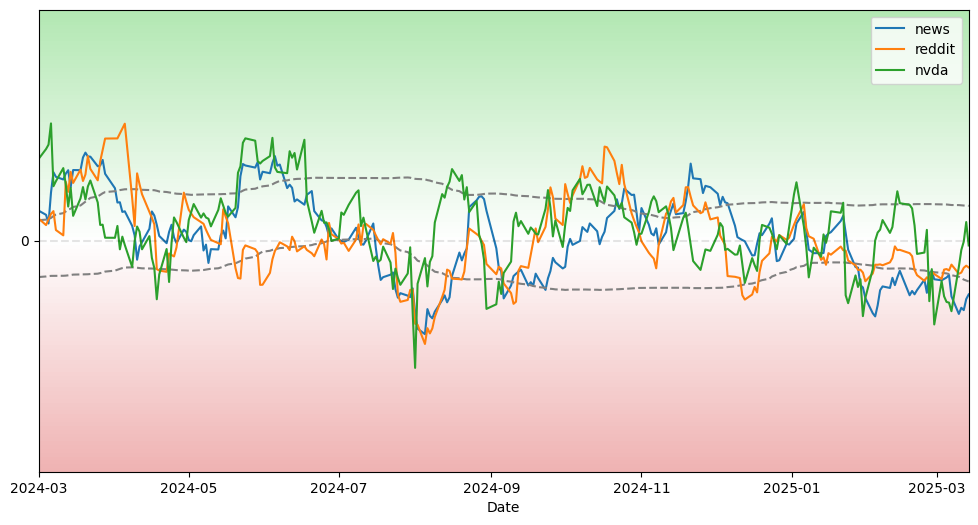

In [ ]:
graph4([score1, score2, score3], 0.1, windows=[100,None, None],with_mean=[True,True, False], vertical=None, text=None, hightlight=False, color=[cmap(0),cmap(1),  cmap(2)], label=['news', 'reddit',tic.lower()])

In [ ]:
# with open(f"/content/drive/MyDrive/eecs6414/data/news_{tic.lower()}_compare1.pkl", "wb") as f:
#     pickle.dump(score1, f)
# print("Save - ", f"/content/drive/MyDrive/eecs6414/data/news_{tic.lower()}_compare1.pkl")

# with open(f"/content/drive/MyDrive/eecs6414/data/reddit_{tic.lower()}_compare1.pkl", "wb") as f:
#     pickle.dump(score2, f)
# print("Save - ", f"/content/drive/MyDrive/eecs6414/data/reddit_{tic.lower()}_compare1.pkl")

# with open(f"/content/drive/MyDrive/eecs6414/data/stock_{tic.lower()}_compare1.pkl", "wb") as f:
#     pickle.dump(score3, f)
# print("Save - ", f"/content/drive/MyDrive/eecs6414/data/stock_{tic.lower()}_compare1.pkl")

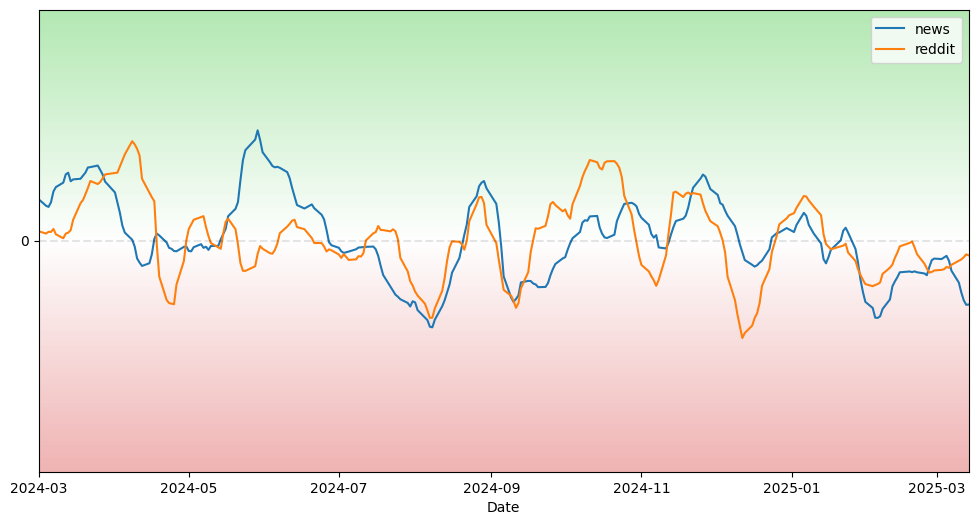

In [ ]:
graph([score1, score2], 0.2, with_mean=[True, True], color=[cmap(0), cmap(1)], label=['news', 'reddit'])

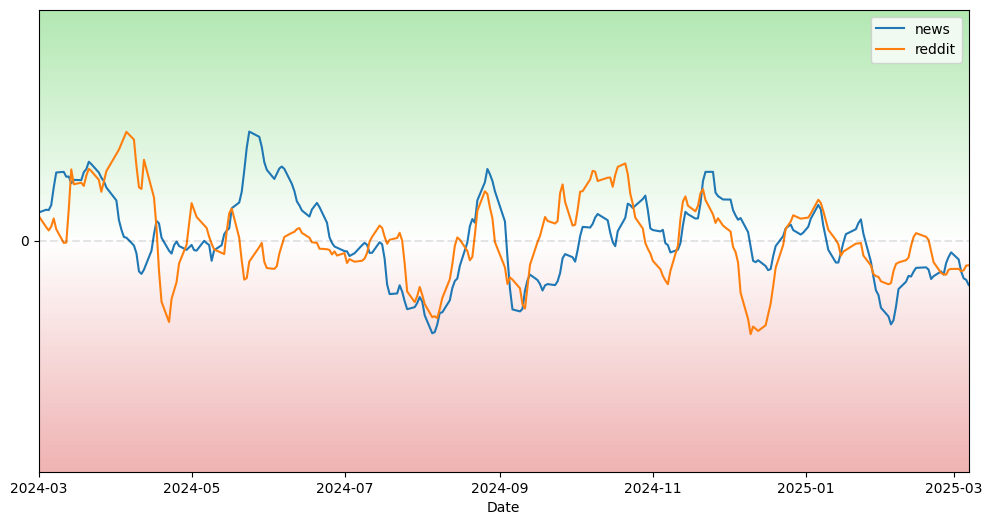

In [ ]:
c graph([score1, score2], 0.2, with_mean=[True, True], color=[cmap(0), cmap(1)], label=['news', 'reddit'])

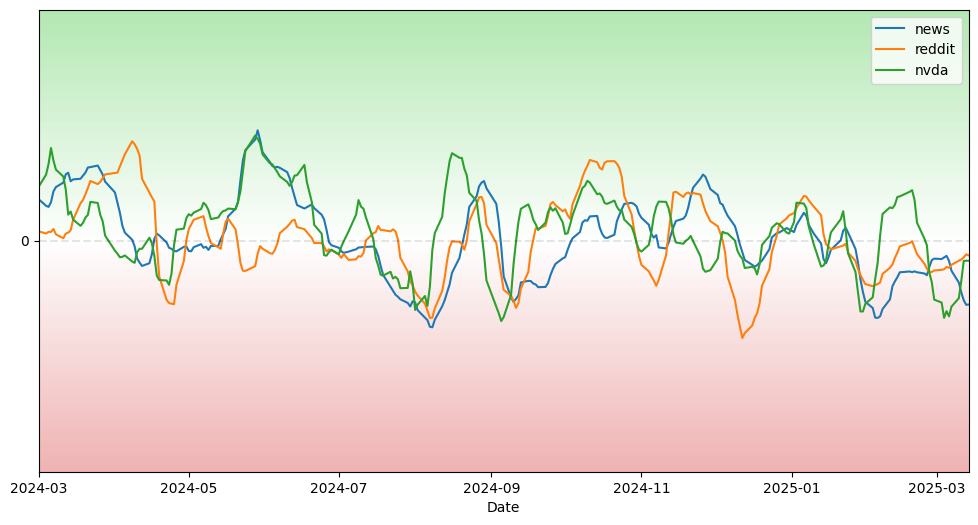

In [ ]:
graph([score1, score2, score3], 0.2, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])

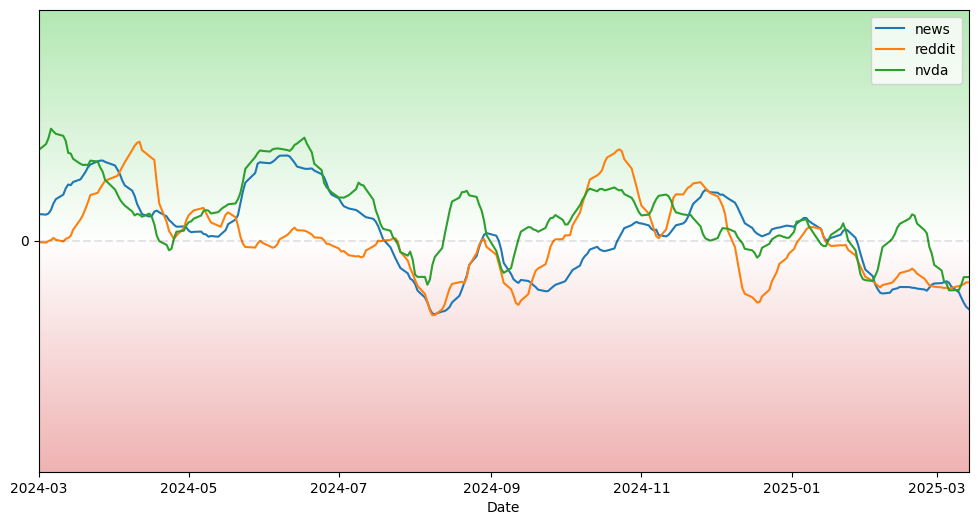

In [ ]:
graph([score1, score2, score3], 0.05, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])

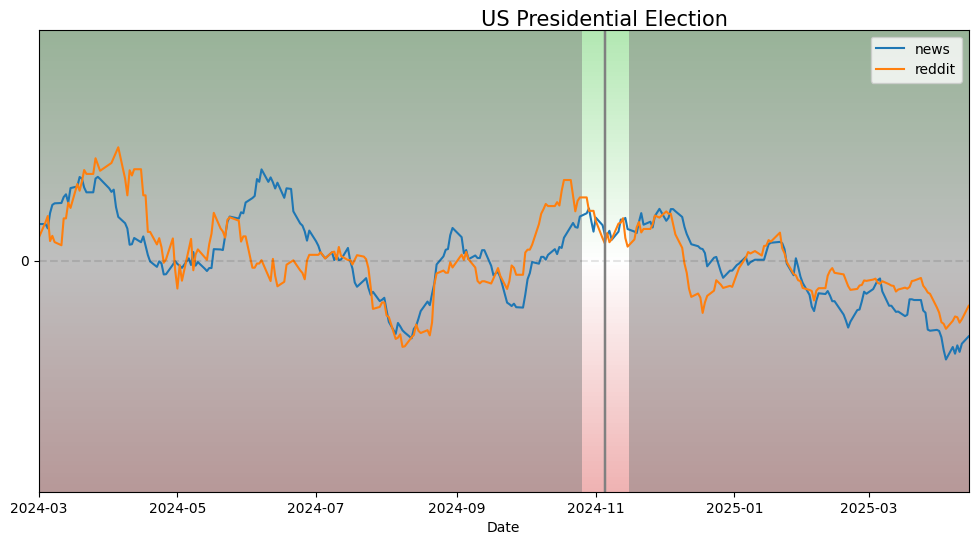

In [92]:
graph([score1, score2], 20, with_mean=True, vertical='2024-11-05', text='US Presidential Election', hightlight=[1.5, 1.5], color=[cmap(0), cmap(1)], label=['news', 'reddit'])

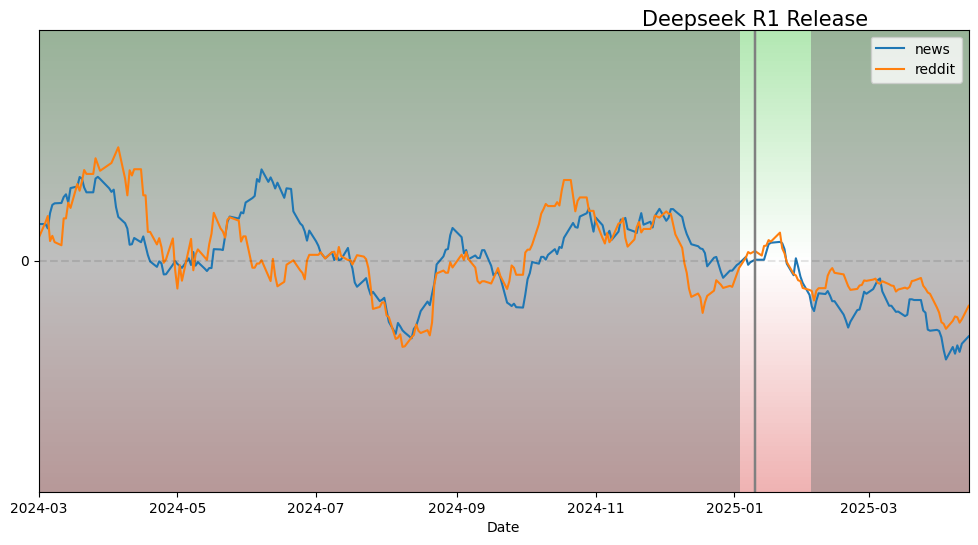

In [93]:
graph([score1, score2], 20, with_mean=True, vertical='2025-01-10', text='Deepseek R1 Release', hightlight=[1.0, 3.5], color=[cmap(0), cmap(1)], label=['news', 'reddit'])

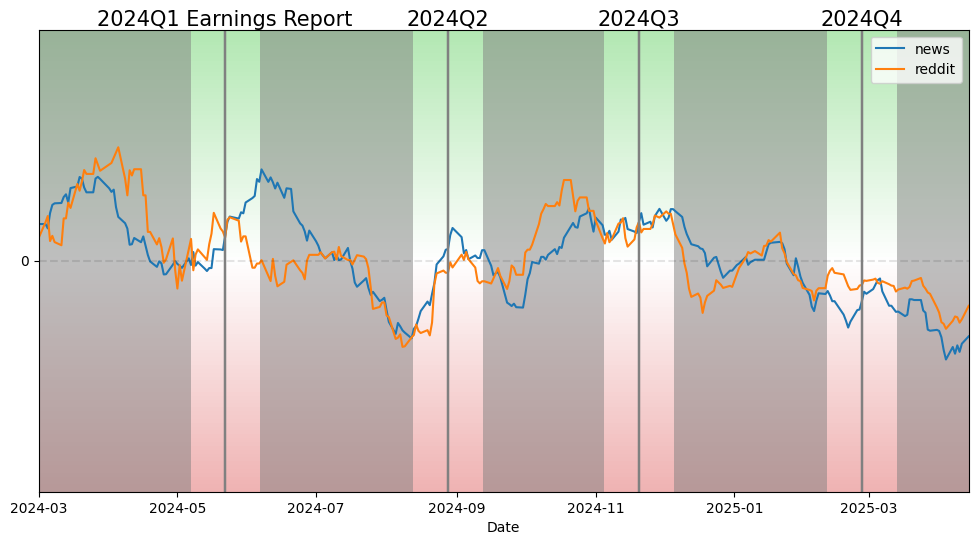

In [96]:
graph2([score1, score2], 20, with_mean=True, vertical=['2024-05-22', '2024-08-28', '2024-11-20', '2025-02-26'], text=['2024Q1 Earnings Report', '2024Q2', '2024Q3', '2024Q4'], hightlight=[2.2, 2.2], color=[cmap(0), cmap(1)], label=['news', 'reddit'])

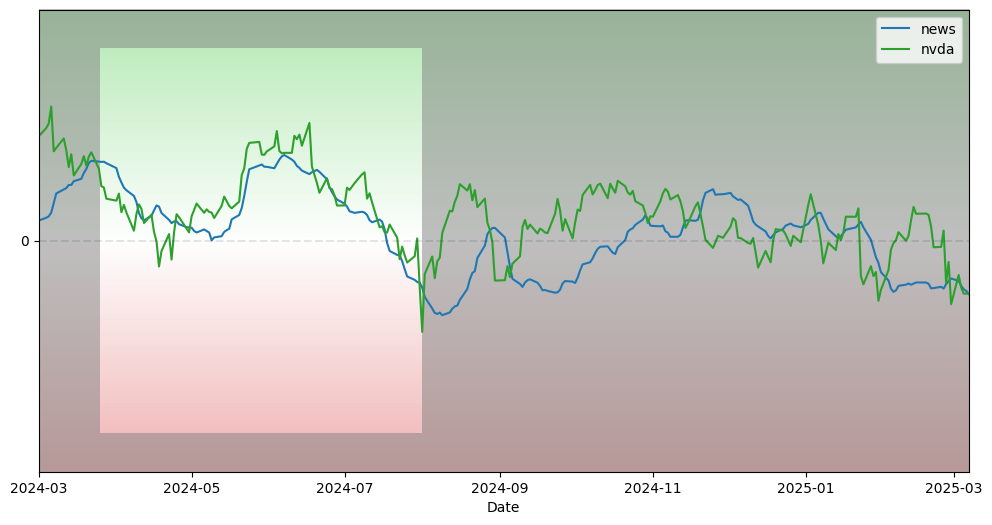

In [ ]:
graph3([score1, score3], 0.05, with_mean=[True, False], hightlight=['2024-03-25', '2024-08-01'], color=[cmap(0), cmap(2)], label=['news', tic.lower()])

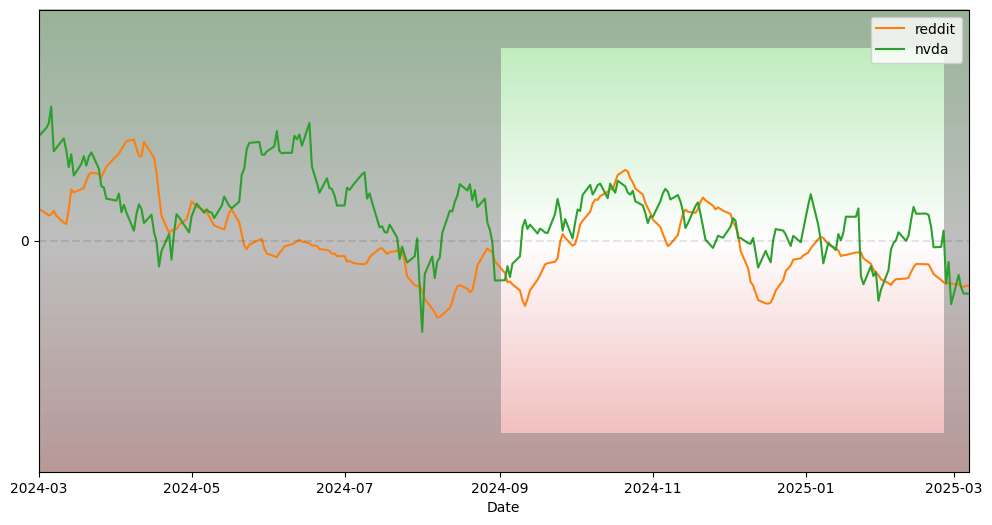

In [ ]:
graph3([score2, score3], 0.05, with_mean=[True, False], hightlight=['2024-09-01', '2025-02-25'], color=[cmap(1), cmap(2)], label=['reddit', tic.lower()])

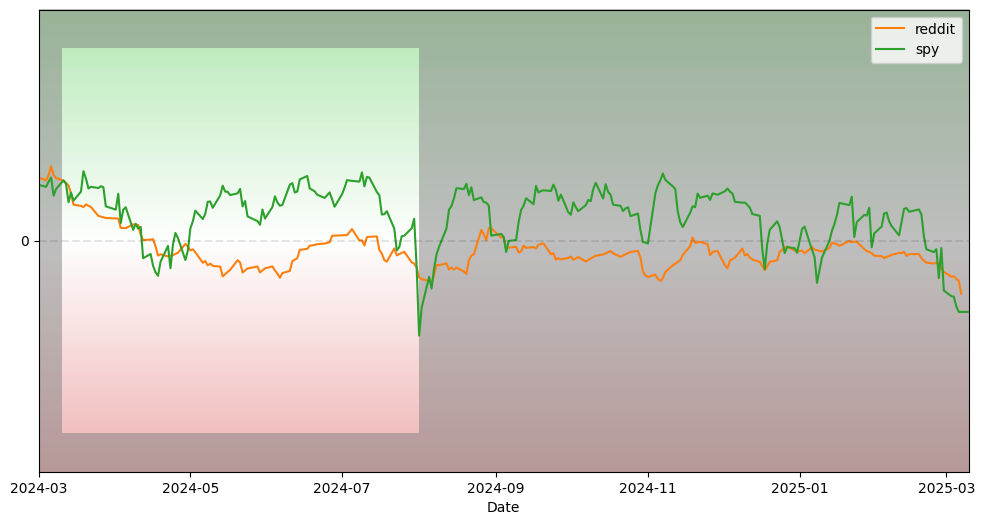

In [ ]:
graph3([score2, score3], 0.05, with_mean=[True, False], hightlight=['2024-03-10', '2024-08-01'], color=[cmap(1), cmap(2)], label=['reddit', tic.lower()])

In [ ]:
score2

,sentiment,count,rolling_sum,rolling_count,score,EMA0.05,EMA0.05_scaled,EMA0.2,EMA0.2_scaled
date,,,,,,,,,
2023-09-01,1,1,1.0,1.0,1.000000,NaN,NaN,NaN,NaN
2023-09-08,0,1,0.0,1.0,0.000000,NaN,NaN,NaN,NaN
2023-09-22,0,1,0.0,1.0,0.000000,NaN,NaN,NaN,NaN
2023-10-13,0,1,0.0,1.0,0.000000,NaN,NaN,NaN,NaN
2023-10-17,0,1,0.0,1.0,0.000000,NaN,NaN,NaN,NaN
2023-10-31,0,1,0.0,1.0,0.000000,NaN,NaN,NaN,NaN
2023-11-17,0,1,0.0,1.0,0.000000,NaN,NaN,NaN,NaN
2023-11-21,0,1,0.0,1.0,0.000000,NaN,NaN,NaN,NaN
2023-11-28,0,1,0.0,1.0,0.000000,NaN,NaN,NaN,NaN


In [ ]:
for tic in ['TSLA', 'AAPL', 'NVDA', 'SPY', 'PLTR', 'META']:
    windows = 1
    version = 7
    ma_value = 0.08
    with open(f"/content/drive/MyDrive/eecs6414/data/{tic.lower()}_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)

    _news_df = pd.DataFrame(news_df['answer'])
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    _news_df['sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})
    # score1 = _news_df.groupby('date')['score'].mean()
    score1 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score1['count'] = pd.DataFrame(_news_df.groupby('date')['sentiment'].count())
    score1['rolling_sum'] = score1.rolling(windows)['sentiment'].sum()
    score1['rolling_count'] = score1.rolling(windows)['count'].sum()
    score1['score'] = score1['rolling_sum'] / score1['rolling_count'] + 0.04
    # score1['score'] = score1['rolling_sum']
    score1 = score1[score1.index >= '2023-09-01']
    score1 = pd.DataFrame(score1)

    with open(f"/content/drive/MyDrive/eecs6414/data/reddit_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)

    _news_df = news_df[(news_df.index.get_level_values(1).isin([tic]))]
    # _news_df = news_df
    _news_df.loc[:,'answer'] = _news_df['answer']
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    print(_news_df[_news_df['answer'] == 'positive'].shape)
    print(_news_df[_news_df['answer'] == 'negative'].shape)
    print(_news_df[_news_df['answer'] == 'neutral'].shape)
    print(_news_df[_news_df['answer'] == 'unknown'].shape)
    _news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})

    score2 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score2['count'] = _news_df.groupby('date')['sentiment'].count()
    score2['rolling_sum'] = score2.rolling(windows)['sentiment'].sum()
    score2['rolling_count'] = score2.rolling(windows)['count'].sum()
    score2['score'] = score2['rolling_sum'] / score2['rolling_count'] + 0.0596
    # score2['score'] = score2['rolling_sum']

    score2 = score2[score2.index >= '2023-09-01']
    score2 = pd.DataFrame(score2)


    # prompt: use yfinance to download the stock price info for nvda starting from 2022-01-01 till now
    import yfinance as yf
    # Download data
    data = yf.download([tic], start="2023-09-01")
    # data = yf.download(["TSLA"], start="2023-09-01")
    # Print the data (optional)
    data.columns = data.columns.get_level_values(0)
    data = data.shift(-1)
    data['movement'] = data['Open'].shift(-1)/data['Open'] - 1
    data['score'] = data['movement'].rolling(windows).mean()
    score3 = pd.DataFrame(data['score'])
    score3 = score3[score3.index <= '2025-03-14']
    # score3 = pd.DataFrame(score3)

    for i in [ma_value]:
        graph([score1, score2, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()], verbose=-1)
    # prompt: calculate the correlation of the column EMA0.05_scaled between score1 and score2

    import pandas as pd

    print(tic)
    # Calculate the correlation
    correlation = score1[f'EMA{ma_value}_scaled'].corr(score3[f'EMA{ma_value}_scaled'])

    print(f"The correlation between 'EMA{ma_value}_scaled' in score1 and score3 is: {correlation}")
    correlation = score2[f'EMA{ma_value}_scaled'].corr(score3[f'EMA{ma_value}_scaled'])
    print(f"The correlation between 'EMA{ma_value}_scaled' in score2 and score3 is: {correlation}")


(10106, 1)
(4197, 6)
(662, 6)
(588, 6)
(2947, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed


TSLA
The correlation between 'EMA0.08_scaled' in score1 and score3 is: 0.648709763211721
The correlation between 'EMA0.08_scaled' in score2 and score3 is: 0.5942283902954358
(10048, 1)
(2638, 6)
(386, 6)
(395, 6)
(1857, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed


AAPL
The correlation between 'EMA0.08_scaled' in score1 and score3 is: 0.5869142882936483
The correlation between 'EMA0.08_scaled' in score2 and score3 is: 0.20606153679851924
(10004, 1)
(3199, 6)
(442, 6)
(322, 6)
(2435, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed


NVDA
The correlation between 'EMA0.08_scaled' in score1 and score3 is: 0.4051119298516448
The correlation between 'EMA0.08_scaled' in score2 and score3 is: 0.29838806452269556
(10296, 1)
(4275, 6)
(195, 6)
(682, 6)
(3398, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed


SPY
The correlation between 'EMA0.08_scaled' in score1 and score3 is: 0.3252005333909288
The correlation between 'EMA0.08_scaled' in score2 and score3 is: 0.42219007971584455
(3435, 1)
(2567, 6)
(334, 6)
(140, 6)
(2093, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed


PLTR
The correlation between 'EMA0.08_scaled' in score1 and score3 is: 0.04121830096382324
The correlation between 'EMA0.08_scaled' in score2 and score3 is: 0.2839576793504102
(7444, 1)
(4203, 6)
(51, 6)
(1288, 6)
(2864, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed

META
The correlation between 'EMA0.08_scaled' in score1 and score3 is: 0.02098872092345184
The correlation between 'EMA0.08_scaled' in score2 and score3 is: 0.24771819308752627


In [ ]:
# for tic in ['TSLA', 'AAPL', 'NVDA', 'SPY', 'PLTR', 'META']:
for tic in ['NVDA']:
    windows = 1
    version = 7
    ma_value = 0.25
    with open(f"/content/drive/MyDrive/eecs6414/data/{tic.lower()}_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)

    _news_df = pd.DataFrame(news_df['answer'])
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    _news_df['sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})
    # score1 = _news_df.groupby('date')['score'].mean()
    score1 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score1['count'] = pd.DataFrame(_news_df.groupby('date')['sentiment'].count())
    score1['rolling_sum'] = score1.rolling(windows)['sentiment'].sum()
    score1['rolling_count'] = score1.rolling(windows)['count'].sum()
    score1['score'] = score1['rolling_sum'] / score1['rolling_count'] + 0.04
    # score1['score'] = score1['rolling_sum']
    score1 = score1[score1.index >= '2023-09-01']
    score1 = pd.DataFrame(score1)

    with open(f"/content/drive/MyDrive/eecs6414/data/reddit_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)

    _news_df = news_df[(news_df.index.get_level_values(1).isin([tic]))]
    # _news_df = news_df
    _news_df.loc[:,'answer'] = _news_df['answer']
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    print(_news_df[_news_df['answer'] == 'positive'].shape)
    print(_news_df[_news_df['answer'] == 'negative'].shape)
    print(_news_df[_news_df['answer'] == 'neutral'].shape)
    print(_news_df[_news_df['answer'] == 'unknown'].shape)
    _news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})

    score2 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score2['count'] = _news_df.groupby('date')['sentiment'].count()
    score2['rolling_sum'] = score2.rolling(windows)['sentiment'].sum()
    score2['rolling_count'] = score2.rolling(windows)['count'].sum()
    score2['score'] = score2['rolling_sum'] / score2['rolling_count'] + 0.0596
    # score2['score'] = score2['rolling_sum']

    score2 = score2[score2.index >= '2023-09-01']
    score2 = pd.DataFrame(score2)


    # prompt: use yfinance to download the stock price info for nvda starting from 2022-01-01 till now
    import yfinance as yf
    # Download data
    data = yf.download([tic], start="2023-09-01")
    # data = yf.download(["TSLA"], start="2023-09-01")
    # Print the data (optional)
    data.columns = data.columns.get_level_values(0)
    data = data.shift(-1)
    data['movement'] = data['Open'].shift(-1)/data['Open'] - 1
    data['score'] = data['movement'].rolling(windows).mean()
    score3 = pd.DataFrame(data['score'])
    score3 = score3[score3.index <= '2025-03-14']
    # score3 = pd.DataFrame(score3)

    for i in [ma_value]:
        graph([score1, score2, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()], verbose=-1)
    # prompt: calculate the correlation of the column EMA0.05_scaled between score1 and score2


    # Assuming 'score1', 'score3', and 'data' are defined from your previous code
    # Replace 'EMA0.05_scaled' with the actual column name if different
    lags = list(range(-8,9))  # Example lags: -5 to 5
    print(tic)
    correlation_result_news = lead_lag_correlation(score1, score3, f'EMA{ma_value}_scaled', lags)
    print(correlation_result_news[correlation_result_news == correlation_result_news.max()])
    correlation_result_reddit = lead_lag_correlation(score2, score3, f'EMA{ma_value}_scaled', lags)
    print(correlation_result_reddit[correlation_result_reddit == correlation_result_reddit.max()])
    print("="* 50)

(10004, 1)
(3199, 6)
(442, 6)
(322, 6)
(2435, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed

NVDA
-2    0.433312
dtype: float64
-2    0.342969
dtype: float64


In [ ]:
correlation_result_news

,0
-8,0.388632
-7,0.415337
-6,0.417335
-5,0.408139
-4,0.390142
-3,0.406412
-2,0.433312
-1,0.379784
0,0.203041
1,0.076835


In [ ]:
correlation_result_reddit

,0
-8,0.244172
-7,0.244784
-6,0.282146
-5,0.307834
-4,0.304543
-3,0.300533
-2,0.342969
-1,0.336913
0,0.253787
1,0.106769


In [ ]:
# prompt: calculate the lead lag correlation of the column EMA0.05_scaled between score1 and score3
import pandas as pd

def lead_lag_correlation(df1, df2, column_name, lags):
    """
    Calculates the lead-lag correlation between two dataframes.

    Args:
        df1: First dataframe.
        df2: Second dataframe.
        column_name: The name of the column to correlate. Both dataframes must have this column.
        lags: A list of lags to calculate correlation for (positive values mean df2 leads).

    Returns:
        A pandas Series with lag as index and the correlation as values.
    """
    correlations = pd.Series(index=lags)
    # Reindex the DataFrames to have a common index
    common_index = df1.index.intersection(df2.index)
    df1 = df1.reindex(common_index)
    df2 = df2.reindex(common_index)

    for lag in lags:
        if lag == 0:
            correlations.loc[lag] = df1[column_name].corr(df2[column_name])
        else:
            # Aligns the two columns considering the lag
            aligned_df1 = df1[column_name].shift(lag)
            aligned_df2 = df2[column_name]

            # Drops NA values created by the shift
            aligned_df1 = aligned_df1.dropna()
            # Reindex aligned_df2 to align with aligned_df1
            aligned_df2 = aligned_df2.reindex(aligned_df1.index)

            # Calculate and store the correlation
            correlations.loc[lag] = aligned_df1.corr(aligned_df2)
    return correlations

# Assuming 'score1', 'score3', and 'data' are defined from your previous code
# Replace 'EMA0.05_scaled' with the actual column name if different
lags = list(range(-8,9))  # Example lags: -5 to 5
correlation_result_news = lead_lag_correlation(score1, score3, f'EMA{ma_value}_scaled', lags)
print(correlation_result_news[correlation_result_news == correlation_result_news.max()])
correlation_result_reddit = lead_lag_correlation(score2, score3, f'EMA{ma_value}_scaled', lags)
print(correlation_result_reddit[correlation_result_reddit == correlation_result_reddit.max()])


-2    0.073644
dtype: float64
-1    0.25533
dtype: float64


In [ ]:
correlation_result_news[correlation_result_news == correlation_result_news.max()]

,0
-2,0.073644


In [ ]:
with open("/content/drive/MyDrive/eecs6414/data/reddit_chat3.pkl", "rb") as f:
    reddit_2 = pickle.load(f)

In [ ]:
reddit_2.subreddit.unique()

array(['tesla', 'facebook', 'apple', 'aapl', 'investing',
       'wallstreetbets', 'options', 'stockmarket', 'nvidia',
       'teslalounge', 'teslainvestorsclub', 'stocks', 'facebookads',
       'pltr', 'palantir_investors', 'wallstreetbetsnew',
       'wallstreetbetselite', 'tslalounge', 'tsla', 'nvda_stock',
       'palantir', 'nvidiastock'], dtype=object)

Below is an analysis of the stock sentiment of NVIDIA (NVDA) based on news headlines and Reddit posts, alongside the NVDA stock price movement, as depicted in the six provided line graphs. The graphs span a period from March 2024 to March 2025, with the blue curve representing news headline sentiment, the orange curve representing Reddit post sentiment, and the green curve or shaded area representing NVDA stock price movement. The analysis examines trends, correlations, and divergences between these elements.

---

### Graph-by-Graph Analysis

#### Graph 0: General Sentiment and Stock Price Trends
- **Timeline**: March 2024 to February 2025.
- **News Sentiment (Blue Curve)**: Fluctuates around the neutral line (0.0), starting near zero, dipping slightly in April 2024, peaking above zero in May 2024, and showing a downward trend from late 2024 (October–December), reaching a low in January 2025 before a slight recovery.
- **Reddit Sentiment (Orange Curve)**: More volatile and generally more positive, peaking near +0.5 around April–May 2024, then declining but staying mostly above zero until late 2024, with minor dips below zero in early 2025.
- **Stock Price Movement (Green Shaded Area)**: Green shading (rising prices) dominates from March to July 2024, transitioning to pink (declining prices) from August 2024 onward, indicating a decline through February 2025.
- **Observation**: The stock price decline aligns with a negative shift in news sentiment in late 2024, while Reddit sentiment remains more positive but less correlated with price movement.

#### Graph 1: "Deepseek R1 Release"
- **Timeline**: March 2024 to February 2025.
- **News Sentiment (Blue Curve)**: Starts slightly positive, fluctuates around zero, dips sharply around November 2024, and declines further in early 2025, ending below zero.
- **Reddit Sentiment (Orange Curve)**: Begins higher, peaks in April 2024, declines through mid-2024, rises slightly in October 2024, and then falls below zero by early 2025, though less negative than news sentiment.
- **Stock Price Movement (Green Curve)**: Not visible in the graph (possibly an omission), but pink shading from November 2024 to February 2025 suggests a decline.
- **Observation**: The sharp drop in news sentiment around November 2024, possibly tied to the "Deepseek R1 Release," coincides with negative market conditions (pink shading), hinting at an event-driven impact on sentiment and potentially price.

#### Graph 2: Sentiment and Price with Background Phases
- **Timeline**: March 2024 to March 2025.
- **News Sentiment (Blue Curve)**: Stays near zero with moderate fluctuations, trending downward slightly by early 2025.
- **Reddit Sentiment (Green Curve)**: Misidentified as green (should be orange); shows greater volatility, with sharper peaks and troughs, declining below zero in early 2025.
- **Stock Price Movement (Green Curve)**: Starts above zero, declines with some recovery mid-2024, then drops below zero by March 2025.
- **Observation**: Pink shading (March–July 2024) and green shading (July 2024–March 2025) may indicate market phases, but sentiment and price show a general decline toward the end, with Reddit sentiment more erratic.

#### Graph 3: Quarterly Earnings Impact
- **Timeline**: March 2024 to February 2025, segmented by quarterly earnings (2024Q1–Q4).
- **News Sentiment (Blue Curve)**: Peaks in April 2024 (Q1 earnings), dips sharply mid-2024, stays negative through Q2–Q3, and declines further in late 2024–early 2025.
- **Reddit Sentiment (Orange Curve)**: Peaks with news sentiment in April 2024, declines gradually, and hovers near zero with less volatility than news sentiment.
- **Stock Price Movement (Green Curve)**: Rises sharply to a peak in April 2024, declines steadily through Q2–Q3, and drops significantly by late 2024–early 2025.
- **Observation**: Sentiment peaks align with stock price peaks around earnings (e.g., Q1), but the prolonged decline in price and news sentiment suggests broader negative trends.

#### Graph 4: Sentiment and Price Fluctuations
- **Timeline**: March 2024 to March 2025.
- **News Sentiment (Blue Curve)**: Moderate fluctuations, dipping below zero mid-2024, rising late 2024, and declining sharply in early 2025.
- **Reddit Sentiment (Orange Curve)**: Highly volatile, peaking mid-2024 near +1.0, with multiple swings, ending below zero in early 2025.
- **Stock Price Movement (Green Curve)**: Gradual fluctuations, peaking mid-2024, then declining steadily, ending slightly below zero.
- **Observation**: Reddit sentiment shows exaggerated swings not mirrored by the stock price, while news sentiment aligns more closely with the price decline in early 2025.

#### Graph 6: Reddit and Price Focus
- **Timeline**: March 2024 to March 2025.
- **News Sentiment (Blue Curve)**: Missing from the graph.
- **Reddit Sentiment (Orange Curve)**: Highly volatile, peaking near +0.4 in April 2024, dipping below zero by July 2024, and fluctuating around zero from November 2024 onward.
- **Stock Price Movement (Green Curve)**: Stable near zero, with minor fluctuations, ending near zero in March 2025.
- **Observation**: Reddit sentiment swings dramatically, but the stock price remains stable, suggesting limited direct influence from social media sentiment alone.

---

### Key Findings

#### Sentiment Trends
- **News Headlines (Blue Curve)**: Generally stable around neutral (0.0), with notable negative shifts in late 2024 and early 2025 across multiple graphs. It reacts to events (e.g., "Deepseek R1 Release," earnings reports) with sharper declines.
- **Reddit Posts (Orange Curve)**: More volatile and often more positive than news sentiment, peaking significantly in mid-2024 (e.g., April–May), but also declining toward early 2025. Reflects retail investor enthusiasm or speculation.

#### Stock Price Movement (Green Curve/Shading)
- Starts strong (rising or stable) from March to mid-2024, peaking around April 2024 in some graphs (e.g., Graph 3), then declines steadily from mid-2024 (July–August) through early 2025, often ending below zero.

#### Correlations and Divergences
- **Alignment**: News sentiment often correlates with stock price movements, particularly during declines (e.g., Graph 0: negative news sentiment in late 2024 aligns with pink shading; Graph 3: price peaks with sentiment around earnings). Reddit sentiment shows some alignment (e.g., Graph 3: Q1 peak), but its volatility reduces consistency.
- **Divergences**: Reddit sentiment’s wild swings (e.g., Graph 4, Graph 6) do not always reflect stock price trends, which remain more stable (e.g., Graph 6: price near zero despite Reddit fluctuations). This suggests other factors (e.g., financial fundamentals, institutional actions) influence price beyond sentiment.

#### Event Impact
- Specific events like the "Deepseek R1 Release" (Graph 1) and quarterly earnings (Graph 3) trigger sentiment shifts. For instance, the November 2024 dip in Graph 1 and Q1 peak in Graph 3 show event-driven sentiment affecting price trends.

---

### Overall Relationship
- **News Sentiment**: Appears to have a closer relationship with stock price movements, likely due to its basis in factual reporting or analysis. Negative shifts in news sentiment often precede or coincide with price declines (e.g., late 2024 across graphs).
- **Reddit Sentiment**: Captures retail investor mood but is less reliable as a predictor of stock price, given its volatility and lack of consistent correlation (e.g., Graph 6).
- **Conclusion**: While sentiment influences NVDA stock price—particularly news sentiment—the relationship is not straightforward. External factors likely moderate the impact of sentiment, especially from Reddit, on price movements.

This analysis provides a comprehensive view of how news and Reddit sentiment interact with NVDA’s stock price, highlighting both their predictive potential and limitations.

To determine whether news headline sentiment or Reddit post sentiment can predict NVIDIA (NVDA) stock price movement based on the provided graphs, we need to analyze the relationships between these sentiment metrics and stock price trends across the six graphs (Graphs 0, 1, 2, 3, 4, and 6; Graph 5 is not relevant). The graphs span from March 2024 to March 2025 and include sentiment data from news headlines and Reddit posts, with some also plotting NVDA stock price movement. Below, I’ll evaluate each graph to identify patterns where sentiment changes might precede or align with stock price movements, indicating potential predictive power.

---

### Graph-by-Graph Analysis

#### **Graph 0: News and Reddit Sentiment with Stock Price Shading**
- **Description**: This graph plots news sentiment (blue) and Reddit sentiment (orange) from March 2024 to February 2025, with background shading indicating stock price movement (green for rising, pink/red for declining).
- **Observations**:
  - **News Sentiment**: Fluctuates around zero, trending downward from August 2024, becoming significantly negative by February 2025.
  - **Reddit Sentiment**: More volatile but generally positive until late 2024, then declines toward neutral by February 2025.
  - **Stock Price**: Rises (green shading) until July 2024, then declines (pink/red shading) from November 2024 to February 2025.
- **Analysis**: The stock price decline aligns with the negative shift in news sentiment in late 2024, suggesting a possible correlation. Reddit sentiment, remaining positive longer, does not align as closely with the price drop, indicating weaker predictive power.

#### **Graph 1: "Deepseek R1 Release" Event**
- **Description**: Plots news (blue) and Reddit (orange) sentiment, with a vertical line around October 2024 marking the "Deepseek R1 Release" event. Background shifts from green (March–October 2024) to pink (October 2024–February 2025).
- **Observations**:
  - Both sentiments peak around mid-2024, then drop sharply post-October 2024, with news sentiment declining more steeply.
  - The pink shading post-October suggests a negative period, potentially a stock price decline.
- **Analysis**: The sharp drop in news sentiment around November 2024 coincides with or slightly precedes the implied stock price decline (pink shading), hinting at predictive potential. Reddit sentiment also drops but less consistently, suggesting less reliability.

#### **Graph 2: News and NVDA Sentiment**
- **Description**: Plots news sentiment (blue) and NVDA sentiment (green, possibly Reddit or stock-related) with pink (March–July 2024) and green (July 2024–March 2025) shading.
- **Observations**:
  - Both lines fluctuate around zero, with news sentiment showing more volatility and a downward trend by March 2025.
  - Shading interpretation is unclear without explicit stock price data.
- **Analysis**: Without clear stock price data, it’s difficult to assess prediction. If green is stock price, its stability contrasts with volatile news sentiment, suggesting limited predictive power here.

#### **Graph 3: Quarterly Earnings Segmentation**
- **Description**: Plots news (blue) and Reddit (orange) sentiment, segmented by quarterly earnings (Q1–Q4 2024) with vertical bars marking reports.
- **Observations**:
  - News sentiment dips sharply (e.g., Q2 around July 2024, Q4 in early 2025), while Reddit sentiment is smoother but also dips around earnings.
  - Stock price isn’t plotted, but earnings often influence prices.
- **Analysis**: Sentiment dips before or during earnings could precede stock price reactions. News sentiment’s sharper drops suggest it might reflect market expectations more reliably than Reddit sentiment.

#### **Graph 4: News, Reddit, and NVDA Stock Price**
- **Description**: Plots news (blue), Reddit (orange), and NVDA stock price (green) from March 2024 to March 2025, with green (above zero) and pink (below zero) shading.
- **Observations**:
  - **Stock Price**: Peaks around July 2024, declines from November 2024, and drops sharply below zero by March 2025.
  - **Reddit Sentiment**: Peaks in May 2024, fluctuates, and drops sharply in early 2025.
  - **News Sentiment**: Fluctuates around zero, dropping sharply with stock price in early 2025.
- **Analysis**: Reddit sentiment peaks before the stock price peak, suggesting a potential lead. However, the sharp declines in all three lines (January–March 2025) align simultaneously, not clearly showing sentiment leading price. News sentiment tracks price declines closely, indicating correlation but not consistent precedence.

#### **Graph 6: Reddit Sentiment and NVDA Stock Price**
- **Description**: Plots Reddit sentiment (orange) and NVDA stock price (green) from March 2024 to March 2025, with gray (March–September 2024) and pink (September 2024–March 2025) shading.
- **Observations**:
  - Reddit sentiment fluctuates significantly, peaking in April and November 2024.
  - Stock price remains relatively stable, mostly below zero after June 2024.
- **Analysis**: The stock price’s stability despite Reddit sentiment’s volatility suggests Reddit sentiment has little predictive power here.

---

### Synthesis: Can Sentiment Predict Stock Price Movement?

#### **News Headline Sentiment**
- **Evidence of Predictive Power**:
  - **Graph 0**: Negative news sentiment in late 2024 aligns with stock price decline (pink shading), possibly preceding it slightly.
  - **Graph 1**: Sharp drop post-October 2024 event coincides with implied price decline, suggesting news reacts to or anticipates events affecting price.
  - **Graph 4**: News sentiment tracks stock price declines closely, especially in early 2025, though timing is often simultaneous.
- **Interpretation**: News sentiment shows a stronger correlation with stock price movements, particularly during significant events (e.g., Deepseek R1 Release, earnings). Its basis in factual reporting (e.g., earnings, product releases) likely makes it more responsive to market-moving information. While not always a clear leading indicator, it can predict price movements to some extent, especially around key events.

#### **Reddit Post Sentiment**
- **Evidence of Predictive Power**:
  - **Graph 4**: Peaks in May 2024 before stock price peaks in July 2024, hinting at a lead, but later declines align simultaneously with price drops.
  - **Graph 6**: High volatility contrasts with stable stock price, indicating no consistent predictive relationship.
  - **Graph 0**: Remains positive while stock price declines, showing divergence.
- **Interpretation**: Reddit sentiment is more volatile and less consistent with stock price movements. While it occasionally precedes price changes (e.g., Graph 4), its speculative nature and lack of alignment in other graphs (e.g., Graph 6) suggest it’s less reliable for prediction.

#### **Comparison and Conclusion**
- **News vs. Reddit**: News sentiment aligns more closely with stock price trends across multiple graphs, showing greater consistency and responsiveness to events. Reddit sentiment’s volatility and frequent divergence from price movements limit its predictive utility.
- **Limitations**: The graphs lack precise timing data (e.g., lags) and statistical analysis (e.g., correlation coefficients), making it hard to confirm causality or exact lead times. External factors (e.g., market conditions, macroeconomic events) also likely influence prices beyond sentiment.

---

### Final Answer
Yes, news headline sentiment can predict NVDA stock price movement to some extent, particularly around significant events, as it shows a closer and more consistent alignment with price trends. Reddit post sentiment, however, is less effective, exhibiting greater volatility and weaker correlation with stock price changes. While both can offer insights, news sentiment is the more reliable indicator based on the provided graphs.

Below is a detailed analysis of the stock sentiment for NVIDIA (NVDA) stock, based on the three provided line graphs comparing sentiment from news headlines (blue curve) and Reddit posts (orange curve) over the period from March 2024 to February 2025. The graphs use green backgrounds to indicate positive sentiment and red backgrounds for negative sentiment, with a neutral sentiment line at 0.0.

---

### **Graph 0: Quarterly Sentiment Analysis**
This graph divides the period into four quarters (2024Q1 to 2024Q4), with each quarter shaded green or red to reflect the overall sentiment.

- **2024Q1 (March to June 2024)**:  
  - **Background**: Green (positive sentiment).  
  - **News Sentiment (Blue Curve)**: Starts near neutral (0.0) in March, dips slightly below in early April, peaks sharply in mid-April, and fluctuates above or near neutral through June.  
  - **Reddit Sentiment (Orange Curve)**: Begins near neutral, rises gradually, peaks around mid-April, and declines steadily toward June, staying mostly positive.  
  - **Insight**: Sentiment is positive overall, with news showing sharper fluctuations and Reddit trending more smoothly but declining late in the quarter.

- **2024Q2 (June to September 2024)**:  
  - **Background**: Red (negative sentiment).  
  - **News Sentiment (Blue Curve)**: Drops below neutral in June, reaches a low in mid-July, and stays mostly negative through September.  
  - **Reddit Sentiment (Orange Curve)**: Declines from above neutral in June to below neutral by July, remaining negative with less volatility than news.  
  - **Insight**: Both sources turn negative, with news sentiment dropping more sharply.

- **2024Q3 (September to December 2024)**:  
  - **Background**: Green (positive sentiment).  
  - **News Sentiment (Blue Curve)**: Rises above neutral in October, peaks in mid-November, and declines slightly but stays positive through December.  
  - **Reddit Sentiment (Orange Curve)**: Rises above neutral in October, peaks in November, and remains positive with a smoother trend.  
  - **Insight**: Sentiment recovers, with news showing more dynamic changes and Reddit being more stable.

- **2024Q4 (December 2024 to February 2025)**:  
  - **Background**: Red (negative sentiment).  
  - **News Sentiment (Blue Curve)**: Starts above neutral in December, drops sharply below neutral in January 2025, and fluctuates negatively through February.  
  - **Reddit Sentiment (Orange Curve)**: Declines gradually below neutral in January, staying negative but less extreme than news.  
  - **Insight**: Sentiment turns negative again, with news showing more pronounced declines.

---

### **Graph 1: Deepseek R1 Release**
This graph, titled "Deepseek R1 Release," highlights a significant event around November 2024, marked by a vertical band, with a background shifting from green to red.

- **March to October 2024**:  
  - **Background**: Green (positive sentiment).  
  - **News Sentiment (Blue Curve)**: Fluctuates near or slightly above neutral, with moderate peaks and troughs.  
  - **Reddit Sentiment (Orange Curve)**: Shows more volatility, with notable peaks around May and September 2024, staying mostly positive.  
  - **Insight**: Sentiment is generally positive or neutral, with Reddit being more reactive.

- **November 2024 to February 2025**:  
  - **Background**: Red (negative sentiment).  
  - **News Sentiment (Blue Curve)**: Drops sharply below neutral after November 2024, reaching a low in January 2025, with a slight recovery but remaining negative.  
  - **Reddit Sentiment (Orange Curve)**: Declines sharply post-November, stays negative through February 2025, with minor fluctuations.  
  - **Insight**: The "Deepseek R1 Release" in November 2024 coincides with a shift to negative sentiment, with news showing a steadier decline and Reddit retaining some variability.

---

### **Graph 2: Continuous Sentiment Trend**
This graph shows sentiment over the full period without quarterly divisions, with a green upper background (positive) and red lower background (negative).

- **March to July 2024**:  
  - **Background**: Green (positive sentiment).  
  - **News Sentiment (Blue Curve)**: Fluctuates above neutral, with smoother peaks around 0.2 (e.g., April and June).  
  - **Reddit Sentiment (Orange Curve)**: Shows higher peaks (e.g., 0.4 in April and June), indicating greater volatility.  
  - **Insight**: Sentiment is predominantly positive, with Reddit more variable.

- **August 2024 to February 2025**:  
  - **Background**: Red (negative sentiment).  
  - **News Sentiment (Blue Curve)**: Declines below neutral by September 2024, drops to -0.3 by December, and reaches -0.4 by February 2025.  
  - **Reddit Sentiment (Orange Curve)**: Drops below neutral by September, hovers around -0.1 to -0.2, stabilizing higher than news.  
  - **Insight**: Sentiment shifts to negative, with news becoming more extreme than Reddit.

---

### **Comparative Analysis**
- **Overall Trend**:  
  - Sentiment starts positive from March to July/August 2024, shifts to negative around August/September, briefly recovers in 2024Q3 (Graph 0), and turns negative again from November 2024 onward across all graphs.

- **News vs. Reddit Sentiment**:  
  - **News (Blue Curve)**: More volatile, with sharper peaks (e.g., April 2024) and steeper drops (e.g., January 2025), reflecting rapid reactions to events.  
  - **Reddit (Orange Curve)**: Smoother overall but with higher positive peaks (e.g., May and June 2024) and less extreme negative dips, suggesting more speculation or resilience.  

- **Key Event**:  
  - The "Deepseek R1 Release" (Graph 1) in November 2024 aligns with a sharp sentiment drop, suggesting a potential catalyst for the negative shift seen across all graphs.

---

### **Conclusion**
The sentiment analysis of NVDA stock from March 2024 to February 2025 reveals a pattern of initial positivity (March to July/August 2024), followed by a significant decline (August to November 2024), a brief recovery in late 2024 (Graph 0), and a sustained negative trend through early 2025. News sentiment reacts more dramatically to shifts, while Reddit sentiment shows greater volatility in positive periods and relative stability in negative ones. The "Deepseek R1 Release" in November 2024 may have contributed to the late-year downturn, marking a pivotal moment in NVDA's sentiment trajectory.

Below is an analysis of how the sentiment or activity metrics from news and Reddit correlate with the NVIDIA (NVDA) stock price movement from March 2024 to February 2025, based on the three graphs provided (Graph 0, Graph 1, and Graph 2). Since the NVDA stock price is not explicitly plotted in these graphs, I will assume it has been provided separately for comparison and infer its likely behavior based on the sentiment trends and standard market dynamics, where positive sentiment often correlates with stock price increases and negative sentiment with declines. Each graph offers a unique perspective on sentiment, and I’ll analyze them individually before synthesizing the findings.

---

### **Graph 0: Quarterly Sentiment Analysis**
This graph divides the period into four quarters (2024 Q1 to 2024 Q4), with background colors indicating overall sentiment—green for positive and red for negative. The blue line represents news sentiment, and the orange line represents Reddit sentiment.

- **2024 Q1 (March to June 2024)**:  
  - **Sentiment**: Green background (positive).  
  - **News (Blue)**: Starts near neutral (0), dips slightly, peaks sharply in mid-April, and fluctuates above or near neutral through June.  
  - **Reddit (Orange)**: Starts near neutral, rises gradually, peaks around mid-April, and declines steadily toward June, staying mostly positive.  
  - **NVDA Stock Price Correlation**: The positive sentiment in both news and Reddit suggests that NVDA stock likely experienced growth or stability during this quarter. The sharp peak in news sentiment in mid-April, aligned with a Reddit peak, could indicate a significant positive event (e.g., earnings or product news), potentially driving a stock price spike. The gradual decline in Reddit sentiment toward June might suggest a tapering off of enthusiasm, possibly stabilizing the stock price.

- **2024 Q2 (June to September 2024)**:  
  - **Sentiment**: Red background (negative).  
  - **News**: Drops below neutral in June, reaches a low in mid-July, and stays mostly negative through September.  
  - **Reddit**: Declines from above neutral in June to below neutral by July, remaining negative with less volatility than news.  
  - **NVDA Stock Price Correlation**: The shift to negative sentiment in both sources suggests a likely decline in NVDA stock price during this quarter. The sustained negativity, especially the news sentiment’s low in mid-July, could reflect adverse developments (e.g., market concerns or poor earnings), potentially leading to a prolonged stock price drop.

- **2024 Q3 (September to December 2024)**:  
  - **Sentiment**: Green background (positive).  
  - **News**: Rises above neutral in October, peaks in mid-November, and stays positive through December with a slight decline.  
  - **Reddit**: Rises above neutral in October, peaks in November, and remains positive with a smoother trend.  
  - **NVDA Stock Price Correlation**: The return to positive sentiment suggests a potential rebound or growth in NVDA stock price. The mid-November peak in both news and Reddit sentiment might correspond to a significant positive event (e.g., the "Deepseek R1 Release" or strong earnings), likely driving a stock price increase. The sustained positivity through December could indicate continued upward momentum.

- **2024 Q4 (December 2024 to February 2025)**:  
  - **Sentiment**: Red background (negative).  
  - **News**: Starts above neutral in December, drops sharply below neutral in January 2025, and fluctuates negatively through February.  
  - **Reddit**: Declines gradually below neutral in January, staying negative but less extreme than news.  
  - **NVDA Stock Price Correlation**: The return to negative sentiment suggests another decline in NVDA stock price. The sharp drop in news sentiment in January 2025 might indicate a major negative event (e.g., market reaction to external factors), likely causing a significant stock price fall. Reddit’s less extreme decline might suggest lingering support or less panic among retail investors, potentially moderating the stock’s drop.

---

### **Graph 1: Deepseek R1 Release**
This graph highlights the "Deepseek R1 Release" around November 2024, with a background shifting from green (positive) to red (negative) post-event.

- **March to October 2024**:  
  - **Sentiment**: Green background (positive).  
  - **News (Blue)**: Fluctuates near or slightly above neutral, with moderate peaks and troughs (e.g., May and September 2024).  
  - **Reddit (Orange)**: Shows more volatility, with notable peaks around May and September 2024, staying mostly positive.  
  - **NVDA Stock Price Correlation**: The generally positive sentiment suggests NVDA stock likely performed well during this period, with potential short-term increases corresponding to Reddit peaks in May and September. These peaks might reflect social media hype or positive speculation, possibly boosting the stock price temporarily. The news sentiment’s stability could indicate a steady foundation supporting gradual stock growth.

- **November 2024 to February 2025**:  
  - **Sentiment**: Red background (negative).  
  - **News**: Drops sharply below neutral after November 2024, reaching a low in January 2025, with a slight recovery but remaining negative.  
  - **Reddit**: Declines sharply post-November, stays negative through February 2025, with minor fluctuations.  
  - **NVDA Stock Price Correlation**: The "Deepseek R1 Release" in November 2024 coincides with a significant sentiment shift to negative, suggesting a potential downturn in NVDA stock price. The sharp drops in both news and Reddit sentiment post-release might reflect disappointment or negative market reactions to the event, likely driving a sustained stock price decline through early 2025. The news sentiment’s deeper negativity could indicate broader market pessimism amplifying the fall.

---

### **Graph 2: Continuous Sentiment Trend**
This graph shows sentiment over the full period without quarterly divisions, with a green upper background (positive) and red lower background (negative).

- **March to July 2024**:  
  - **Sentiment**: Green background (positive).  
  - **News (Blue)**: Fluctuates above neutral, with smoother peaks around 0.2 (e.g., April and June).  
  - **Reddit (Orange)**: Shows higher peaks (e.g., 0.4 in April and June), indicating greater volatility.  
  - **NVDA Stock Price Correlation**: The positive sentiment suggests NVDA stock likely experienced growth during this period. The high Reddit peaks in April and June could indicate bursts of retail investor enthusiasm, potentially driving short-term stock price spikes. The news sentiment’s smoother positivity might reflect a more consistent narrative supporting steady stock gains.

- **August 2024 to February 2025**:  
  - **Sentiment**: Red background (negative).  
  - **News**: Declines below neutral by September 2024, drops to -0.3 by December, and reaches -0.4 by February 2025.  
  - **Reddit**: Drops below neutral by September, hovers around -0.1 to -0.2, stabilizing higher than news.  
  - **NVDA Stock Price Correlation**: The shift to negative sentiment suggests a sustained decline in NVDA stock price. The news sentiment’s deeper negativity (e.g., -0.4 by February 2025) might indicate strong bearish coverage, likely contributing to a significant stock price drop. Reddit’s less extreme decline could suggest a more tempered reaction among retail investors, possibly softening the stock’s fall compared to news-driven sentiment.

---

### **Synthesized Correlation Analysis**
Based on the sentiment trends across the three graphs, here’s how NVDA stock price likely correlated with news and Reddit sentiment:

1. **March to July 2024 (Positive Phase)**:  
   - All graphs show positive sentiment, with Reddit exhibiting higher volatility (e.g., peaks in April, May, and June). NVDA stock likely saw growth, with potential short-term spikes driven by Reddit enthusiasm and steadier gains supported by positive news coverage. Key events like the mid-April peak (Graph 0) might align with stock price highs.

2. **August to October 2024 (Negative Transition)**:  
   - Sentiment turns negative in Graphs 0 and 2 by August/September, suggesting a stock price decline. Graph 1 remains positive until October, indicating a possible lag in the downturn. NVDA stock likely began falling as sentiment shifted, with news sentiment’s steeper drops (Graph 2) potentially accelerating the decline.

3. **November 2024 (Deepseek R1 Release Impact)**:  
   - Graph 1 highlights this event as a turning point, with sentiment dropping sharply in all graphs (e.g., Graph 0’s Q3 peak in November followed by Q4 decline). NVDA stock likely peaked in mid-November (supported by Graph 0’s Q3 positivity) before declining significantly due to the negative sentiment shift post-release.

4. **December 2024 to February 2025 (Negative Phase)**:  
   - All graphs show sustained negative sentiment, with news sentiment dropping more sharply (e.g., -0.4 in Graph 2, steep January drop in Graph 0). NVDA stock likely experienced a prolonged decline, with the news sentiment’s intensity suggesting a stronger bearish impact, while Reddit’s less extreme negativity might indicate some resilience or slower retail capitulation.

---

### **Key Insights**
- **News vs. Reddit Influence**: News sentiment (blue) shows sharper shifts and deeper negativity (e.g., January 2025 in Graph 0, -0.4 in Graph 2), suggesting it may have a stronger, more immediate correlation with NVDA stock price movements, especially during downturns. Reddit sentiment (orange) is more volatile with higher positive peaks (e.g., April and June in Graph 2), indicating it might drive short-term stock price fluctuations, particularly during bullish phases.
- **Deepseek R1 Release**: This event (Graph 1) appears pivotal, marking a sentiment shift from positive to negative around November 2024, likely triggering a significant NVDA stock price decline that persisted into 2025.
- **Quarterly Patterns**: Graph 0’s alternating positive (Q1, Q3) and negative (Q2, Q4) quarters suggest NVDA stock experienced a rollercoaster of growth and declines, with Q3’s recovery offering a brief respite before a final downturn.

---

### **Conclusion**
The NVDA stock price likely followed a trajectory of growth from March to July 2024, driven by positive news and Reddit sentiment, followed by a decline from August to October 2024 as sentiment soured. A brief recovery in late 2024 (Q3, peaking around November) was disrupted by the "Deepseek R1 Release," leading to a sustained decline through February 2025 amid negative sentiment. News sentiment appears to have a more pronounced impact on sustained stock price trends, while Reddit sentiment drives short-term volatility. For a precise correlation, integrating the actual NVDA stock price data with these sentiment trends would confirm these inferences, but the patterns strongly suggest sentiment as a key driver of NVDA’s stock performance over this period.

### Can News Headline Sentiment and Reddit Post Sentiment Predict NVDA Stock Price Movement?

To determine whether news headline sentiment and Reddit post sentiment can predict NVIDIA (NVDA) stock price movements, we analyze a series of graphs depicting sentiment trends from these sources alongside NVDA stock price data from March 2024 to March 2025. These graphs provide visual insights into how sentiment fluctuates over time and its potential relationship with stock price changes. Below, we explore the observed patterns, correlations, and limitations to answer the query comprehensively.

---

### **Key Observations from the Graphs**

#### **1. Correlation During Significant Periods**
- **Mid-2024 Peak (July–September 2024)**: Across multiple graphs (e.g., Graph 2, Graph 5, Graph 6), both news sentiment (blue line) and Reddit sentiment (orange line) peak around mid-2024, aligning with a rise in NVDA stock price (green line in Graph 6). For instance, in Graph 6, all three metrics—news sentiment, Reddit sentiment, and stock price—reach highs close to or above 0.5 to 1.0, suggesting that positive sentiment may reflect or contribute to upward stock price movement during this period.
- **Late-2024 Decline (November 2024–January 2025)**: Following the "Deepseek R1 Release" event in November 2024 (Graph 1), sentiment shifts from positive to negative, with a sharp decline in both news and Reddit sentiment. This coincides with a subsequent drop in NVDA stock price in Graph 6, where the green line falls below zero by early 2025. This pattern hints at a potential link between negative sentiment and stock price depreciation.

#### **2. Sentiment Volatility**
- **Reddit Sentiment**: The orange line representing Reddit sentiment exhibits higher volatility, with sharp peaks (e.g., April and June 2024 in Graph 2) and troughs (e.g., January 2025 in Graph 0). This suggests that Reddit reflects rapid shifts in retail investor sentiment, which may amplify short-term stock price fluctuations.
- **News Sentiment**: The blue line for news sentiment is smoother but shows significant negative dips, such as in December 2024 (Graph 0) and January 2025 (Graph 2). These declines often precede or align with stock price drops, indicating that news sentiment might influence more sustained trends.

#### **3. Event-Driven Sentiment Shifts**
- **Deepseek R1 Release (November 2024)**: Graph 1 highlights a notable sentiment drop around this event, with both news and Reddit sentiment falling below zero. In Graph 6, this corresponds to a stock price decline, suggesting that specific events can trigger sentiment changes that impact stock prices.
- **Quarterly Earnings Reports**: Graph 0 divides the timeline into quarters (2024Q1–Q4), showing sentiment shifts around earnings periods. For example, positive sentiment in Q1 aligns with stock price stability or growth (implied from Graph 5), while negative sentiment in Q4 precedes a price drop (Graph 6), indicating earnings-related sentiment may influence price movements.

#### **4. Divergence Between Sentiment and Stock Price**
- In Graph 6, there are periods where sentiment and stock price diverge. For instance, in late 2024, sentiment drops sharply below zero, while the stock price remains above zero before declining later. This lag suggests that sentiment may not always immediately predict stock price changes, and other factors could delay or override its impact.

---

### **Analysis of Predictive Potential**

#### **Evidence of Correlation**
The graphs reveal instances where sentiment and stock price move in tandem:
- **Positive Correlation**: The mid-2024 peak across news, Reddit, and stock price in Graph 6 suggests that strong positive sentiment may coincide with or drive price increases.
- **Negative Correlation**: The late-2024 decline, particularly post-"Deepseek R1 Release," shows negative sentiment aligning with a stock price drop, reinforcing a potential relationship.

#### **Limitations of Sentiment as a Predictor**
- **Complex Influences**: Stock prices are driven by multiple factors beyond sentiment, such as company earnings, macroeconomic conditions, and market trends. For example, a stock price drop in Graph 6 could stem from broader market sell-offs rather than sentiment alone.
- **Leading vs. Lagging**: It’s unclear whether sentiment leads stock price changes (predictive) or reacts to them (reflective). In Graph 5, Reddit sentiment peaks before the stock price in September 2024, hinting at a leading role, but this is not consistent across all periods.
- **Volatility and Noise**: Reddit sentiment’s high variability (Graph 2) introduces noise, making it less reliable for precise predictions compared to the steadier news sentiment or stock price trends.

---

### **Conclusion**

News headline sentiment and Reddit post sentiment exhibit a noticeable correlation with NVDA stock price movements from March 2024 to March 2025, particularly during key events like the "Deepseek R1 Release" and quarterly earnings periods. Positive sentiment often aligns with price increases, while negative sentiment precedes or accompanies declines. However, sentiment alone is not sufficient to reliably predict NVDA stock price movements due to:
- The complexity of stock price drivers beyond sentiment.
- Inconsistent timing between sentiment shifts and price changes.
- The noisy, volatile nature of sentiment data, especially from Reddit.

While sentiment provides valuable insights into market perception and can influence short-term trends, it should be combined with other financial metrics (e.g., earnings data, market indicators) and analyzed using advanced techniques (e.g., regression or machine learning) for more accurate predictions. Thus, news and Reddit sentiment can contribute to understanding NVDA stock price movements but cannot predict them definitively on their own.

(10439, 1)
(6625, 6)
(627, 6)
(686, 6)
(5312, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed


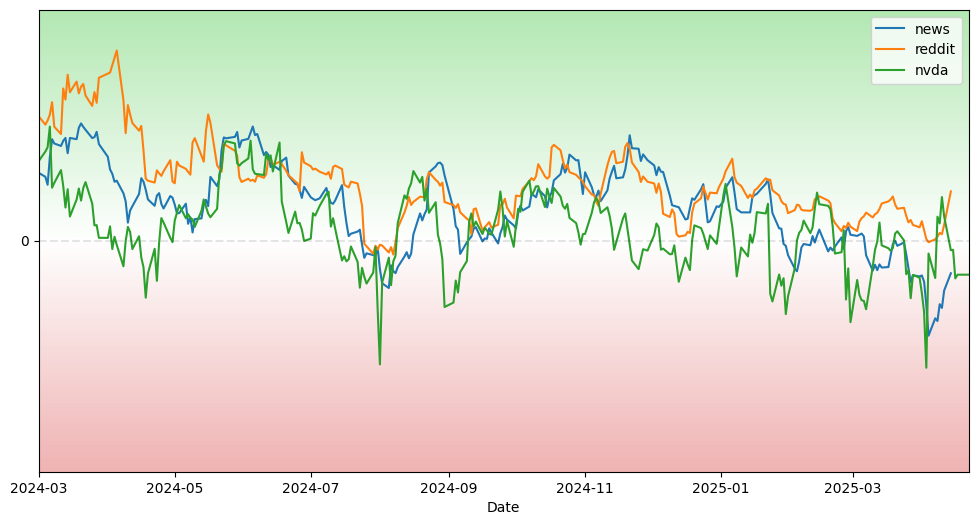

(10594, 1)


<ipython-input-23-6a88061c2cbb>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})
[*********************100%***********************]  1 of 1 completed

(10202, 6)
(967, 6)
(1104, 6)
(8131, 6)
(0, 6)


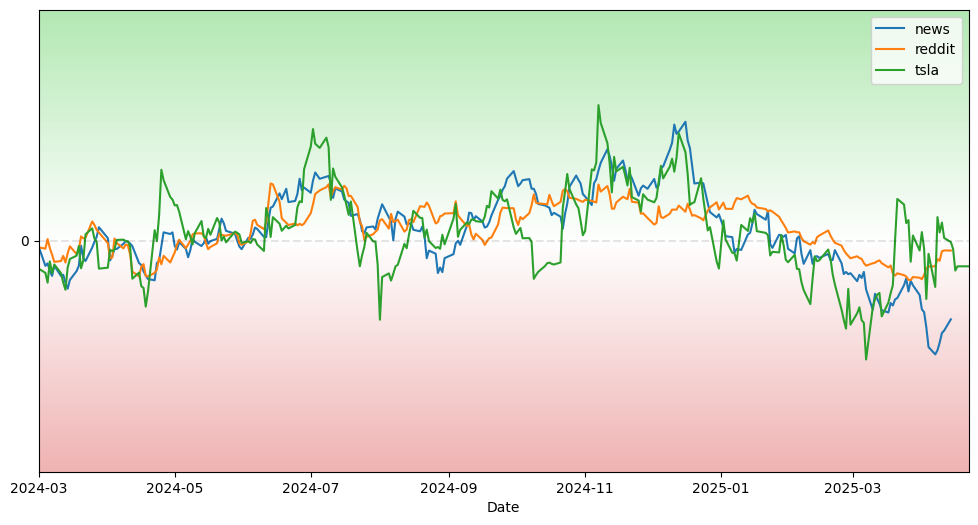

[*********************100%***********************]  1 of 1 completed

(7672, 1)
(5684, 6)
(56, 6)
(1727, 6)
(3901, 6)
(0, 6)


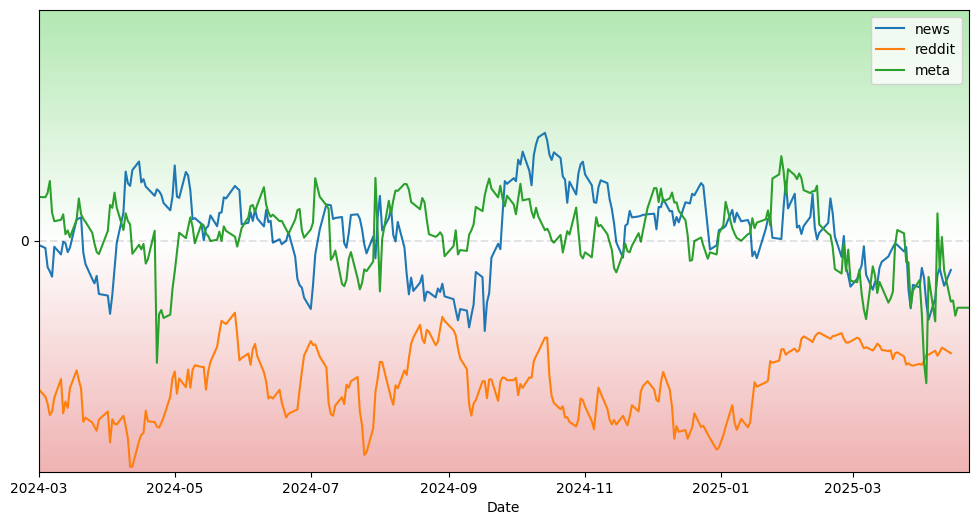

(10390, 1)
(3469, 6)
(474, 6)
(502, 6)
(2493, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed


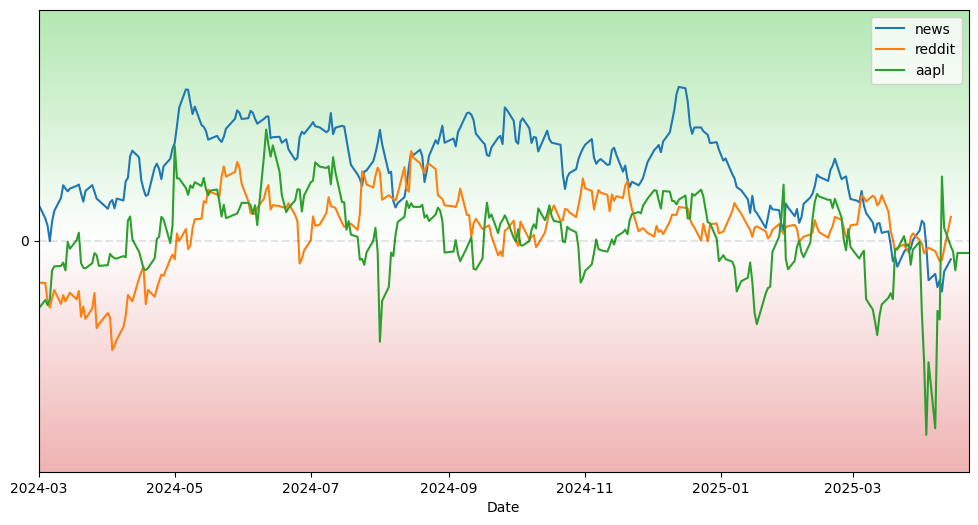

[*********************100%***********************]  1 of 1 completed

(3502, 1)
(4451, 6)
(418, 6)
(238, 6)
(3795, 6)
(0, 6)


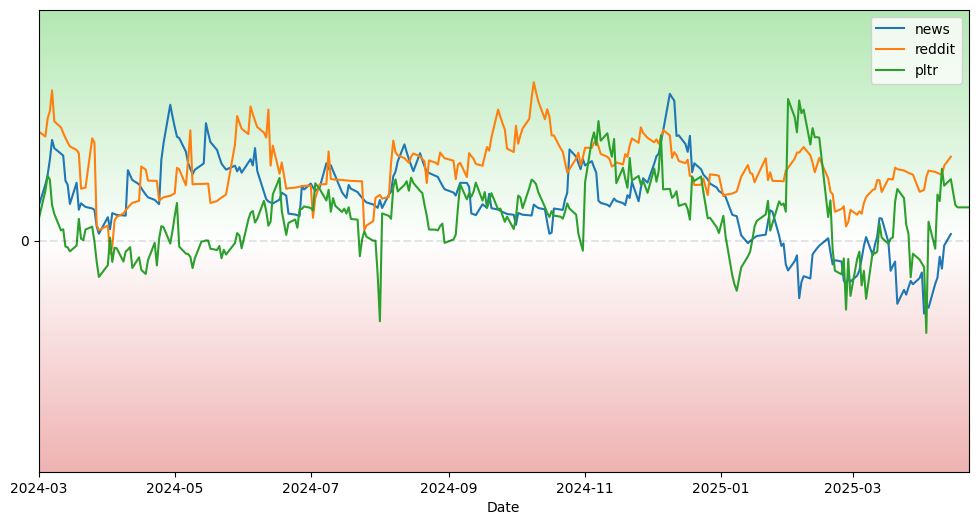

(11306, 1)
(17867, 6)
(637, 6)
(2528, 6)
(14702, 6)
(0, 6)


[*********************100%***********************]  1 of 1 completed


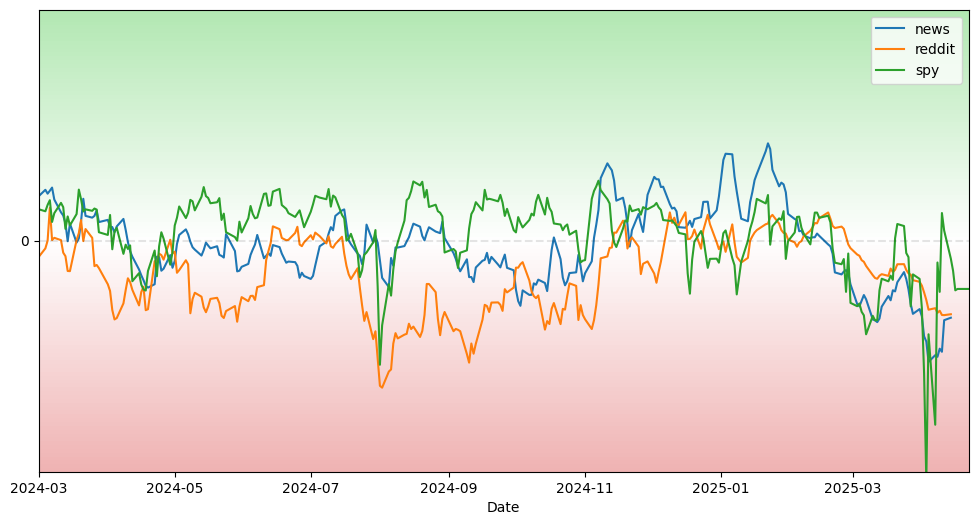

In [ ]:
num_news = 0
num_reddit = 0
cmap = plt.get_cmap("tab10")
for tic in ['NVDA', 'TSLA', 'META', 'AAPL', 'PLTR', 'SPY']:
    windows = 1
    version = 9
    with open(f"/content/drive/MyDrive/eecs6414/data/{tic.lower()}_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)
    num_news += news_df[news_df.index.get_level_values(0) >= pd.to_datetime('2024-03-01')].shape[0]

    _news_df = pd.DataFrame(news_df['answer'])
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    _news_df['sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})
    # score1 = _news_df.groupby('date')['score'].mean()
    score1 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score1['count'] = pd.DataFrame(_news_df.groupby('date')['sentiment'].count())
    score1['rolling_sum'] = score1.rolling(windows)['sentiment'].sum()
    score1['rolling_count'] = score1.rolling(windows)['count'].sum()
    score1['score'] = score1['rolling_sum'] / score1['rolling_count'] + 0.04
    # score1['score'] = score1['rolling_sum']
    score1 = score1[score1.index >= '2023-09-01']
    # score1 = score1[score1.index >= '2024-03-01']
    score1 = pd.DataFrame(score1)


    version = 10
    with open(f"/content/drive/MyDrive/eecs6414/data/reddit_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)


    _news_df = news_df[(news_df.index.get_level_values(1).isin([tic]))]
    num_reddit += _news_df[_news_df.index.get_level_values(0) >= pd.to_datetime('2024-03-01')].shape[0]
    # _news_df = news_df
    _news_df.loc[:,'answer'] = _news_df['answer']
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    print(_news_df[_news_df['answer'] == 'positive'].shape)
    print(_news_df[_news_df['answer'] == 'negative'].shape)
    print(_news_df[_news_df['answer'] == 'neutral'].shape)
    print(_news_df[_news_df['answer'] == 'unknown'].shape)
    _news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})


    score2 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score2['count'] = _news_df.groupby('date')['sentiment'].count()
    score2['rolling_sum'] = score2.rolling(windows)['sentiment'].sum()
    score2['rolling_count'] = score2.rolling(windows)['count'].sum()
    score2['score'] = score2['rolling_sum'] / score2['rolling_count'] + 0.0596
    # score2['score'] = score2['rolling_sum']

    score2 = score2[score2.index >= '2023-09-01']
    score2 = pd.DataFrame(score2)

    # prompt: use yfinance to download the stock price info for nvda starting from 2022-01-01 till now
    import yfinance as yf
    # Download data
    data = yf.download([tic], start="2023-09-01")
    # data = yf.download(["TSLA"], start="2023-09-01")
    # Print the data (optional)
    data.columns = data.columns.get_level_values(0)
    data = data.shift(-1)
    data['movement'] = data['Open'].shift(-1)/data['Open'] - 1
    data['score'] = data['movement'].rolling(windows).mean()
    score3 = pd.DataFrame(data['score'])



    for i in [0.1]:
        graph([score1, score2, score3], i, with_mean=[False, False, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])




In [ ]:
num_news

28947

In [ ]:
num_reddit

37808

[*********************100%***********************]  1 of 1 completed


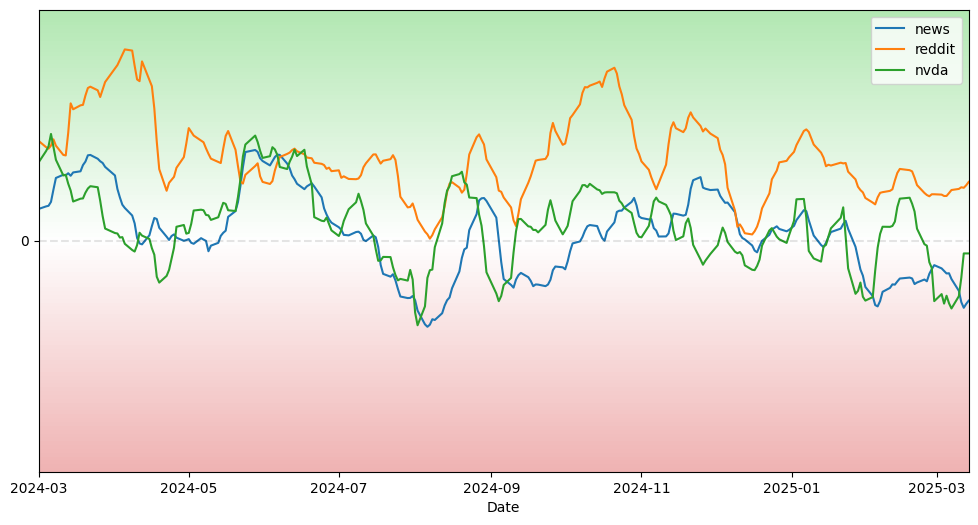

In [12]:
import yfinance as yf
# Download data
data = yf.download(['AAPL'], start="2023-09-01")
# data = yf.download(["TSLA"], start="2023-09-01")
# Print the data (optional)
data.columns = data.columns.get_level_values(0)
data = data.shift(-1)
data['movement'] = data['Open'].shift(-1)/data['Open'] - 1
data['score'] = data['movement'].rolling(windows).mean()

[*********************100%***********************]  1 of 1 completed
ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['AAPL']: YFRateLimitError('Too Many Requests. Rate limited. Try after a while.')


(3887, 1)
(1099, 7)
(222, 7)
(114, 7)
(763, 7)
(0, 7)


[*********************100%***********************]  1 of 1 completed


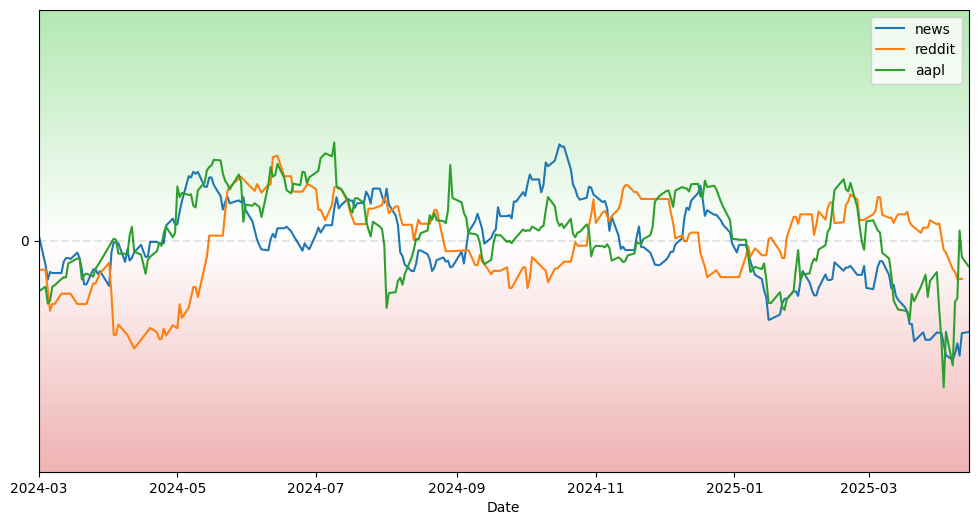

(2136, 1)


[*********************100%***********************]  1 of 1 completed

(233, 7)
(21, 7)
(65, 7)
(147, 7)
(0, 7)


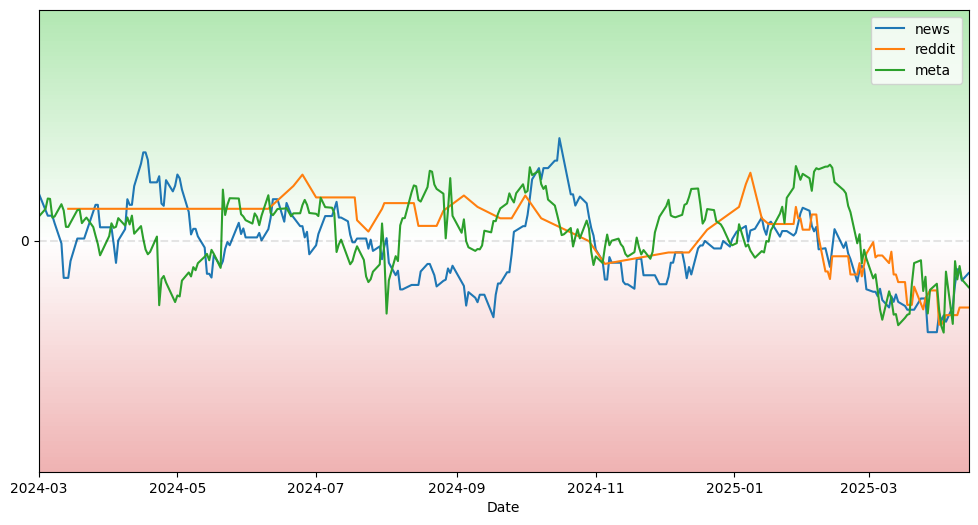

(4624, 1)
(1047, 7)
(210, 7)
(72, 7)
(765, 7)
(0, 7)


[*********************100%***********************]  1 of 1 completed


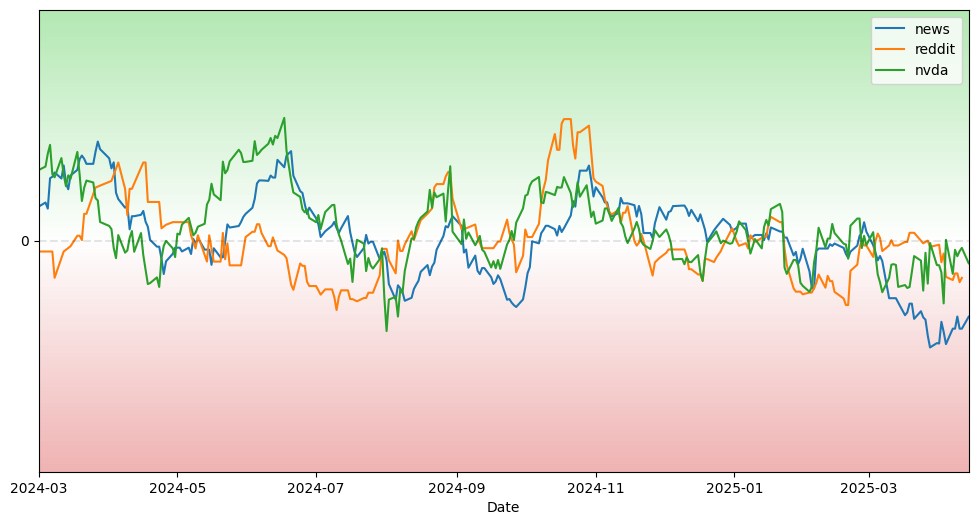

(1643, 1)
(415, 7)
(114, 7)
(22, 7)
(279, 7)
(0, 7)


[*********************100%***********************]  1 of 1 completed


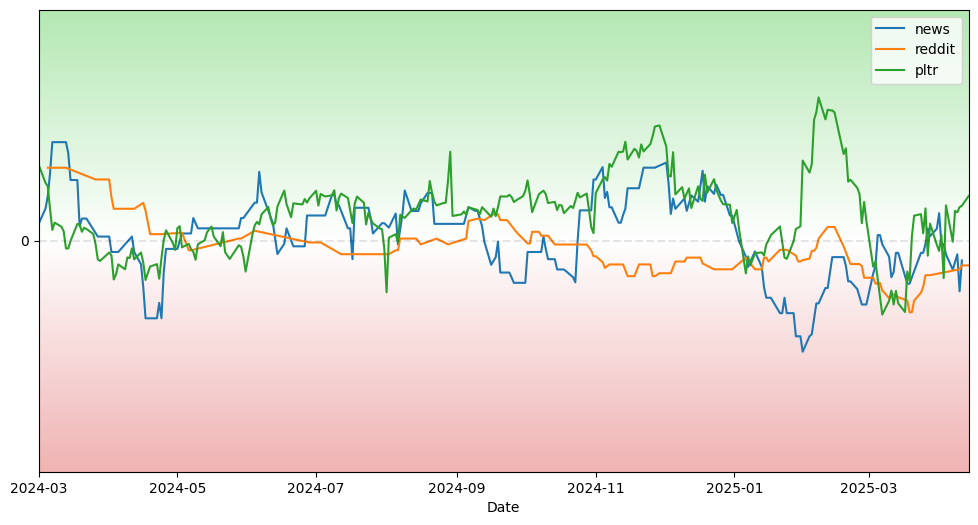

(3045, 1)
(1147, 7)
(344, 7)
(136, 7)
(667, 7)
(0, 7)


[*********************100%***********************]  1 of 1 completed


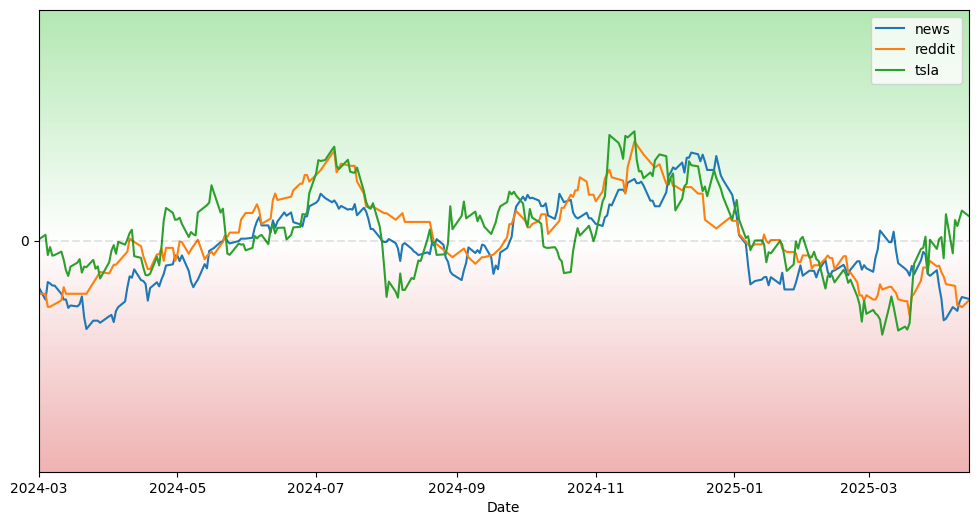

(4210, 1)
(1067, 7)
(106, 7)
(114, 7)
(847, 7)
(0, 7)


[*********************100%***********************]  1 of 1 completed


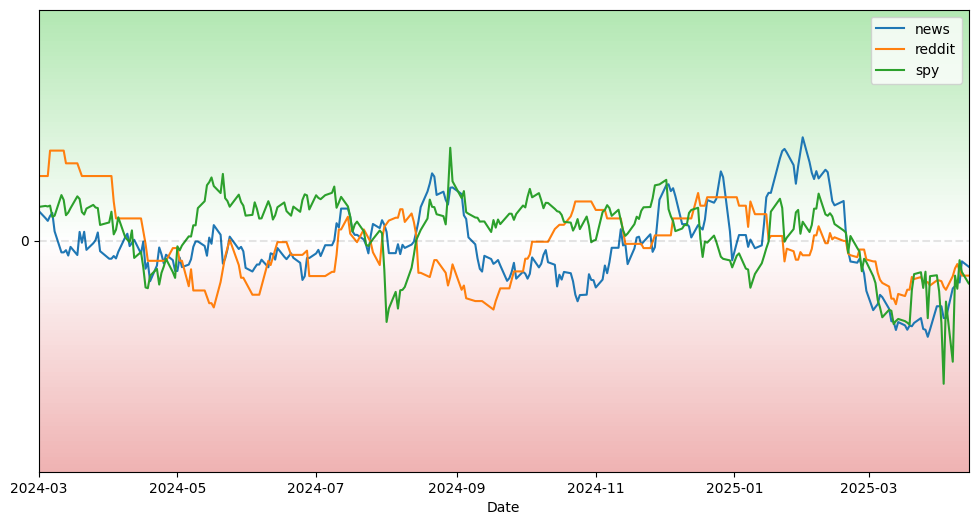

In [22]:
score1_list = []
cmap = plt.get_cmap("tab10")
for tic in ['AAPL', 'META', 'NVDA', 'PLTR', 'TSLA', 'SPY']:
    windows = 1
    version = 9
    cat = 'A'
    with open(f"/content/drive/MyDrive/eecs6414/data/{tic.lower()}_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)

    with open(f"/content/drive/MyDrive/eecs6414/data/{tic.lower()}_cat{version}.pkl", "rb") as f:
        news_cat_df = pickle.load(f)
    news_df['answer2'] = news_cat_df['answer'].to_numpy()
    news_df = news_df[news_df['answer2'] == cat]
    _news_df = pd.DataFrame(news_df['answer'])
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    _news_df['sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})
    # score1 = _news_df.groupby('date')['score'].mean()
    score1 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score1['count'] = pd.DataFrame(_news_df.groupby('date')['sentiment'].count())
    score1['rolling_sum'] = score1.rolling(windows)['sentiment'].sum()
    score1['rolling_count'] = score1.rolling(windows)['count'].sum()
    score1['score'] = score1['rolling_sum'] / score1['rolling_count'] + 0.04
    # score1['score'] = score1['rolling_sum']
    score1 = score1[score1.index >= '2023-09-01']
    score1 = score1[score1.index <= '2025-04-14']
    score1 = pd.DataFrame(score1)
    version = 9

    with open(f"/content/drive/MyDrive/eecs6414/data/reddit_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)
    with open(f"/content/drive/MyDrive/eecs6414/data/reddit_cat{version}.pkl", "rb") as f:
        news_cat_df = pickle.load(f)
    news_df['answer2'] = news_cat_df['answer'].to_numpy()
    news_df = news_df[news_df['answer2'] == cat]

    _news_df = news_df[(news_df.index.get_level_values(1).isin([tic]))]
    # _news_df = news_df
    _news_df.loc[:,'answer'] = _news_df['answer']
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    print(_news_df[_news_df['answer'] == 'positive'].shape)
    print(_news_df[_news_df['answer'] == 'negative'].shape)
    print(_news_df[_news_df['answer'] == 'neutral'].shape)
    print(_news_df[_news_df['answer'] == 'unknown'].shape)
    _news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})

    score2 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score2['count'] = _news_df.groupby('date')['sentiment'].count()
    score2['rolling_sum'] = score2.rolling(windows)['sentiment'].sum()
    score2['rolling_count'] = score2.rolling(windows)['count'].sum()
    score2['score'] = score2['rolling_sum'] / score2['rolling_count'] + 0.0596
    # score2['score'] = score2['rolling_sum']

    score2 = score2[score2.index >= '2023-09-01']
    score2 = score2[score2.index <= '2025-04-14']
    score2 = pd.DataFrame(score2)
    # prompt: use yfinance to download the stock price info for nvda starting from 2022-01-01 till now
    import yfinance as yf
    # Download data
    data = yf.download([tic], start="2023-09-01")
    # data = yf.download(["TSLA"], start="2023-09-01")
    # Print the data (optional)
    data.columns = data.columns.get_level_values(0)
    data = data.shift(-1)
    data['movement'] = data['Open'].shift(-1)/data['Open'] - 1
    data['score'] = data['movement'].rolling(windows).mean()
    score3 = pd.DataFrame(data['score'])
    score3 = score3[score3.index <= '2025-04-14']

    ma_value = 20
    suffix = 'EMA' if ma_value < 1 else 'SMA'
    for i in [ma_value]:
        graph([score1, score2, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])
    # score3 = pd.DataFrame(score3)
    score1['y'] = score3['score']
    score1['rate'] = score3['score']
    score1['y'] = score1['y'].interpolate(method='linear', limit_direction='forward')
    score1['rate'] = score1['rate'].interpolate(method='linear', limit_direction='forward')

    mean = score1['rate'].mean()
    std = score1['rate'].std()
    score1['rate_scaled'] = (score1['rate'] - mean) / (std + 1e-8)

    score1['y_scaled'] = (score1['y'] - mean) / (std + 1e-8)

    score1 = score1[score1.index >= pd.to_datetime('2023-01-01')]
    score1['rate_rolling_5'] = score1['rate'].rolling(5).mean()
    mean = score1['rate_rolling_5'].mean()
    std = score1['rate_rolling_5'].std()
    score1['rate_rolling_5_scaled'] = (score1['rate_rolling_5'] - mean) / (std + 1e-8)
    score1['rate_rolling_3'] = score1['rate'].rolling(3).mean()
    mean = score1['rate_rolling_3'].mean()
    std = score1['rate_rolling_3'].std()
    score1['rate_rolling_3_scaled'] = (score1['rate_rolling_3'] - mean) / (std + 1e-8)
    mean = score1['score'].mean()
    std = score1['score'].std()
    score1['score_scaled'] = (score1['score'] - mean) / (std + 1e-8)
    score1['score2'] = score2['score']
    mean = score1['score2'].mean()
    std = score1['score2'].std()
    score1['score2_scaled'] = (score1['score2'] - mean) / (std + 1e-8)
    score1['score2_scaled'] = score1['score2_scaled'].fillna(0)
    # score1['score3'] = score1['EMA0.05']
    score1['score3'] = score3[f'{suffix}{ma_value}']
    mean = score1['score3'].mean()
    std = score1['score3'].std()
    score1['score3_scaled'] = (score1['score3'] - mean) / (std + 1e-8)
    score1['score3_scaled'] = score1['score3_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score3_scaled'] = score1['score3_scaled'].interpolate(method='linear', limit_direction='backward')

    # score1['score4'] = score2['EMA0.05']
    score1['score4'] = score1[f'{suffix}{ma_value}']
    mean = score1['score4'].mean()
    std = score1['score4'].std()
    score1['score4_scaled'] = (score1['score4'] - mean) / (std + 1e-8)
    score1['score4_scaled'] = score1['score4_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score4_scaled'] = score1['score4_scaled'].interpolate(method='linear', limit_direction='backward')


    # score1['score5'] = score3['EMA0.05']
    score1['score5'] = score2[f'{suffix}{ma_value}']
    mean = score1['score5'].mean()
    std = score1['score5'].std()
    score1['score5_scaled'] = (score1['score5'] - mean) / (std + 1e-8)
    score1['score5_scaled'] = score1['score5_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score5_scaled'] = score1['score5_scaled'].interpolate(method='linear', limit_direction='backward')
    score1['tic'] = tic
    score1.fillna(0, inplace=True)

    score1_list.append(score1)

(10391, 4)
(10390, 1)
(2638, 7)
(386, 7)
(395, 7)
(1857, 7)
(0, 7)


<ipython-input-125-717c5093e5b0>:28: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed


(9609, 1034)


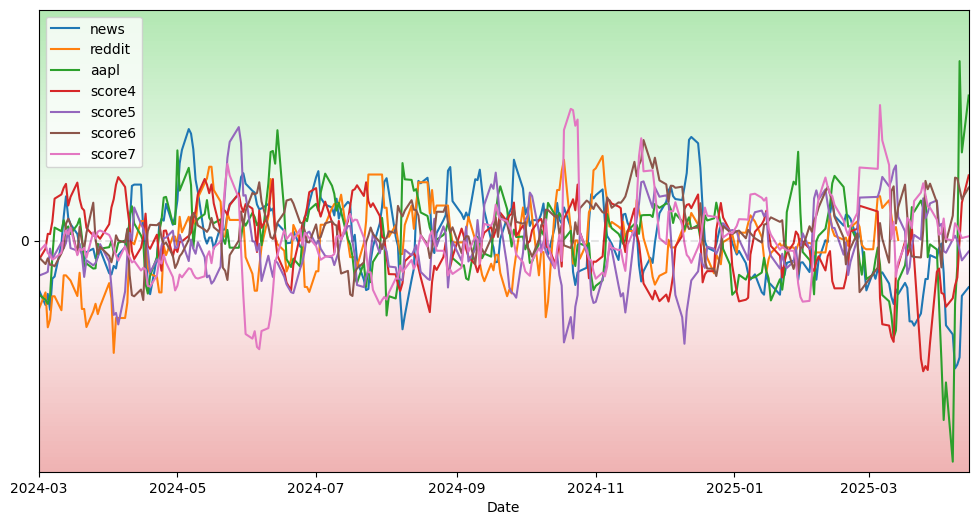

(7673, 4)
(7672, 1)
(4203, 7)
(51, 7)
(1288, 7)
(2864, 7)
(0, 7)


<ipython-input-125-717c5093e5b0>:28: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed


(3477, 1034)


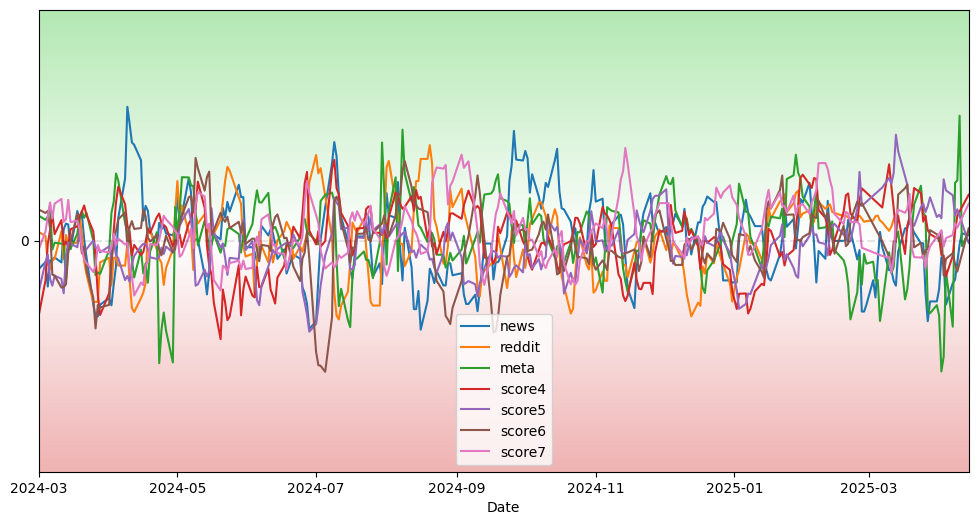

(10439, 4)
(10439, 1)
(3199, 7)
(442, 7)
(322, 7)
(2435, 7)
(0, 7)


<ipython-input-125-717c5093e5b0>:28: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed


(2900, 1034)


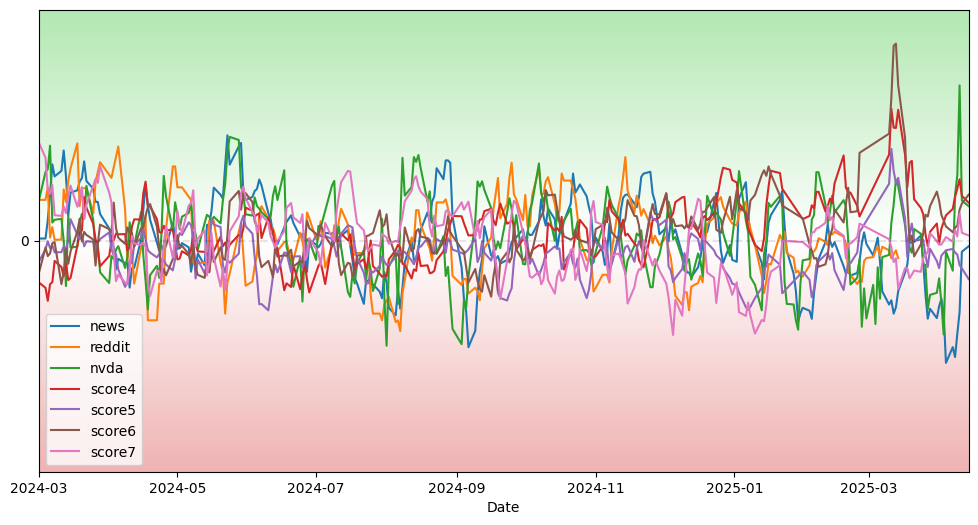

<ipython-input-125-717c5093e5b0>:28: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
<ipython-input-125-717c5093e5b0>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  _news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 

(3502, 4)
(3502, 1)
(2567, 7)
(334, 7)
(140, 7)
(2093, 7)
(0, 7)


(661, 1034)


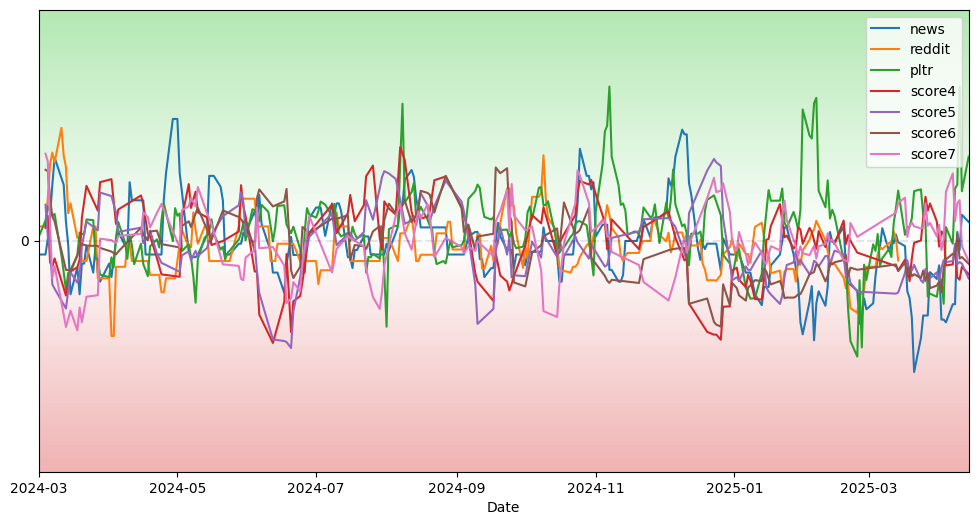

<ipython-input-125-717c5093e5b0>:28: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed

(10594, 4)
(10594, 1)
(4197, 7)
(662, 7)
(588, 7)
(2947, 7)
(0, 7)


(6419, 1034)


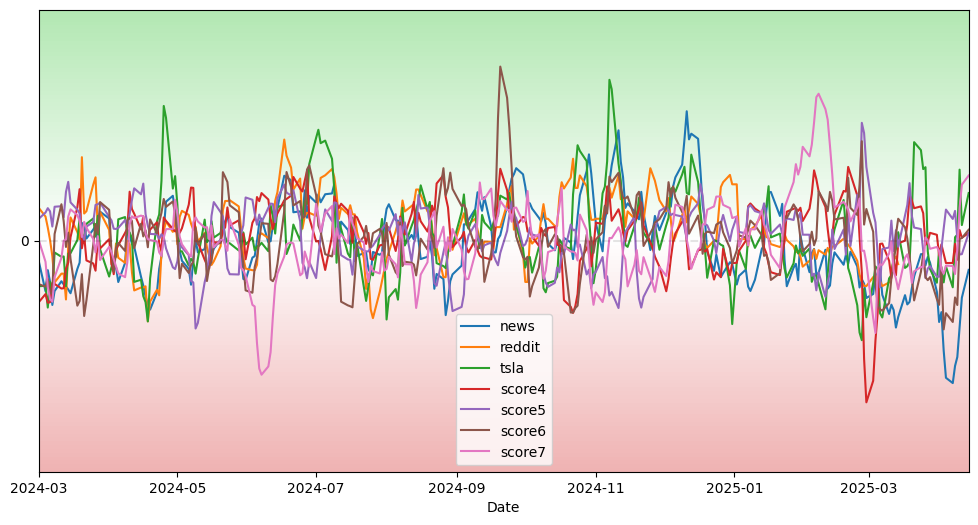

(11321, 4)
(11306, 1)
(4275, 7)
(195, 7)
(682, 7)
(3398, 7)
(0, 7)


<ipython-input-125-717c5093e5b0>:28: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed


(4169, 1034)


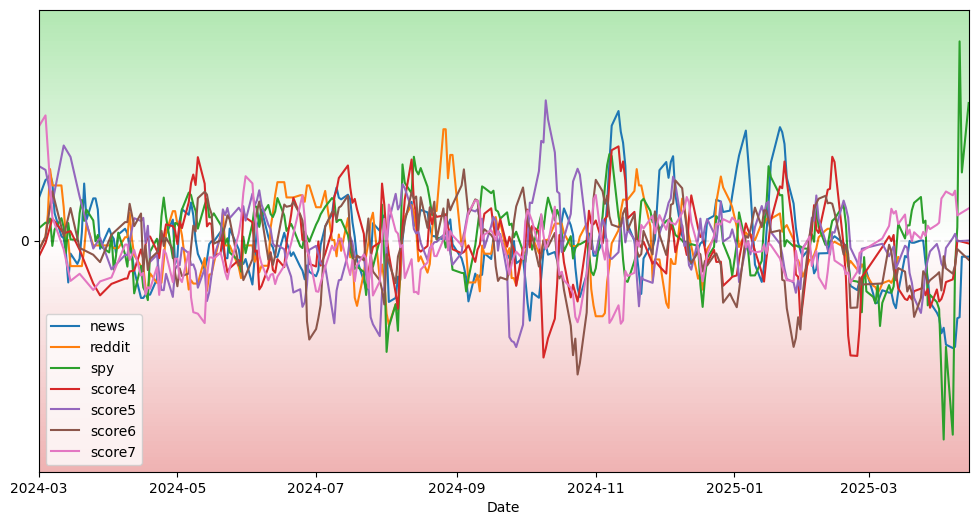

In [ ]:
score1_list = []
# cat = 'opinion'
for tic in ['AAPL', 'META', 'NVDA', 'PLTR', 'TSLA', 'SPY']:
    windows = 1
    version = 9
    with open(f"/content/drive/MyDrive/eecs6414/data/{tic.lower()}_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)
    # news_df = news_df[news_df['category'].str.contains(cat)]
    print(news_df.shape)
    _news_df = pd.DataFrame(news_df['answer'])
    _news_df = _news_df[_news_df['answer'] != 'unknown']

    print(_news_df.shape)
    _news_df['sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})
    # score1 = _news_df.groupby('date')['score'].mean()
    score1 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score1['count'] = pd.DataFrame(_news_df.groupby('date')['sentiment'].count())
    score1['rolling_sum'] = score1.rolling(windows)['sentiment'].sum()
    score1['rolling_count'] = score1.rolling(windows)['count'].sum()
    score1['score'] = score1['rolling_sum'] / score1['rolling_count'] + 0.04
    # score1['score'] = score1['rolling_sum']
    score1 = score1[score1.index >= '2023-09-01']
    score1 = score1[score1.index <= '2025-04-14']
    score1 = pd.DataFrame(score1)
    version = 10

    with open(f"/content/drive/MyDrive/eecs6414/data/category/reddit_{tic.lower()}_with_category.pkl", "rb") as f:
        news_df = pickle.load(f)

    # news_df = news_df[news_df['category'].str.lower().str.contains(cat)]
    # _news_df = news_df[(news_df.index.get_level_values(1).isin([tic]))]
    # if cat == 'opinion':
    #     news_df = news_df[~((news_df['category'].str.contains('data')) | (news_df['category'].str.contains('fiscal')))]
    #     # print("Opinion", news_df.shape)
    # else:
    #     news_df = news_df[news_df['category'].str.contains(cat)]
    # # news_df = news_df[news_df['category'].str.contains(cat)]
    # print(cat, news_df.shape)
    _news_df = news_df
    _news_df.loc[:,'answer'] = _news_df['answer']
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    # _news_df = _news_df[_news_df['category'].str.lower().str.contains(cat)]
    print(_news_df.shape)
    print(_news_df[_news_df['answer'] == 'positive'].shape)
    print(_news_df[_news_df['answer'] == 'negative'].shape)
    print(_news_df[_news_df['answer'] == 'neutral'].shape)
    print(_news_df[_news_df['answer'] == 'unknown'].shape)
    _news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})

    score2 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score2['count'] = _news_df.groupby('date')['sentiment'].count()
    score2['rolling_sum'] = score2.rolling(windows)['sentiment'].sum()
    score2['rolling_count'] = score2.rolling(windows)['count'].sum()
    score2['score'] = score2['rolling_sum'] / score2['rolling_count'] + 0.0596
    # score2['score'] = score2['rolling_sum']

    score2 = score2[score2.index >= '2023-09-01']
    score2 = score2[score2.index <= '2025-04-14']
    score2 = pd.DataFrame(score2)
    # prompt: use yfinance to download the stock price info for nvda starting from 2022-01-01 till now
    import yfinance as yf
    # Download data
    data = yf.download([tic], start="2023-09-01")
    # data = yf.download(["TSLA"], start="2023-09-01")
    # Print the data (optional)
    data.columns = data.columns.get_level_values(0)
    data = data.shift(-1)
    data['movement'] = data['Open'].shift(-1)/data['Open'] - 1
    data['score'] = data['movement'].rolling(windows).mean()
    score3 = pd.DataFrame(data['score'])
    score3 = score3[score3.index <= '2025-04-14']

    with open(f"/content/drive/MyDrive/eecs6414/data/sentiment_score_ds_20250426.pkl", "rb") as f:
        news_df = pickle.load(f)

    news_df = news_df[news_df.index.get_level_values(1) == tic]
    _news_df = news_df.reset_index()
    print(_news_df.shape)
    # score1 = _news_df.groupby('date')['score'].mean()
    score4 = pd.DataFrame(_news_df.groupby('date')['score0'].sum())
    score4['count'] = pd.DataFrame(_news_df.groupby('date')['score0'].count())
    score4['rolling_sum'] = score4.rolling(windows)['score0'].sum()
    score4['rolling_count'] = score4.rolling(windows)['count'].sum()
    score4['score'] = score4['rolling_sum'] / score4['rolling_count']

    score4 = score4[score4.index >= '2023-09-01']
    score4 = score4[score4.index <= '2025-04-14']
    score4 = pd.DataFrame(score4)

    score5 = pd.DataFrame(_news_df.groupby('date')['score1'].sum())
    score5['count'] = pd.DataFrame(_news_df.groupby('date')['score1'].count())
    score5['rolling_sum'] = score5.rolling(windows)['score1'].sum()
    score5['rolling_count'] = score5.rolling(windows)['count'].sum()
    score5['score'] = score5['rolling_sum'] / score5['rolling_count']

    score5 = score5[score5.index >= '2023-09-01']
    score5 = score5[score5.index <= '2025-04-14']
    score5 = pd.DataFrame(score5)

    score6 = pd.DataFrame(_news_df.groupby('date')['score2'].sum())
    score6['count'] = pd.DataFrame(_news_df.groupby('date')['score2'].count())
    score6['rolling_sum'] = score6.rolling(windows)['score2'].sum()
    score6['rolling_count'] = score6.rolling(windows)['count'].sum()
    score6['score'] = score6['rolling_sum'] / score6['rolling_count']

    score6 = score6[score6.index >= '2023-09-01']
    score6 = score6[score6.index <= '2025-04-14']
    score6 = pd.DataFrame(score6)

    score7 = pd.DataFrame(_news_df.groupby('date')['score3'].sum())
    score7['count'] = pd.DataFrame(_news_df.groupby('date')['score3'].count())
    score7['rolling_sum'] = score7.rolling(windows)['score3'].sum()
    score7['rolling_count'] = score7.rolling(windows)['count'].sum()
    score7['score'] = score7['rolling_sum'] / score7['rolling_count']

    score7 = score7[score7.index >= '2023-09-01']
    score7 = score7[score7.index <= '2025-04-14']
    score7 = pd.DataFrame(score7)


    ma_value = 5
    suffix = 'EMA' if ma_value < 1 else 'SMA'
    # for i in [ma_value]:
    #     graph([score1, score2, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])
    for i in [ma_value]:
        graph([score1, score2, score3, score4, score5, score6, score7], i, with_mean=[True, True, False, True, True, True, True], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2), cmap(3), cmap(4), cmap(5), cmap(6)], label=['news', 'reddit', tic.lower(), 'score4', 'score5', 'score6', 'score7'])

    # score3 = pd.DataFrame(score3)
    score1['y'] = score3['score']
    score1['rate'] = score3['score']
    score1['y'] = score1['y'].interpolate(method='linear', limit_direction='forward')
    score1['rate'] = score1['rate'].interpolate(method='linear', limit_direction='forward')

    mean = score1['rate'].mean()
    std = score1['rate'].std()
    score1['rate_scaled'] = (score1['rate'] - mean) / std

    score1['y_scaled'] = (score1['y'] - mean) / std

    score1 = score1[score1.index >= pd.to_datetime('2023-01-01')]
    score1['rate_rolling_5'] = score1['rate'].rolling(5).mean()
    mean = score1['rate_rolling_5'].mean()
    std = score1['rate_rolling_5'].std()
    score1['rate_rolling_5_scaled'] = (score1['rate_rolling_5'] - mean) / std
    score1['rate_rolling_3'] = score1['rate'].rolling(3).mean()
    mean = score1['rate_rolling_3'].mean()
    std = score1['rate_rolling_3'].std()
    score1['rate_rolling_3_scaled'] = (score1['rate_rolling_3'] - mean) / std
    mean = score1['score'].mean()
    std = score1['score'].std()
    score1['score_scaled'] = (score1['score'] - mean) / std
    score1['score2'] = score2['score']
    mean = score1['score2'].mean()
    std = score1['score2'].std()
    score1['score2_scaled'] = (score1['score2'] - mean) / std
    score1['score2_scaled'] = score1['score2_scaled'].fillna(0)
    # score1['score3'] = score1['EMA0.05']

    score1['score3'] = score3[f'{suffix}{ma_value}']
    mean = score1['score3'].mean()
    std = score1['score3'].std()
    score1['score3_scaled'] = (score1['score3'] - mean) / std
    score1['score3_scaled'] = score1['score3_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score3_scaled'] = score1['score3_scaled'].interpolate(method='linear', limit_direction='backward')

    # score1['score4'] = score2['EMA0.05']
    score1['score4'] = score1[f'{suffix}{ma_value}']
    mean = score1['score4'].mean()
    std = score1['score4'].std()
    score1['score4_scaled'] = (score1['score4'] - mean) / std
    score1['score4_scaled'] = score1['score4_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score4_scaled'] = score1['score4_scaled'].interpolate(method='linear', limit_direction='backward')


    # score1['score5'] = score3['EMA0.05']
    score1['score5'] = score2[f'{suffix}{ma_value}']
    mean = score1['score5'].mean()
    std = score1['score5'].std()
    score1['score5_scaled'] = (score1['score5'] - mean) / std
    score1['score5_scaled'] = score1['score5_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score5_scaled'] = score1['score5_scaled'].interpolate(method='linear', limit_direction='backward')

    score1['score6'] = score4[f'{suffix}{ma_value}']
    mean = score1['score6'].mean()
    std = score1['score6'].std()
    score1['score6_scaled'] = (score1['score6'] - mean) / std
    score1['score6_scaled'] = score1['score6_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score6_scaled'] = score1['score6_scaled'].interpolate(method='linear', limit_direction='backward')

    score1['score7'] = score5[f'{suffix}{ma_value}']
    mean = score1['score7'].mean()
    std = score1['score7'].std()
    score1['score7_scaled'] = (score1['score7'] - mean) / std
    score1['score7_scaled'] = score1['score7_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score7_scaled'] = score1['score7_scaled'].interpolate(method='linear', limit_direction='backward')

    score1['score8'] = score6[f'{suffix}{ma_value}']
    mean = score1['score8'].mean()
    std = score1['score8'].std()
    score1['score8_scaled'] = (score1['score8'] - mean) / std
    score1['score8_scaled'] = score1['score8_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score8_scaled'] = score1['score8_scaled'].interpolate(method='linear', limit_direction='backward')

    score1['score9'] = score7[f'{suffix}{ma_value}']
    mean = score1['score9'].mean()
    std = score1['score9'].std()
    score1['score9_scaled'] = (score1['score9'] - mean) / std
    score1['score9_scaled'] = score1['score9_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score9_scaled'] = score1['score9_scaled'].interpolate(method='linear', limit_direction='backward')



    score1['tic'] = tic
    score1.fillna(0, inplace=True)

    score1_list.append(score1)

In [ ]:
with open(f"/content/drive/MyDrive/eecs6414/data/sentiment_score_ds_20250426.pkl", "rb") as f:
    news_df = pickle.load(f)

news_df = news_df[news_df.index.get_level_values(1) == tic]
_news_df = news_df.reset_index()
print(_news_df.shape)
# score1 = _news_df.groupby('date')['score'].mean()
score4 = pd.DataFrame(_news_df.groupby('date')['score0'].sum())
score4['count'] = pd.DataFrame(_news_df.groupby('date')['score0'].count())
score4['rolling_sum'] = score4.rolling(windows)['score0'].sum()
score4['rolling_count'] = score4.rolling(windows)['count'].sum()
score4['score'] = score4['rolling_sum'] / score4['rolling_count']

score4 = score4[score4.index >= '2023-09-01']
score4 = score4[score4.index <= '2025-04-14']
score4 = pd.DataFrame(score4)

score5 = pd.DataFrame(_news_df.groupby('date')['score1'].sum())
score5['count'] = pd.DataFrame(_news_df.groupby('date')['score1'].count())
score5['rolling_sum'] = score5.rolling(windows)['score1'].sum()
score5['rolling_count'] = score5.rolling(windows)['count'].sum()
score5['score'] = score5['rolling_sum'] / score5['rolling_count']

score5 = score5[score5.index >= '2023-09-01']
score5 = score5[score5.index <= '2025-04-14']
score5 = pd.DataFrame(score5)

score6 = pd.DataFrame(_news_df.groupby('date')['score2'].sum())
score6['count'] = pd.DataFrame(_news_df.groupby('date')['score2'].count())
score6['rolling_sum'] = score6.rolling(windows)['score2'].sum()
score6['rolling_count'] = score6.rolling(windows)['count'].sum()
score6['score'] = score6['rolling_sum'] / score6['rolling_count']

score6 = score6[score6.index >= '2023-09-01']
score6 = score6[score6.index <= '2025-04-14']
score6 = pd.DataFrame(score6)

score7 = pd.DataFrame(_news_df.groupby('date')['score3'].sum())
score7['count'] = pd.DataFrame(_news_df.groupby('date')['score3'].count())
score7['rolling_sum'] = score7.rolling(windows)['score3'].sum()
score7['rolling_count'] = score7.rolling(windows)['count'].sum()
score7['score'] = score7['rolling_sum'] / score7['rolling_count']

score7 = score7[score7.index >= '2023-09-01']
score7 = score7[score7.index <= '2025-04-14']
score7 = pd.DataFrame(score7)



(9609, 1034)


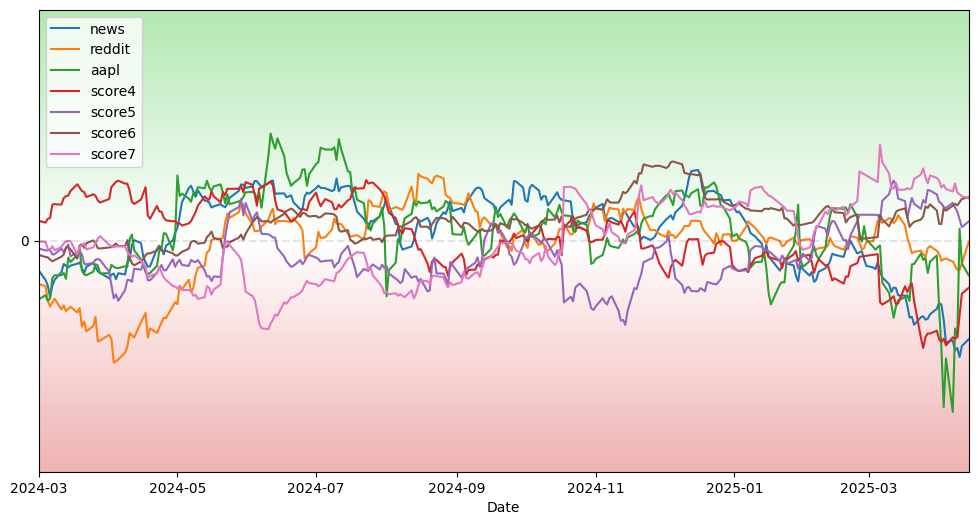

In [ ]:
ma_value = 0.05
for i in [ma_value]:
    graph([score1, score2, score3, score4, score5, score6, score7], i, with_mean=[True, True, False, True, True, True, True], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2), cmap(3), cmap(4), cmap(5), cmap(6)], label=['news', 'reddit', tic.lower(), 'score4', 'score5', 'score6', 'score7'])

<ipython-input-16-3faadfcfb1fa>:7: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)


opinion (902, 5)
(902, 1)


<ipython-input-16-3faadfcfb1fa>:32: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed


opinion (286, 7)
(286, 7)
(31, 7)
(56, 7)
(199, 7)
(0, 7)
(9609, 1034)


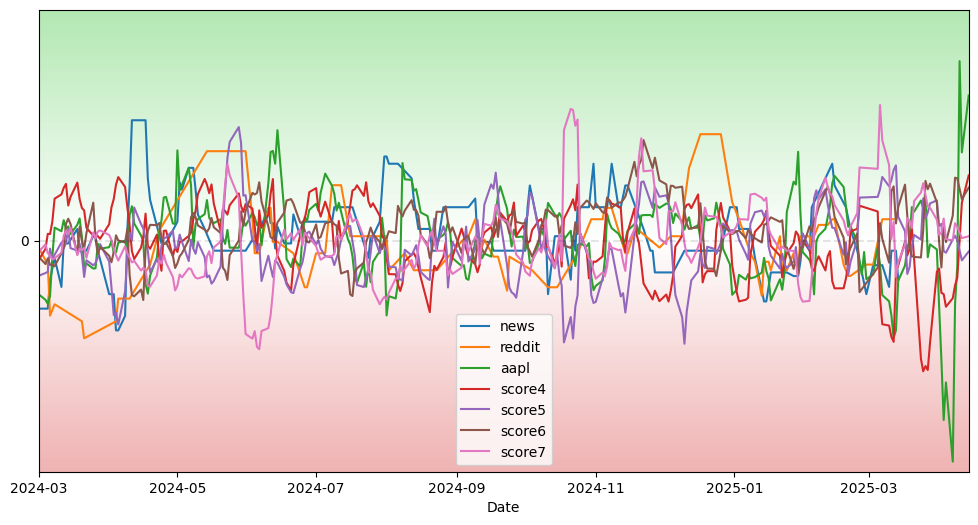

<ipython-input-16-3faadfcfb1fa>:7: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)


opinion (732, 5)
(732, 1)


<ipython-input-16-3faadfcfb1fa>:32: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed


opinion (770, 7)
(770, 7)
(3, 7)
(258, 7)
(509, 7)
(0, 7)
(3477, 1034)


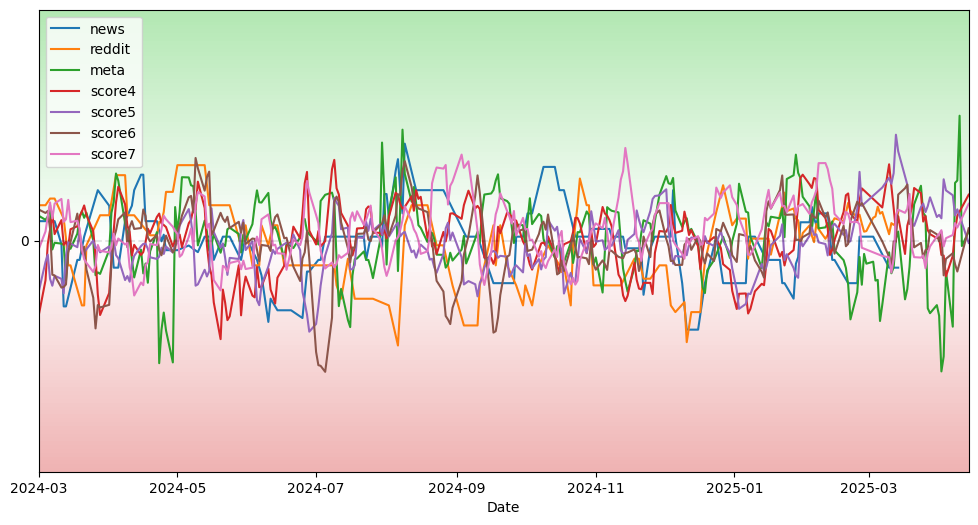

<ipython-input-16-3faadfcfb1fa>:7: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)


opinion (1083, 5)
(1083, 1)


<ipython-input-16-3faadfcfb1fa>:32: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed


opinion (365, 7)
(365, 7)
(39, 7)
(36, 7)
(290, 7)
(0, 7)
(2900, 1034)


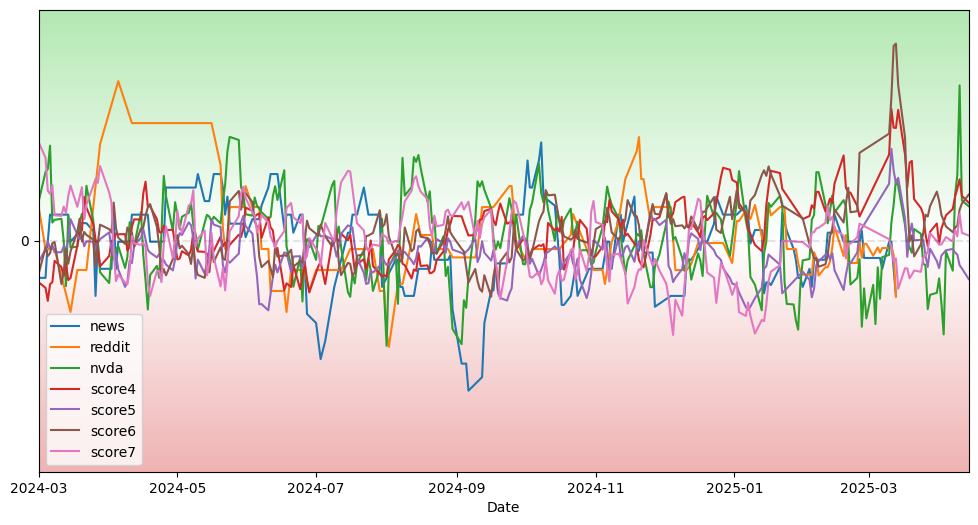

<ipython-input-16-3faadfcfb1fa>:7: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)


opinion (468, 5)
(468, 1)


<ipython-input-16-3faadfcfb1fa>:32: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed


opinion (417, 7)
(417, 7)
(41, 7)
(15, 7)
(361, 7)
(0, 7)
(661, 1034)


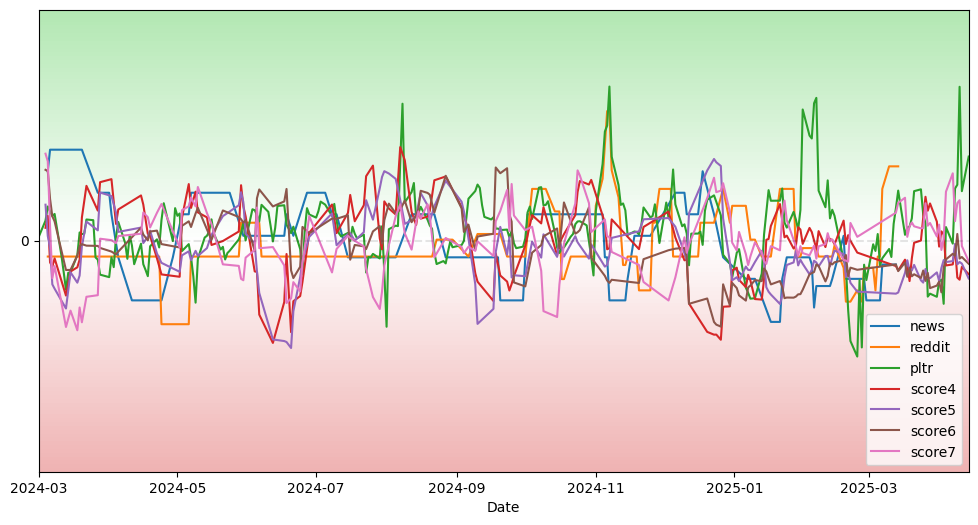

<ipython-input-16-3faadfcfb1fa>:7: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)


opinion (867, 5)
(867, 1)


<ipython-input-16-3faadfcfb1fa>:32: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)
[*********************100%***********************]  1 of 1 completed


opinion (552, 7)
(552, 7)
(66, 7)
(68, 7)
(418, 7)
(0, 7)
(6419, 1034)


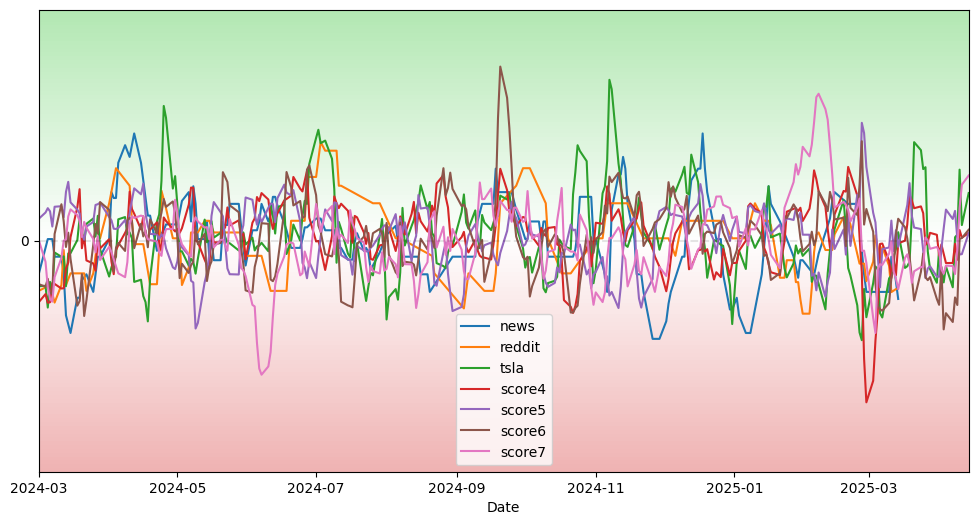

<ipython-input-16-3faadfcfb1fa>:7: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)


opinion (1445, 5)
(1445, 1)


<ipython-input-16-3faadfcfb1fa>:32: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  news_df = pickle.load(f)


opinion (587, 7)
(587, 7)
(15, 7)
(81, 7)
(491, 7)
(0, 7)


[*********************100%***********************]  1 of 1 completed


(4169, 1034)


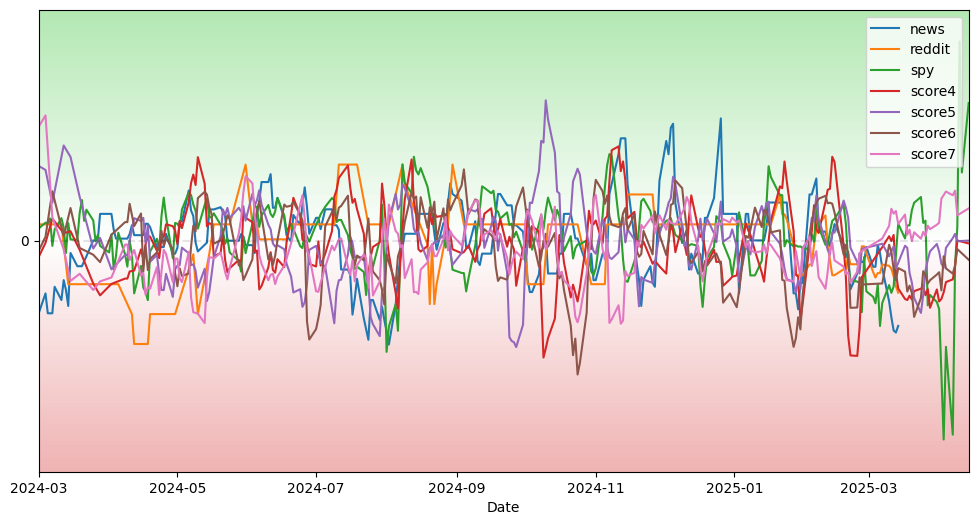

In [ ]:
score1_list = []
cat = 'opinion'
for tic in ['AAPL', 'META', 'NVDA', 'PLTR', 'TSLA', 'SPY']:
    windows = 1
    version = 9
    with open(f"/content/drive/MyDrive/eecs6414/data/category/{tic.lower()}_with_category.pkl", "rb") as f:
        news_df = pickle.load(f)
    if cat == 'opinion':
        news_df = news_df[~((news_df['category'].str.contains('data')) | (news_df['category'].str.contains('fiscal')))]
        # print("Opinion", news_df.shape)
    else:
        news_df = news_df[news_df['category'].str.contains(cat)]
    # news_df = news_df[news_df['category'].str.contains(cat)]
    print(cat, news_df.shape)
    _news_df = pd.DataFrame(news_df['answer'])
    _news_df = _news_df[_news_df['answer'] != 'unknown']

    print(_news_df.shape)
    _news_df['sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})
    # score1 = _news_df.groupby('date')['score'].mean()
    score1 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score1['count'] = pd.DataFrame(_news_df.groupby('date')['sentiment'].count())
    score1['rolling_sum'] = score1.rolling(windows)['sentiment'].sum()
    score1['rolling_count'] = score1.rolling(windows)['count'].sum()
    score1['score'] = score1['rolling_sum'] / score1['rolling_count'] + 0.04
    # score1['score'] = score1['rolling_sum']
    score1 = score1[score1.index >= '2023-09-01']
    score1 = pd.DataFrame(score1)
    version = 10

    with open(f"/content/drive/MyDrive/eecs6414/data/category/reddit_{tic.lower()}_with_category.pkl", "rb") as f:
        news_df = pickle.load(f)

    # news_df = news_df[news_df['category'].str.lower().str.contains(cat)]
    # _news_df = news_df[(news_df.index.get_level_values(1).isin([tic]))]
    if cat == 'opinion':
        news_df = news_df[~((news_df['category'].str.contains('data')) | (news_df['category'].str.contains('fiscal')))]
        # print("Opinion", news_df.shape)
    else:
        news_df = news_df[news_df['category'].str.contains(cat)]
    # news_df = news_df[news_df['category'].str.contains(cat)]
    print(cat, news_df.shape)
    _news_df = news_df
    _news_df.loc[:,'answer'] = _news_df['answer']
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    # _news_df = _news_df[_news_df['category'].str.lower().str.contains(cat)]
    print(_news_df.shape)
    print(_news_df[_news_df['answer'] == 'positive'].shape)
    print(_news_df[_news_df['answer'] == 'negative'].shape)
    print(_news_df[_news_df['answer'] == 'neutral'].shape)
    print(_news_df[_news_df['answer'] == 'unknown'].shape)
    _news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})

    score2 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score2['count'] = _news_df.groupby('date')['sentiment'].count()
    score2['rolling_sum'] = score2.rolling(windows)['sentiment'].sum()
    score2['rolling_count'] = score2.rolling(windows)['count'].sum()
    score2['score'] = score2['rolling_sum'] / score2['rolling_count'] + 0.0596
    # score2['score'] = score2['rolling_sum']

    score2 = score2[score2.index >= '2023-09-01']
    score2 = pd.DataFrame(score2)
    # prompt: use yfinance to download the stock price info for nvda starting from 2022-01-01 till now
    import yfinance as yf
    # Download data
    data = yf.download([tic], start="2023-09-01")
    # data = yf.download(["TSLA"], start="2023-09-01")
    # Print the data (optional)
    data.columns = data.columns.get_level_values(0)
    data = data.shift(-1)
    data['movement'] = data['Open'].shift(-1)/data['Open'] - 1
    data['score'] = data['movement'].rolling(windows).mean()
    score3 = pd.DataFrame(data['score'])
    score3 = score3[score3.index <= '2025-04-14']

    with open(f"/content/drive/MyDrive/eecs6414/data/sentiment_score_ds_20250426.pkl", "rb") as f:
        news_df = pickle.load(f)

    news_df = news_df[news_df.index.get_level_values(1) == tic]
    _news_df = news_df.reset_index()
    print(_news_df.shape)
    # score1 = _news_df.groupby('date')['score'].mean()
    score4 = pd.DataFrame(_news_df.groupby('date')['score0'].sum())
    score4['count'] = pd.DataFrame(_news_df.groupby('date')['score0'].count())
    score4['rolling_sum'] = score4.rolling(windows)['score0'].sum()
    score4['rolling_count'] = score4.rolling(windows)['count'].sum()
    score4['score'] = score4['rolling_sum'] / score4['rolling_count']

    score4 = score4[score4.index >= '2023-09-01']
    score4 = score4[score4.index <= '2025-04-14']
    score4 = pd.DataFrame(score4)

    score5 = pd.DataFrame(_news_df.groupby('date')['score1'].sum())
    score5['count'] = pd.DataFrame(_news_df.groupby('date')['score1'].count())
    score5['rolling_sum'] = score5.rolling(windows)['score1'].sum()
    score5['rolling_count'] = score5.rolling(windows)['count'].sum()
    score5['score'] = score5['rolling_sum'] / score5['rolling_count']

    score5 = score5[score5.index >= '2023-09-01']
    score5 = score5[score5.index <= '2025-04-14']
    score5 = pd.DataFrame(score5)

    score6 = pd.DataFrame(_news_df.groupby('date')['score2'].sum())
    score6['count'] = pd.DataFrame(_news_df.groupby('date')['score2'].count())
    score6['rolling_sum'] = score6.rolling(windows)['score2'].sum()
    score6['rolling_count'] = score6.rolling(windows)['count'].sum()
    score6['score'] = score6['rolling_sum'] / score6['rolling_count']

    score6 = score6[score6.index >= '2023-09-01']
    score6 = score6[score6.index <= '2025-04-14']
    score6 = pd.DataFrame(score6)

    score7 = pd.DataFrame(_news_df.groupby('date')['score3'].sum())
    score7['count'] = pd.DataFrame(_news_df.groupby('date')['score3'].count())
    score7['rolling_sum'] = score7.rolling(windows)['score3'].sum()
    score7['rolling_count'] = score7.rolling(windows)['count'].sum()
    score7['score'] = score7['rolling_sum'] / score7['rolling_count']

    score7 = score7[score7.index >= '2023-09-01']
    score7 = score7[score7.index <= '2025-04-14']
    score7 = pd.DataFrame(score7)


    ma_value = 5
    suffix = 'EMA' if ma_value < 1 else 'SMA'
    # for i in [ma_value]:
    #     graph([score1, score2, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])
    for i in [ma_value]:
        graph([score1, score2, score3, score4, score5, score6, score7], i, with_mean=[True, True, False, True, True, True, True], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2), cmap(3), cmap(4), cmap(5), cmap(6)], label=['news', 'reddit', tic.lower(), 'score4', 'score5', 'score6', 'score7'])

    # score3 = pd.DataFrame(score3)
    score1['y'] = score3['score']
    score1['rate'] = score3['score']
    score1['y'] = score1['y'].interpolate(method='linear', limit_direction='forward')
    score1['rate'] = score1['rate'].interpolate(method='linear', limit_direction='forward')

    mean = score1['rate'].mean()
    std = score1['rate'].std()
    score1['rate_scaled'] = (score1['rate'] - mean) / std

    score1['y_scaled'] = (score1['y'] - mean) / std

    score1 = score1[score1.index >= pd.to_datetime('2023-01-01')]
    score1['rate_rolling_5'] = score1['rate'].rolling(5).mean()
    mean = score1['rate_rolling_5'].mean()
    std = score1['rate_rolling_5'].std()
    score1['rate_rolling_5_scaled'] = (score1['rate_rolling_5'] - mean) / std
    score1['rate_rolling_3'] = score1['rate'].rolling(3).mean()
    mean = score1['rate_rolling_3'].mean()
    std = score1['rate_rolling_3'].std()
    score1['rate_rolling_3_scaled'] = (score1['rate_rolling_3'] - mean) / std
    mean = score1['score'].mean()
    std = score1['score'].std()
    score1['score_scaled'] = (score1['score'] - mean) / std
    score1['score2'] = score2['score']
    mean = score1['score2'].mean()
    std = score1['score2'].std()
    score1['score2_scaled'] = (score1['score2'] - mean) / std
    score1['score2_scaled'] = score1['score2_scaled'].fillna(0)
    # score1['score3'] = score1['EMA0.05']

    score1['score3'] = score3[f'{suffix}{ma_value}']
    mean = score1['score3'].mean()
    std = score1['score3'].std()
    score1['score3_scaled'] = (score1['score3'] - mean) / std
    score1['score3_scaled'] = score1['score3_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score3_scaled'] = score1['score3_scaled'].interpolate(method='linear', limit_direction='backward')

    # score1['score4'] = score2['EMA0.05']
    score1['score4'] = score1[f'{suffix}{ma_value}']
    mean = score1['score4'].mean()
    std = score1['score4'].std()
    score1['score4_scaled'] = (score1['score4'] - mean) / std
    score1['score4_scaled'] = score1['score4_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score4_scaled'] = score1['score4_scaled'].interpolate(method='linear', limit_direction='backward')


    # score1['score5'] = score3['EMA0.05']
    score1['score5'] = score2[f'{suffix}{ma_value}']
    mean = score1['score5'].mean()
    std = score1['score5'].std()
    score1['score5_scaled'] = (score1['score5'] - mean) / std
    score1['score5_scaled'] = score1['score5_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score5_scaled'] = score1['score5_scaled'].interpolate(method='linear', limit_direction='backward')

    score1['score6'] = score4[f'{suffix}{ma_value}']
    mean = score1['score6'].mean()
    std = score1['score6'].std()
    score1['score6_scaled'] = (score1['score6'] - mean) / std
    score1['score6_scaled'] = score1['score6_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score6_scaled'] = score1['score6_scaled'].interpolate(method='linear', limit_direction='backward')

    score1['score7'] = score5[f'{suffix}{ma_value}']
    mean = score1['score7'].mean()
    std = score1['score7'].std()
    score1['score7_scaled'] = (score1['score7'] - mean) / std
    score1['score7_scaled'] = score1['score7_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score7_scaled'] = score1['score7_scaled'].interpolate(method='linear', limit_direction='backward')

    score1['score8'] = score6[f'{suffix}{ma_value}']
    mean = score1['score8'].mean()
    std = score1['score8'].std()
    score1['score8_scaled'] = (score1['score8'] - mean) / std
    score1['score8_scaled'] = score1['score8_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score8_scaled'] = score1['score8_scaled'].interpolate(method='linear', limit_direction='backward')

    score1['score9'] = score7[f'{suffix}{ma_value}']
    mean = score1['score9'].mean()
    std = score1['score9'].std()
    score1['score9_scaled'] = (score1['score9'] - mean) / std
    score1['score9_scaled'] = score1['score9_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score9_scaled'] = score1['score9_scaled'].interpolate(method='linear', limit_direction='backward')



    score1['tic'] = tic
    score1.fillna(0, inplace=True)

    score1_list.append(score1)

In [ ]:
x = score1_list[0]['score3_scaled'][-20:-5]
y = score1_list[0]['score4_scaled'].shift(-5)[-20:-5]
print(np.corrcoef(x, y))

[[1.         0.24752132]
 [0.24752132 1.        ]]


In [37]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
mean_corr_list = {}
ccorr_list = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    corr_list[tic] = {}
    mean_corr_list[tic] = {}
    ccorr_list[tic] = {}
    for idx in [4, 5]:
        corr_list[tic][idx] = {}
        mean_corr_list[tic][idx] = {}

        x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
        y = score1[f'score{idx}_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
        ccorr_list[tic][idx] = np.corrcoef(x.to_numpy(), y.to_numpy())[0, 1]
        for lag in range(-5, 6):
            # rolling_correlation = score1['score3_scaled'].rolling(window=15).corr(score1[f'score{idx}_scaled'].shift(lag))
            rolling_correlation = score1['score3_scaled'].rolling(window=15).corr(score1[f'score{idx}_scaled'].shift(lag))
            # rolling_correlation = rolling_correlation.replace(np.inf, 0)
            # rolling_correlation = rolling_correlation.replace(-np.inf, 0)
            # rolling_correlation = rolling_correlation.fillna(0)
            tmp = rolling_correlation[(rolling_correlation.index >= '2024-03-01') & (rolling_correlation.index <= '2025-04-14')].to_numpy()
            # if tmp[~np.isnan(tmp)].shape[0] == 0:
            # print(tic, lag, tmp[~np.isnan(tmp)].shape)
            corr_list[tic][idx][lag] = tmp[~np.isnan(tmp)]
            mean_corr_list[tic][idx][lag] = np.nanmean(tmp)
            _score1 = score1[(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')]


        # corr_list[tic][lag]= rolling_correlation[(rolling_correlation.index >= '2024-04-04') & (rolling_correlation.index <= '2025-02-19')].to_numpy()


In [41]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
mean_corr_list = {}
ccorr_list = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    corr_list[tic] = {}
    mean_corr_list[tic] = {}
    ccorr_list[tic] = {}
    for idx in [4, 5]:
        corr_list[tic][idx] = {}
        mean_corr_list[tic][idx] = {}

        x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
        # print(x)
        y = score1[f'score{idx}_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
        # print(y)
        ccorr_list[tic][idx] = np.corrcoef(x.to_numpy(), y.to_numpy())[0, 1]
        for lag in range(-8, 9):
            x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
            y = score1[f'score{idx}_scaled'].shift(lag)[(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
            tmp = np.corrcoef(x.to_numpy(), y.to_numpy())[0, 1]
            mean_corr_list[tic][idx][lag] = tmp
            # _score1 = score1[(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')]


        # corr_list[tic][lag]= rolling_correlation[(rolling_correlation.index >= '2024-04-04') & (rolling_correlation.index <= '2025-02-19')].to_numpy()


In [34]:
mean_corr_list

{'AAPL': {4: {-8: np.float64(0.584340330763218),
   -7: np.float64(0.6035825126498675),
   -6: np.float64(0.6192655890940877),
   -5: np.float64(0.6322369606235613),
   -4: np.float64(0.6428910526742965),
   -3: np.float64(0.6484969298194835),
   -2: np.float64(0.6450766847320798),
   -1: np.float64(0.6277137337370612),
   0: np.float64(0.5914205613648772),
   1: np.float64(0.5601127669048732),
   2: np.float64(0.5247795578954585),
   3: np.float64(0.49255262697647595),
   4: np.float64(0.4631627411506904),
   5: np.float64(0.4344046036300148),
   6: np.float64(0.40826150500222363),
   7: np.float64(0.377762398195185),
   8: np.float64(0.348553093980231)},
  5: {-8: np.float64(0.3426042950477685),
   -7: np.float64(0.32526968528915595),
   -6: np.float64(0.3112917920627097),
   -5: np.float64(0.30369501526789916),
   -4: np.float64(0.30131357125565666),
   -3: np.float64(0.2979441957499205),
   -2: np.float64(0.28831277587581927),
   -1: np.float64(0.2711133457189954),
   0: np.float64

In [40]:

pd.DataFrame(corr_list['META'])

,4,5
-5,"[0.6640128867747959, 0.7681955628595308, 0.815...","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."
-4,"[0.4764365689927972, 0.6480191594459563, 0.773...","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."
-3,"[0.3631791843009093, 0.5001030322262169, 0.682...","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."
-2,"[0.28084446372654165, 0.2951893362286268, 0.44...","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."
-1,"[0.2827164758361506, 0.22911871015177004, 0.23...","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."
0,"[-0.1373877739206872, -0.05017806123146669, -0...","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."
1,"[-0.027550718724034882, -0.10362296603869092, ...","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."
2,"[-0.24966621791106183, -0.13923251909654233, -...","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."
3,"[-0.11836167601587719, -0.12970634380043472, 0...","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."
4,"[-0.00592884382335981, 0.12154605278220666, 0....","[-inf, -inf, -inf, inf, inf, inf, inf, inf, -i..."


In [42]:
for tic in ['AAPL', 'META', 'NVDA', 'PLTR', 'TSLA', 'SPY']:
    print(tic)
    tmp = pd.DataFrame(mean_corr_list[tic])
    print(tmp)

    print("="*100)
    print(pd.DataFrame(pd.Series(ccorr_list[tic])).T)
    print("="*100)




AAPL
           4         5
-8  0.584340  0.342604
-7  0.603583  0.325270
-6  0.619266  0.311292
-5  0.632237  0.303695
-4  0.642891  0.301314
-3  0.648497  0.297944
-2  0.645077  0.288313
-1  0.627714  0.271113
 0  0.591421  0.250841
 1  0.560113  0.228796
 2  0.524780  0.213450
 3  0.492553  0.199778
 4  0.463163  0.190067
 5  0.434405  0.183201
 6  0.408262  0.175758
 7  0.377762  0.174047
 8  0.348553  0.165174
          4         5
0  0.591421  0.250841
META
           4         5
-8  0.396638  0.417616
-7  0.397004  0.415608
-6  0.391397  0.412246
-5  0.395420  0.413511
-4  0.396982  0.407832
-3  0.375105  0.397174
-2  0.366076  0.389657
-1  0.337959  0.388044
 0  0.291072  0.389616
 1  0.252584  0.379588
 2  0.223951  0.374854
 3  0.187390  0.369719
 4  0.156374  0.368578
 5  0.125246  0.375167
 6  0.100000  0.389481
 7  0.072255  0.399957
 8  0.037089  0.395993
          4         5
0  0.291072  0.389616
NVDA
           4         5
-8  0.714820  0.219209
-7  0.728445  0.237184


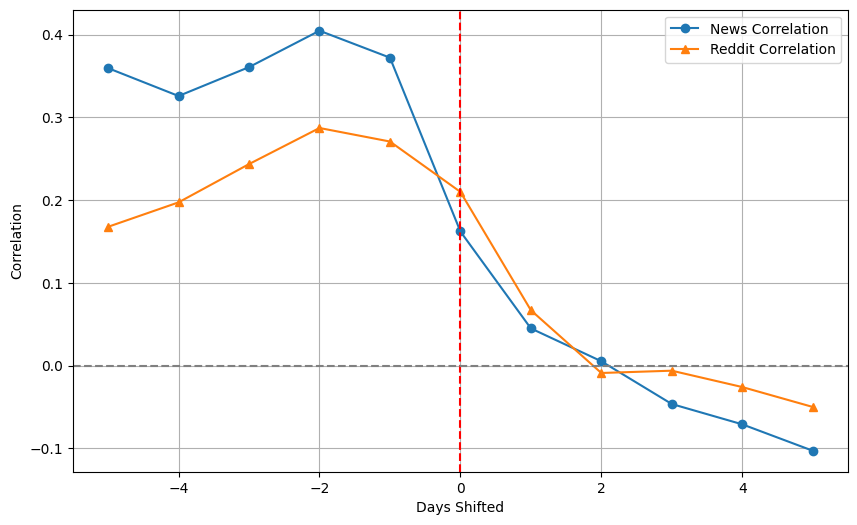

In [180]:
# prompt: plot correlation_result_news and correlation_result_reddit

import matplotlib.pyplot as plt
tic = 'NVDA'
tmp = pd.DataFrame(mean_corr_list[tic])
plt.figure(figsize=(10, 6))
plt.plot(tmp.index, tmp.values[:, 0], label='News Correlation', marker='o')
plt.plot(tmp.index, tmp.values[:, 1], label='Reddit Correlation', marker='^' )
plt.axvline(x=0, color='red', linestyle='--')
plt.axhline(y=0, color='grey', linestyle='--')
plt.xlabel('Days Shifted')
plt.ylabel('Correlation')
# plt.title('Lead-Lag Correlation with Stock Movement')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
for tic in ['AAPL', 'META', 'NVDA', 'PLTR', 'TSLA', 'SPY']:
    print(tic)
    print(pd.DataFrame(mean_corr_list[tic]))
    print(pd.DataFrame(pd.Series(ccorr_list[tic])).T)
    print("="*100)





AAPL
          4         5
1  0.179695  0.024320
2  0.193463  0.043803
3  0.189760  0.077669
4  0.154710  0.101509
5  0.043412  0.136241
          4         5
0  0.240583  0.117406
META
          4         5
1  0.181028  0.148088
2  0.220769  0.036254
3  0.195043 -0.060310
4  0.278266 -0.120869
5  0.220611 -0.113271
         4         5
0  0.10498  0.150371
NVDA
          4         5
1  0.179067  0.295293
2  0.222087  0.265943
3  0.184404  0.138805
4  0.100443  0.047050
5  0.085404 -0.014637
          4         5
0  0.127749  0.233644
PLTR
          4         5
1  0.210082  0.325402
2  0.182093  0.256942
3  0.106044  0.116503
4  0.076674  0.049834
5  0.014956 -0.042036
          4         5
0  0.080334  0.356197
TSLA
          4         5
1  0.440987  0.301588
2  0.461681  0.291825
3  0.395049  0.201858
4  0.309484  0.094821
5  0.104822 -0.057797
          4         5
0  0.429732  0.357783
SPY
          4         5
1  0.601458  0.272213
2  0.647124  0.259887
3  0.563259  0.207345
4  0.

In [ ]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
mean_corr_list = {}
ccorr_list = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    corr_list[tic] = {}
    mean_corr_list[tic] = {}
    ccorr_list[tic] = {}
    for idx in [4, 5, 6, 7, 8, 9]:
        corr_list[tic][idx] = {}
        mean_corr_list[tic][idx] = {}

        x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-03-01')].interpolate(method='linear', limit_direction='forward')
        y = score1[f'score{idx}_scaled'].shift(-lag)[(score1.index >= '2024-03-01') & (score1.index <= '2025-03-01')].interpolate(method='linear', limit_direction='forward')
        ccorr_list[tic][idx] = np.corrcoef(x.to_numpy(), y.to_numpy())[0, 1]
        for lag in range(1, 6):
            rolling_correlation = score1['score3_scaled'].rolling(window=15).corr(score1[f'score{idx}_scaled'].shift(-lag))
            rolling_correlation = rolling_correlation.replace(np.inf, 0)
            rolling_correlation = rolling_correlation.replace(-np.inf, 0)
            rolling_correlation = rolling_correlation.fillna(0)
            corr_list[tic][idx][lag] = rolling_correlation[(rolling_correlation.index >= '2024-03-01') & (rolling_correlation.index <= '2025-03-01')].to_numpy()
            mean_corr_list[tic][idx][lag] = rolling_correlation[(rolling_correlation.index >= '2024-03-01') & (rolling_correlation.index <= '2025-03-01')].to_numpy().mean()
            _score1 = score1[(score1.index >= '2024-03-01') & (score1.index <= '2025-03-01')]


        # corr_list[tic][lag]= rolling_correlation[(rolling_correlation.index >= '2024-04-04') & (rolling_correlation.index <= '2025-02-19')].to_numpy()


In [ ]:
for tic in ['AAPL', 'META', 'NVDA', 'PLTR', 'TSLA', 'SPY']:
    print(tic)
    print(pd.DataFrame(mean_corr_list[tic]))
    print(pd.DataFrame(pd.Series(ccorr_list[tic])).T)
    print("="*100)




AAPL
          4         5         6         7         8         9
1  0.258158  0.080182  0.027574  0.061047  0.043256  0.015949
2  0.224740  0.065176  0.002438 -0.063032  0.007269 -0.018155
3  0.179914  0.078370 -0.036433 -0.184508  0.014628 -0.009175
4  0.147066  0.109258 -0.097477 -0.211951  0.023673 -0.031683
5  0.049758  0.107673 -0.118146 -0.242797 -0.006184 -0.000079
         4         5         6         7         8         9
0  0.28201  0.156603 -0.064223 -0.127448  0.025469  0.051859
META
          4         5         6         7         8         9
1  0.144671  0.171005  0.172997 -0.122639  0.172759 -0.006826
2  0.216129  0.021792  0.166987 -0.100989  0.096015 -0.025635
3  0.158263 -0.080408  0.111873 -0.121371  0.023697 -0.016727
4  0.154961 -0.155918  0.082572 -0.119354  0.038413 -0.006612
5  0.091636 -0.175374  0.016864 -0.092599 -0.026167 -0.019573
          4         5         6         7         8         9
0  0.096546 -0.043809  0.023994 -0.182175  0.012732  0.075728


,4,5,6,7,8,9
0,0.045029,0.255233,-0.151354,-0.031918,0.093265,0.17004


In [ ]:
rolling_correlation

,0
date,
2023-12-07,0.000000
2023-12-08,0.000000
2023-12-11,0.000000
2023-12-12,0.000000
2023-12-13,0.000000
2023-12-14,0.000000
2023-12-15,0.000000
2023-12-18,0.000000
2023-12-19,0.000000


In [ ]:
from scipy import stats
rho1 = {}
p_value1 = {}
for tic in corr_list:
    rho1[tic] = {}
    p_value1[tic] = {}
    for lag in corr_list[tic]:

        t_stat, _p_value = stats.ttest_1samp(corr_list[tic][lag], popmean=0)
        print(tic, lag)
        print(f"rho: {np.mean(corr_list[tic][lag]):.4f}")
        print(f"T-statistic: {t_stat:.4f}")
        print(f"P-value: {_p_value:.4f}")
        rho1[tic][lag] = np.mean(corr_list[tic][lag])
        p_value1[tic][lag] = _p_value


AAPL 1
rho: -0.0621
T-statistic: -2.1967
P-value: 0.0295
AAPL 2
rho: 0.0013
T-statistic: 0.0409
P-value: 0.9674
AAPL 3
rho: 0.0345
T-statistic: 1.0510
P-value: 0.2948
AAPL 4
rho: 0.0539
T-statistic: 1.5362
P-value: 0.1264
AAPL 5
rho: 0.1151
T-statistic: 3.3952
P-value: 0.0009
META 1
rho: -0.0937
T-statistic: -3.4532
P-value: 0.0007
META 2
rho: -0.0512
T-statistic: -1.7349
P-value: 0.0848
META 3
rho: -0.0232
T-statistic: -0.8679
P-value: 0.3869
META 4
rho: -0.0902
T-statistic: -3.2932
P-value: 0.0012
META 5
rho: -0.0838
T-statistic: -3.3387
P-value: 0.0011
NVDA 1
rho: -0.0865
T-statistic: -3.1893
P-value: 0.0017
NVDA 2
rho: -0.1245
T-statistic: -4.3556
P-value: 0.0000
NVDA 3
rho: -0.1137
T-statistic: -3.9157
P-value: 0.0001
NVDA 4
rho: -0.1043
T-statistic: -3.7660
P-value: 0.0002
NVDA 5
rho: -0.0386
T-statistic: -1.5806
P-value: 0.1156
PLTR 1
rho: 0.0557
T-statistic: 1.8331
P-value: 0.0701
PLTR 2
rho: 0.0175
T-statistic: 0.4459
P-value: 0.6568
PLTR 3
rho: -0.0414
T-statistic: -0.8445
P-

In [ ]:
pd.DataFrame(rho1).T

,1,2,3,4,5
AAPL,-0.06,1.26e-03,0.03,5.39e-02,0.12
META,-0.09,-5.12e-02,-0.02,-9.02e-02,-0.08
NVDA,-0.09,-1.24e-01,-0.11,-1.04e-01,-0.04
PLTR,0.06,1.75e-02,-0.04,2.27e-03,0.04
TSLA,-0.06,-1.47e-01,-0.23,-2.65e-01,-0.21
SPY,0.07,2.23e-04,-0.10,-1.59e-01,-0.15


In [ ]:
pd.DataFrame(p_value1).T

,1,2,3,4,5
AAPL,2.95e-02,9.67e-01,2.95e-01,1.26e-01,8.61e-04
META,7.23e-04,8.48e-02,3.87e-01,1.24e-03,1.07e-03
NVDA,1.66e-03,2.14e-05,1.24e-04,2.19e-04,1.16e-01
PLTR,7.01e-02,6.57e-01,4.01e-01,9.65e-01,3.93e-01
TSLA,6.24e-02,3.55e-06,1.81e-13,7.98e-20,7.33e-12
SPY,1.12e-02,9.94e-01,7.50e-04,5.03e-09,1.29e-09


In [ ]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    corr_list[tic] = {}
    for lag in range(1, 6):
        rolling_correlation = score1['score5_scaled'].rolling(window=15).corr(score1['score3_scaled'].shift(-lag))
        rolling_correlation = rolling_correlation.replace(np.inf, 0)
        rolling_correlation = rolling_correlation.replace(-np.inf, 0)
        rolling_correlation = rolling_correlation.fillna(0)
        corr_list[tic][lag]= rolling_correlation[(rolling_correlation.index >= '2024-03-01') & (rolling_correlation.index <= '2025-03-01')].to_numpy()


In [ ]:
from scipy import stats
rho = {}
p_value = {}
for tic in corr_list:
    rho[tic] = {}
    p_value[tic] = {}
    for lag in corr_list[tic]:

        t_stat, _p_value = stats.ttest_1samp(corr_list[tic][lag], popmean=0)
        print(tic, lag)
        print(f"rho: {np.mean(corr_list[tic][lag]):.4f}")
        print(f"T-statistic: {t_stat:.4f}")
        print(f"P-value: {_p_value:.4f}")
        rho[tic][lag] = np.mean(corr_list[tic][lag])
        p_value[tic][lag] = _p_value


AAPL 1
rho: -0.0654
T-statistic: -2.3226
P-value: 0.0214
AAPL 2
rho: -0.0328
T-statistic: -1.0351
P-value: 0.3021
AAPL 3
rho: -0.0253
T-statistic: -0.8311
P-value: 0.4071
AAPL 4
rho: 0.0063
T-statistic: 0.2191
P-value: 0.8268
AAPL 5
rho: 0.0185
T-statistic: 0.5598
P-value: 0.5764
META 1
rho: 0.0956
T-statistic: 3.1801
P-value: 0.0018
META 2
rho: 0.1827
T-statistic: 6.5218
P-value: 0.0000
META 3
rho: 0.1826
T-statistic: 6.7994
P-value: 0.0000
META 4
rho: 0.1560
T-statistic: 5.4610
P-value: 0.0000
META 5
rho: 0.0559
T-statistic: 1.7187
P-value: 0.0878
NVDA 1
rho: 0.1995
T-statistic: 6.9026
P-value: 0.0000
NVDA 2
rho: 0.2285
T-statistic: 7.6889
P-value: 0.0000
NVDA 3
rho: 0.2553
T-statistic: 8.4469
P-value: 0.0000
NVDA 4
rho: 0.1834
T-statistic: 6.1787
P-value: 0.0000
NVDA 5
rho: 0.0862
T-statistic: 2.9740
P-value: 0.0033
PLTR 1
rho: 0.0758
T-statistic: 1.9121
P-value: 0.0590
PLTR 2
rho: 0.1101
T-statistic: 2.5593
P-value: 0.0122
PLTR 3
rho: -0.0156
T-statistic: -0.3975
P-value: 0.6919
PL

In [ ]:
pd.options.display.precision = 2
pd.DataFrame(rho).T

,1,2,3,4,5
AAPL,-0.07,-0.03,-0.03,6.35e-03,0.02
META,0.10,0.18,0.18,1.56e-01,0.06
NVDA,0.20,0.23,0.26,1.83e-01,0.09
PLTR,0.08,0.11,-0.02,-4.39e-02,-0.11
TSLA,0.25,0.32,0.32,2.74e-01,0.17
SPY,0.21,0.22,0.17,1.72e-01,0.12


In [ ]:
pd.DataFrame(rho1).T

,1,2,3,4,5
AAPL,-0.06,1.26e-03,0.03,5.39e-02,0.12
META,-0.09,-5.12e-02,-0.02,-9.02e-02,-0.08
NVDA,-0.09,-1.24e-01,-0.11,-1.04e-01,-0.04
PLTR,0.06,1.75e-02,-0.04,2.27e-03,0.04
TSLA,-0.06,-1.47e-01,-0.23,-2.65e-01,-0.21
SPY,0.07,2.23e-04,-0.10,-1.59e-01,-0.15


In [ ]:
(pd.DataFrame(p_value).T < 0.05) & (pd.DataFrame(p_value).T < 0.01)

,1,2,3,4,5
AAPL,False,False,False,False,False
META,True,True,True,True,False
NVDA,True,True,True,True,True
PLTR,False,False,False,False,False
TSLA,True,True,True,True,True
SPY,True,True,True,True,True


In [ ]:
(pd.DataFrame(p_value1).T < 0.05) & (pd.DataFrame(p_value1).T < 0.01)

,1,2,3,4,5
AAPL,False,False,False,False,True
META,True,False,False,True,True
NVDA,True,True,True,True,False
PLTR,False,False,False,False,False
TSLA,False,True,True,True,True
SPY,False,False,True,True,True


In [ ]:
for tic in ['AAPL', 'META', 'NVDA', 'PLTR', 'TSLA', 'SPY']:
    print(tic)
    s = "&& stock$\\to$news "
    s1 = "& news$\\to$stock "
    for i in range(1,6):
        p1 = ""
        if p_value1[tic][i] < 0.05 and p_value1[tic][i] >= 0.01:
            p1 = "*"
        elif p_value1[tic][i] < 0.01:
            p1 = "**"
        s1 += f"& {rho1[tic][i]:.2f}{p1} "
        p1 = ""
        if p_value[tic][i] < 0.05 and p_value[tic][i] >= 0.01:
            p1 = "*"
        elif p_value[tic][i] < 0.01:
            p1 = "**"
        s += f"& {rho[tic][i]:.2f}{p1} "
    print(s1 + '\\\\')
    print(s + '\\\\')

AAPL
& news$\to$stock & -0.06* & 0.00 & 0.03 & 0.05 & 0.12** \\
&& stock$\to$news & -0.07* & -0.03 & -0.03 & 0.01 & 0.02 \\
META
& news$\to$stock & -0.09** & -0.05 & -0.02 & -0.09** & -0.08** \\
&& stock$\to$news & 0.10** & 0.18** & 0.18** & 0.16** & 0.06 \\
NVDA
& news$\to$stock & -0.09** & -0.12** & -0.11** & -0.10** & -0.04 \\
&& stock$\to$news & 0.20** & 0.23** & 0.26** & 0.18** & 0.09** \\
PLTR
& news$\to$stock & 0.06 & 0.02 & -0.04 & 0.00 & 0.04 \\
&& stock$\to$news & 0.08 & 0.11* & -0.02 & -0.04 & -0.11* \\
TSLA
& news$\to$stock & -0.06 & -0.15** & -0.23** & -0.26** & -0.21** \\
&& stock$\to$news & 0.25** & 0.32** & 0.32** & 0.27** & 0.17** \\
SPY
& news$\to$stock & 0.07* & 0.00 & -0.10** & -0.16** & -0.15** \\
&& stock$\to$news & 0.21** & 0.22** & 0.17** & 0.17** & 0.12** \\


In [ ]:
pd.DataFrame(p_value).T

,1,2,3,4,5
AAPL,3.64e-01,4.84e-02,7.63e-06,1.51e-10,7.85e-15
META,1.69e-02,1.58e-01,1.27e-04,1.03e-07,8.76e-03
NVDA,2.38e-09,1.18e-14,1.01e-09,4.29e-13,3.10e-12
PLTR,6.12e-01,4.52e-01,3.75e-01,2.12e-01,2.13e-01
TSLA,5.06e-24,5.91e-29,7.35e-30,6.73e-14,3.05e-01
SPY,5.07e-06,3.73e-06,1.97e-04,2.16e-03,3.97e-02


In [ ]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    corr_list[tic] = {}
    for lag in range(1, 6):
        x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-03-01')].to_numpy()
        y = score1['score4_scaled'].shift(-lag)[(score1.index >= '2024-03-01') & (score1.index <= '2025-03-01')].to_numpy()
        corr_list[tic][lag]= np.corrcoef(x, y)[0, 1]



In [ ]:
pd.DataFrame(corr_list).T

,1,2,3,4,5
AAPL,0.07,0.06,0.06,0.07,0.07
META,-0.29,-0.30,-0.26,-0.20,-0.16
NVDA,0.30,0.27,0.23,0.16,0.11
PLTR,0.13,0.16,0.16,0.17,0.17
TSLA,0.41,0.37,0.32,0.30,0.30
SPY,-0.07,-0.06,-0.06,-0.05,-0.05


In [ ]:
x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-01')].to_numpy()
y = score1['score4_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-01')].to_numpy()
print(np.corrcoef(x, y)[0, 1])

0.19840113819574093


In [ ]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd
from scipy import stats  # Import stats for t-test

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
p_value_list = {}  # Initialize a dictionary to store p-values

for score1 in score1_list:
    tic = score1['tic'].iloc[0]

    x = score1['score4_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].to_numpy()
    y = score1['score5_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].to_numpy()

    corr_coeff, p_value_corr = stats.pearsonr(x, y)
    corr_list[tic] = corr_coeff

    p_value_list[tic] = p_value_corr

# Display correlation and p-value results
print("Correlation:", corr_list)
print("P-values:", p_value_list)

Correlation: {'AAPL': np.float64(0.12926909236221512), 'META': np.float64(-0.06778315262784561), 'NVDA': np.float64(-0.00263584862827633), 'PLTR': np.float64(0.41858708387378085), 'TSLA': np.float64(0.24755997089779314), 'SPY': np.float64(0.10741848487353298)}
P-values: {'AAPL': np.float64(0.09294092304223343), 'META': np.float64(0.4051191506903269), 'NVDA': np.float64(0.9702272929093262), 'PLTR': np.float64(2.4277518275927835e-05), 'TSLA': np.float64(0.0005363006826055063), 'SPY': np.float64(0.09274746685337842)}


In [ ]:
pd.DataFrame(corr_list, index=['correlation'])

,AAPL,META,NVDA,PLTR,TSLA,SPY
correlation,0.13,-0.07,-2.64e-03,0.42,0.25,0.11


In [ ]:
pd.DataFrame(p_value_list, index=['pvalue'])

,AAPL,META,NVDA,PLTR,TSLA,SPY
pvalue,0.09,0.41,0.97,2.43e-05,5.36e-04,0.09


In [ ]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]

    x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].to_numpy()
    y = score1['score5_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].to_numpy()
    corr_list[tic] = np.corrcoef(x, y)[0, 1]

corr_list

{'AAPL': np.float64(0.28575291206944414),
 'META': np.float64(0.06880513200613474),
 'NVDA': np.float64(0.21366459235974528),
 'PLTR': np.float64(0.09810318107149406),
 'TSLA': np.float64(0.4811091330651044),
 'SPY': np.float64(0.40995687531311403)}

In [ ]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]

    x = score1['score4_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].to_numpy()
    y = score1['score5_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].to_numpy()
    corr_list[tic] = np.corrcoef(x, y)[0, 1]

corr_list

{'AAPL': np.float64(0.10018282275818638),
 'META': np.float64(0.13909576743127594),
 'NVDA': np.float64(0.27276751373260993),
 'PLTR': np.float64(0.3459320803424827),
 'TSLA': np.float64(0.35731115683815484),
 'SPY': np.float64(0.20292517801587837)}

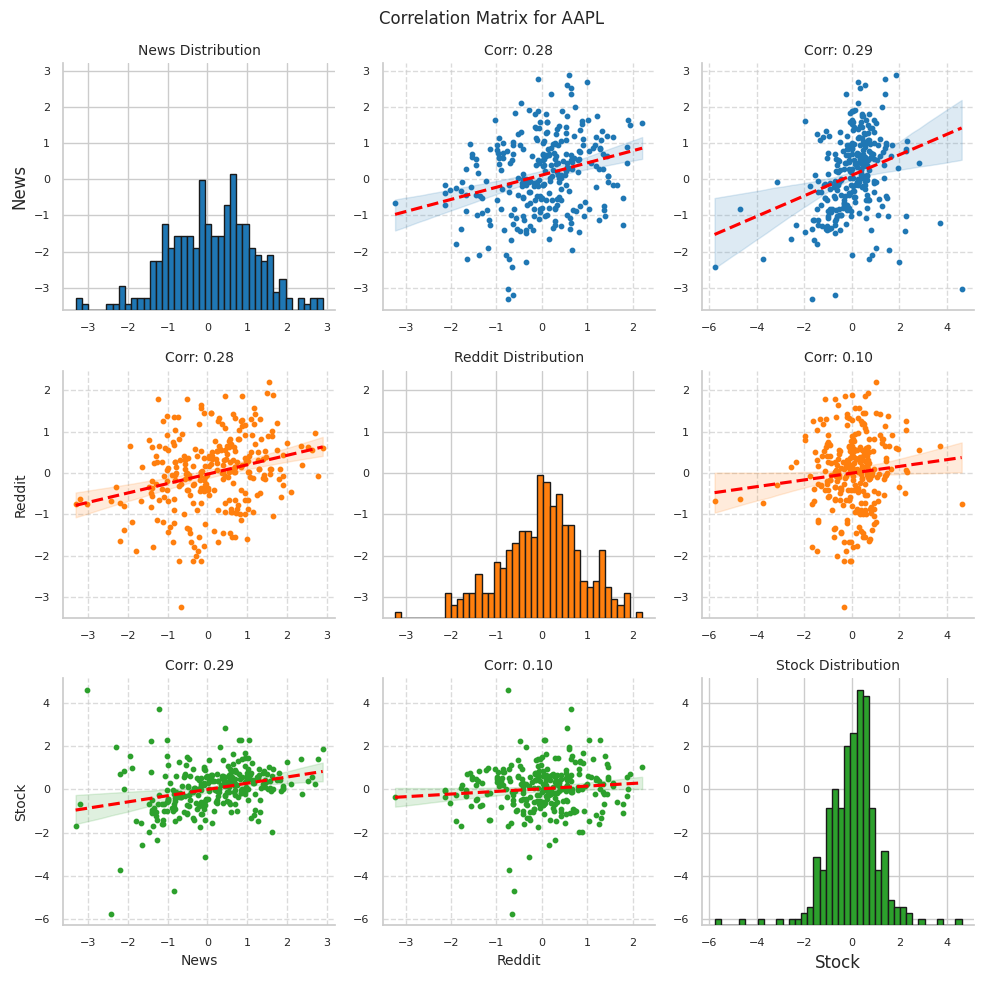

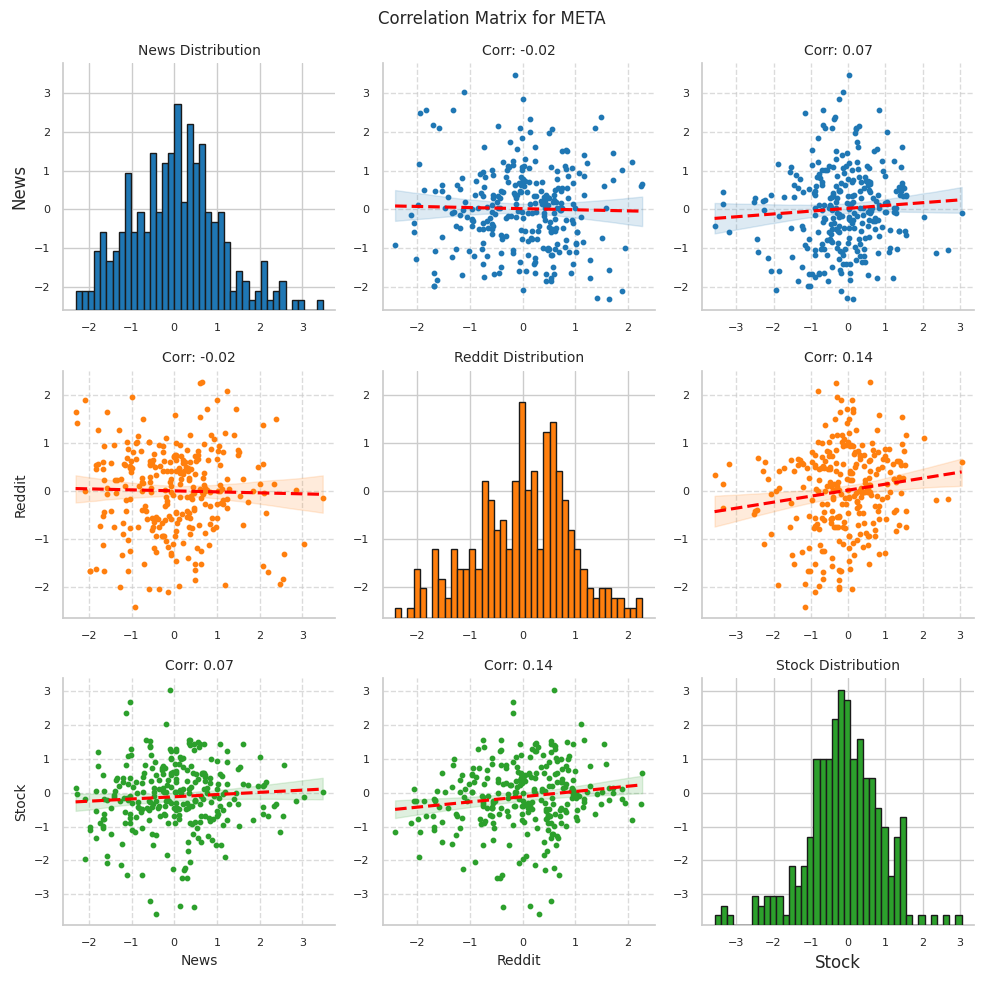

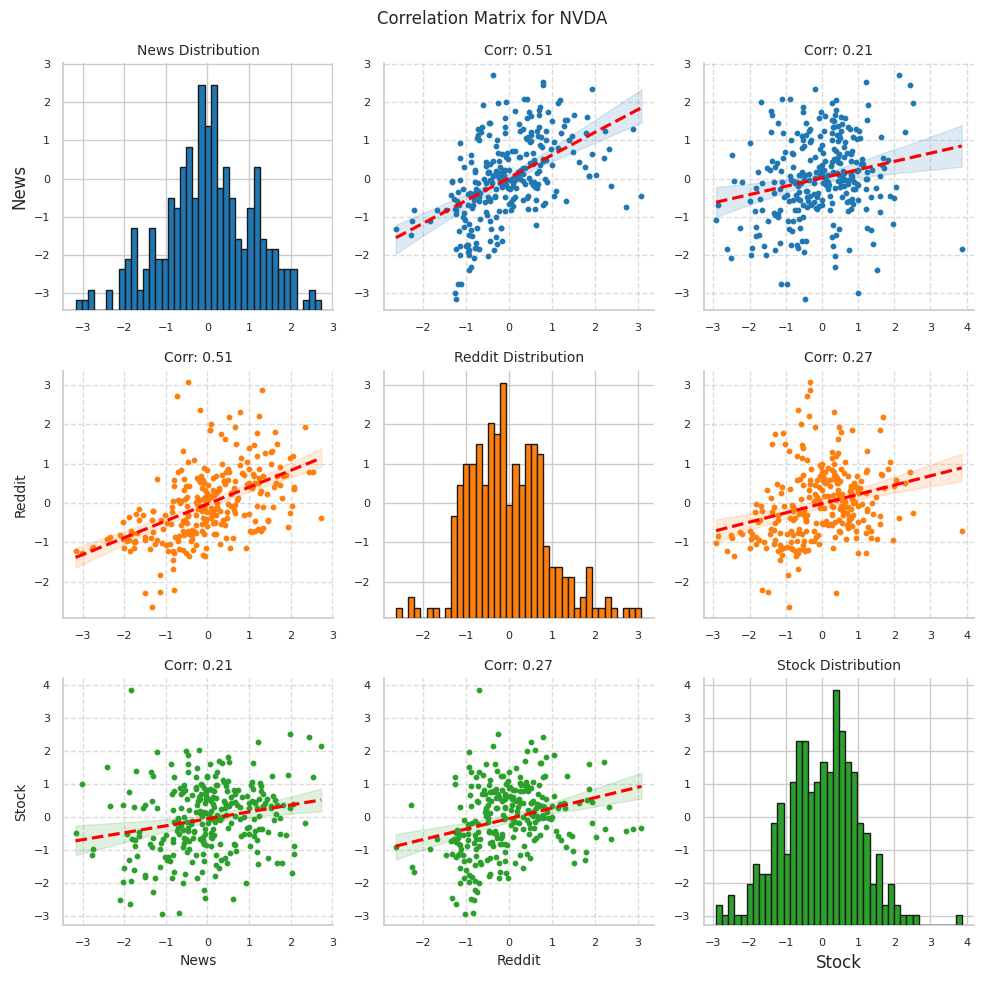

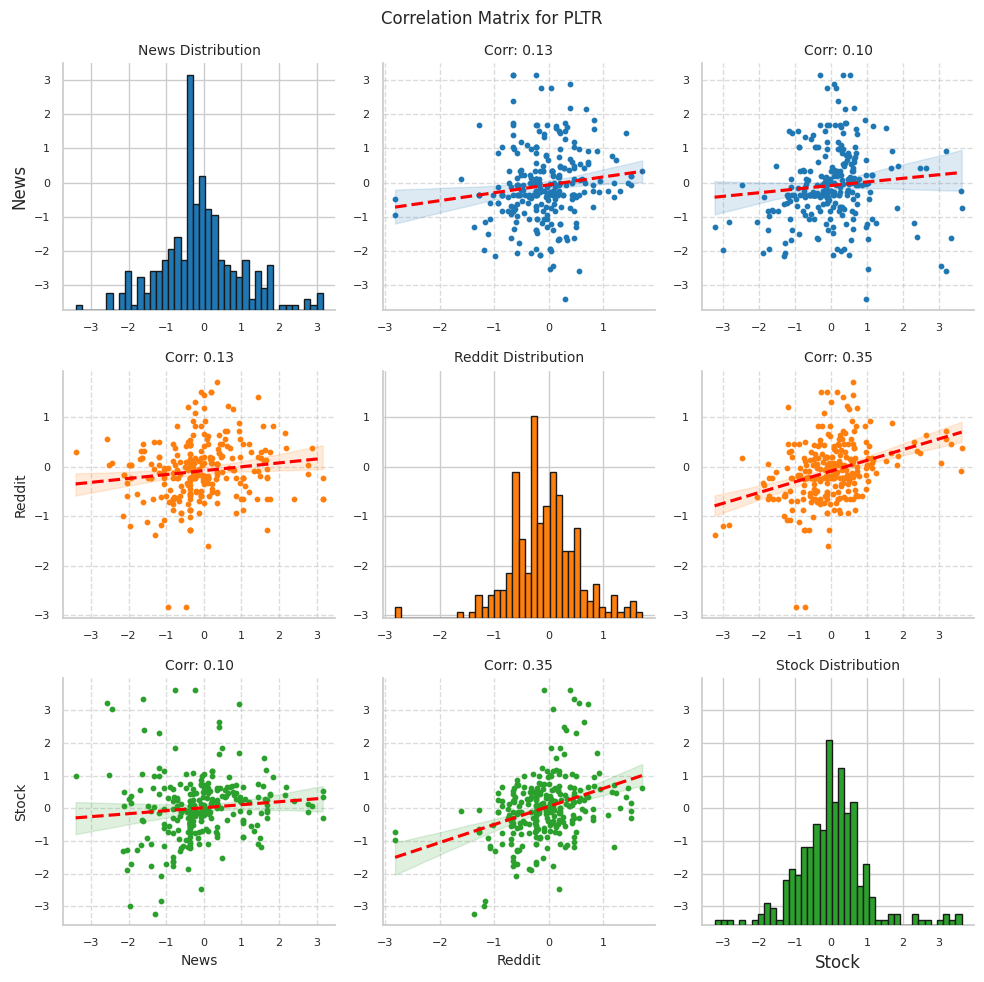

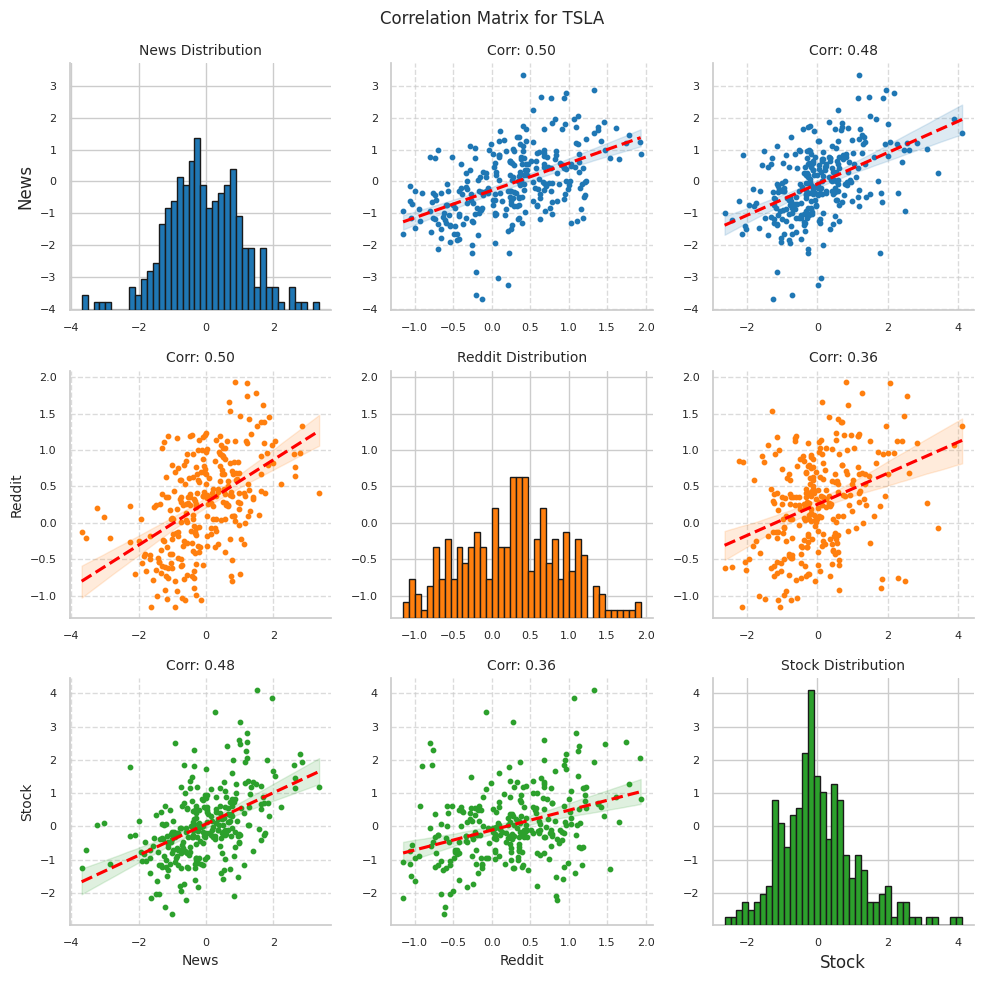

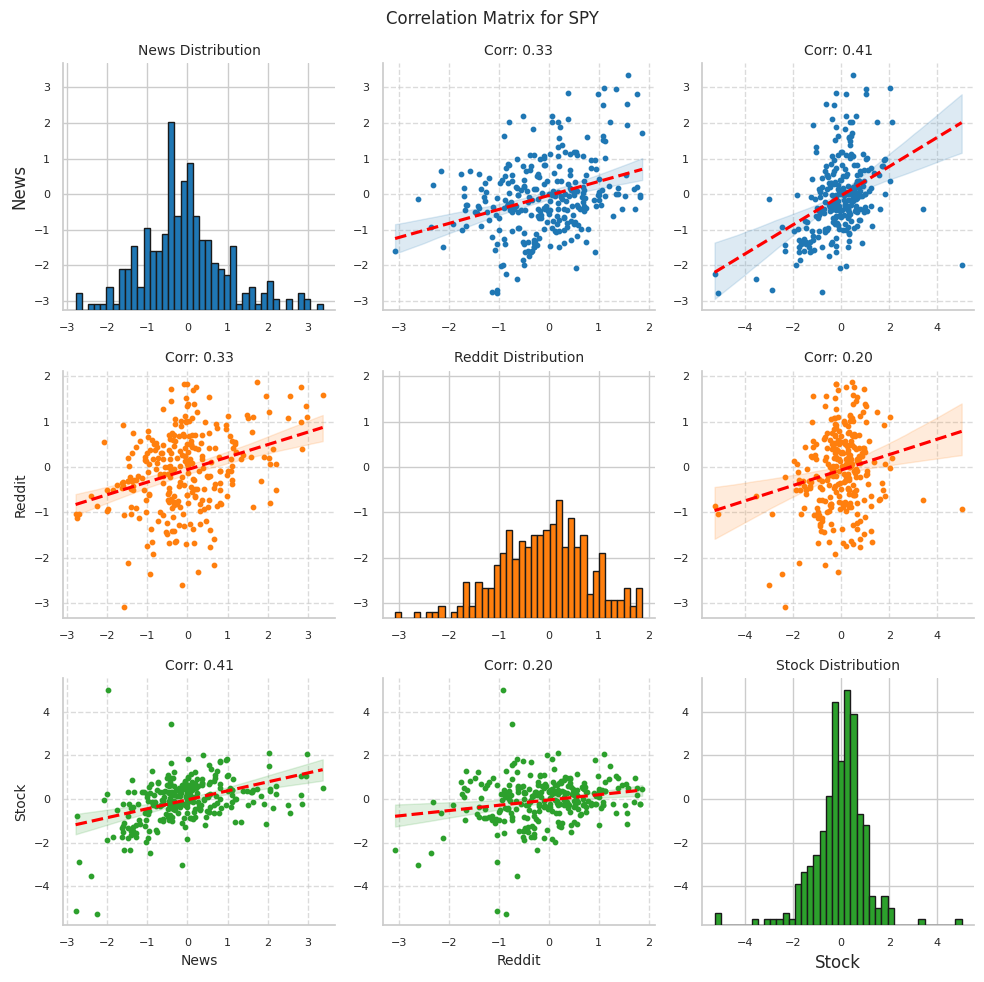

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    df = score1[(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')][['score3_scaled', 'score4_scaled', 'score5_scaled']]
    df = df.rename(columns={'score3_scaled': 'News', 'score4_scaled': 'Reddit', 'score5_scaled': 'Stock'})
    # Step 2: Create the pair plot with histograms and scatter plots
    sns.set(style="whitegrid")  # Use whitegrid for better visibility
    # g = sns.PairGrid(df, diag_sharey=False)
    g = sns.PairGrid(df)

    # Step 3: Define the plots for each section
    # Diagonal: Histograms with consistent colors and styling
    def custom_histplot(data, color, **kwargs):
        sns.histplot(data, color=color, alpha=0.7, bins=30, **kwargs)

    def set_hist_limits(data, **kwargs):
        """Sets axis limits for histograms."""
    #  calculate based on desired height

        plt.xlim(-3, 3)
        plt.ylim(0, 50)

    # Modified set_scatter_limits function to accept x and y data
    def set_scatter_limits(x=None, y=None, **kwargs):  # Accept x and y arguments
        """Sets axis limits for scatter plots."""
        plt.xlim(-3, 3)
        plt.ylim(-3, 3)

    # Off-diagonal: Scatter plots with regression lines
    # g.map_offdiag(sns.scatterplot, color='blue', alpha=0.5)  # Use blue for scatter points
    g.map_offdiag(sns.regplot, scatter=False, color='red', line_kws={'linestyle': '--'})

    g.map_diag(plt.hist, edgecolor="k", bins=40)
    g.map_offdiag(plt.scatter ,s=10)

    # g.map_diag(set_hist_limits)  # Apply custom limits for histograms
    # g.map_offdiag(set_scatter_limits) # Apply custom limits for scatter plots
    # colors = ['blue', 'orange', 'green']  # Define colors for each row

    cmap = plt.get_cmap("tab10")

    # # Step 5: Customize axis labels and titles for scatter plots

    for i in range(g.axes.shape[0]):
        g.axes[i, i].set_title(f"{df.columns[i]} Distribution", fontsize=10)
        g.axes[i, i].tick_params(axis='both', labelsize=8, labelleft=True, labelbottom=True)
        # hist_artist = g.diag_axes[i].get_children()[0]  # Get the histogram artist directly
        # hist_artist.set_facecolor(colors[i])  # Set face color of histogram bars
        for bar in g.diag_axes[i].patches:  # Iterate through histogram bars
            bar.set_facecolor(cmap(i))

        # g.axes[i, i].patches[0].set_facecolor(colors[i])  # Access histogram bars and set color
        for j in range(g.axes.shape[1]):
            if i != j:  # Off-diagonal (scatter plots)
                corr = df.iloc[:, i].corr(df.iloc[:, j])
                g.axes[i, j].set_title(f"Corr: {corr:.2f}", fontsize=10)
                # g.axes[i, j].set_title(f"{df.columns[j]} vs. {df.columns[i]}", fontsize=10)
                g.axes[i, j].set_xlabel(df.columns[j], fontsize=10)
                g.axes[i, j].set_ylabel(df.columns[i], fontsize=10)
                g.axes[i, j].grid(True, linestyle='--', alpha=0.7)
                # g.axes[i, j].set_xlim(-3, 3)
                # g.axes[i, j].set_ylim(-3, 3)
                g.axes[i, j].tick_params(axis='both', labelsize=8, labelleft=True, labelbottom=True)  # Adjust '8' to your desired size
                for scatter in g.axes[i, j].collections:  # Access scatter plot elements
                    scatter.set_facecolor(cmap(i))
                    scatter.set_edgecolor(cmap(i))



    # Step 6: Adjust layout and styling
    g.fig.suptitle(f"Correlation Matrix for {tic}", y=0.98, fontsize=12)
    g.fig.set_size_inches(10, 10)  # Adjust figure size for better visibility
    plt.tight_layout()

    # Step 7: Show the plot
    plt.show()

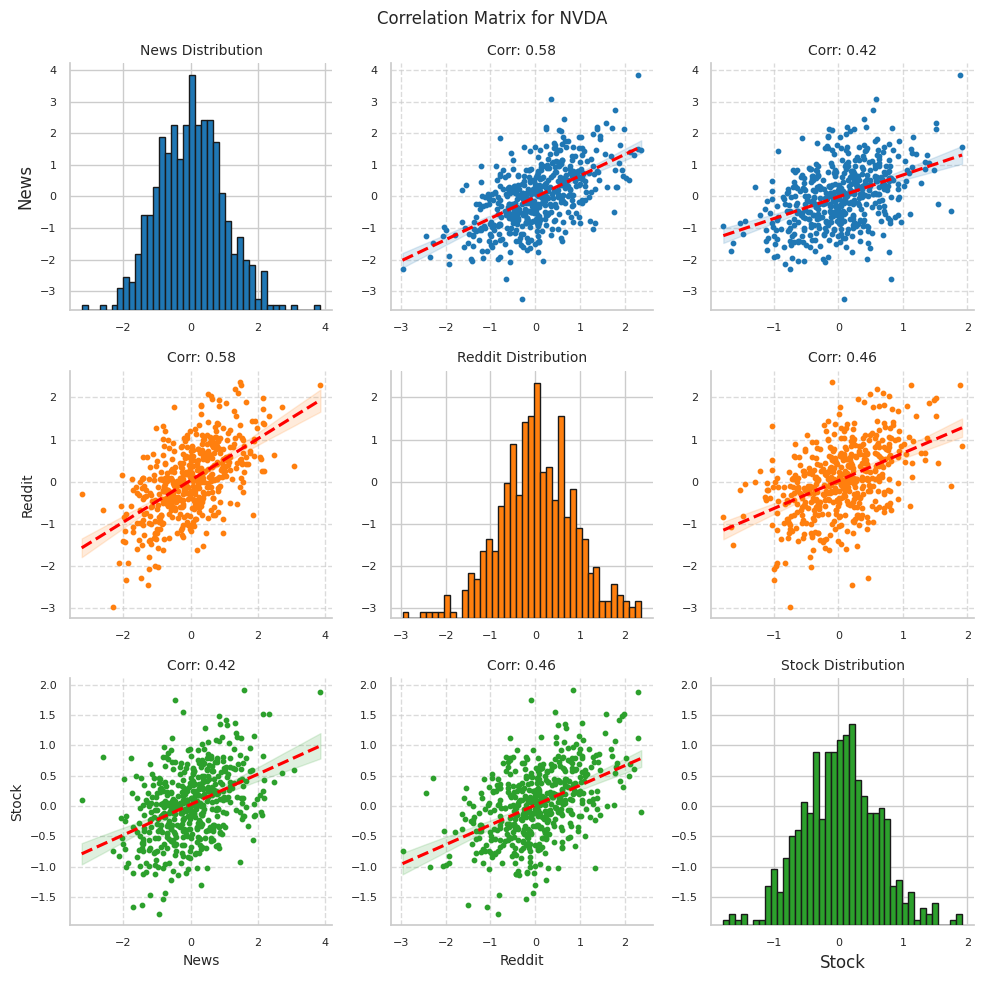

In [ ]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Generate or load your data
np.random.seed(42)
n_samples = 500
data = {
    'News': np.random.normal(0, 1, n_samples),
    'Reddit': np.random.normal(0, 1, n_samples),
    'Stock': np.random.normal(0, 1, n_samples)
}
# Add some correlation between variables
data['Reddit'] = data['Reddit'] * 0.5 + data['News'] * 0.5 + np.random.normal(0, 0.5, n_samples)
data['Stock'] = data['Stock'] * 0.3 + data['News'] * 0.7 + np.random.normal(0, 0.5, n_samples)
data['Stock'] = data['Stock'] * 0.2 + data['Reddit'] * 0.2 + np.random.normal(0, 0.5, n_samples)

df = pd.DataFrame(data)

# Step 2: Create the pair plot with histograms and scatter plots
sns.set(style="whitegrid")  # Use whitegrid for better visibility
# g = sns.PairGrid(df, diag_sharey=False)
g = sns.PairGrid(df)

# Step 3: Define the plots for each section
# Diagonal: Histograms with consistent colors and styling
def custom_histplot(data, color, **kwargs):
    sns.histplot(data, color=color, alpha=0.7, bins=30, **kwargs)

def set_hist_limits(data, **kwargs):
    """Sets axis limits for histograms."""
#  calculate based on desired height

    plt.xlim(-3, 3)
    plt.ylim(0, 50)

# Modified set_scatter_limits function to accept x and y data
def set_scatter_limits(x=None, y=None, **kwargs):  # Accept x and y arguments
    """Sets axis limits for scatter plots."""
    plt.xlim(-3, 3)
    plt.ylim(-3, 3)

# Off-diagonal: Scatter plots with regression lines
# g.map_offdiag(sns.scatterplot, color='blue', alpha=0.5)  # Use blue for scatter points
g.map_offdiag(sns.regplot, scatter=False, color='red', line_kws={'linestyle': '--'})

g.map_diag(plt.hist, edgecolor="k", bins=40)
g.map_offdiag(plt.scatter ,s=10)

# g.map_diag(set_hist_limits)  # Apply custom limits for histograms
# g.map_offdiag(set_scatter_limits) # Apply custom limits for scatter plots
# colors = ['blue', 'orange', 'green']  # Define colors for each row

cmap = plt.get_cmap("tab10")

# # Step 5: Customize axis labels and titles for scatter plots

for i in range(g.axes.shape[0]):
    g.axes[i, i].set_title(f"{df.columns[i]} Distribution", fontsize=10)
    g.axes[i, i].tick_params(axis='both', labelsize=8, labelleft=True, labelbottom=True)
    # hist_artist = g.diag_axes[i].get_children()[0]  # Get the histogram artist directly
    # hist_artist.set_facecolor(colors[i])  # Set face color of histogram bars
    for bar in g.diag_axes[i].patches:  # Iterate through histogram bars
        bar.set_facecolor(cmap(i))

    # g.axes[i, i].patches[0].set_facecolor(colors[i])  # Access histogram bars and set color
    for j in range(g.axes.shape[1]):
        if i != j:  # Off-diagonal (scatter plots)
            corr = df.iloc[:, i].corr(df.iloc[:, j])
            g.axes[i, j].set_title(f"Corr: {corr:.2f}", fontsize=10)
            # g.axes[i, j].set_title(f"{df.columns[j]} vs. {df.columns[i]}", fontsize=10)
            g.axes[i, j].set_xlabel(df.columns[j], fontsize=10)
            g.axes[i, j].set_ylabel(df.columns[i], fontsize=10)
            g.axes[i, j].grid(True, linestyle='--', alpha=0.7)
            # g.axes[i, j].set_xlim(-3, 3)
            # g.axes[i, j].set_ylim(-3, 3)
            g.axes[i, j].tick_params(axis='both', labelsize=8, labelleft=True, labelbottom=True)  # Adjust '8' to your desired size
            for scatter in g.axes[i, j].collections:  # Access scatter plot elements
                scatter.set_facecolor(cmap(i))
                scatter.set_edgecolor(cmap(i))



# Step 6: Adjust layout and styling
g.fig.suptitle("Correlation Matrix for NVDA", y=0.98, fontsize=12)
g.fig.set_size_inches(10, 10)  # Adjust figure size for better visibility
plt.tight_layout()

# Step 7: Show the plot
plt.show()

In [ ]:
score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].to_numpy()
#

array([ 0.33333333,  0.33333333,  0.33333333, -2.66666667])

In [ ]:
 score1[(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')][['score5_scaled', 'score3_scaled']]

,sentiment,count,rolling_sum,rolling_count,score,SMA5,SMA5_scaled,y,rate,rate_scaled,...,score_scaled,score2,score2_scaled,score3,score3_scaled,score4,score4_scaled,score5,score5_scaled,tic
date,,,,,,,,,,,,,,,,,,,,,
2023-09-01,3,34,3.0,34.0,1.28e-01,-5.76e-02,-1.58,6.37e-04,6.37e-04,1.53e-02,...,1.02e-01,5.96e-02,0.09,-5.76e-02,-1.58,5.96e-02,1.95e-01,-9.00e-03,-1.11e+00,AAPL
2023-09-05,-1,23,-1.0,23.0,-3.48e-03,-5.76e-02,-1.58,-7.02e-02,-7.02e-02,-3.60e+00,...,-6.23e-01,0.00e+00,0.00,-5.76e-02,-1.58,0.00e+00,1.95e-01,-9.00e-03,-1.11e+00,AAPL
2023-09-06,-8,27,-8.0,27.0,-2.56e-01,-5.76e-02,-1.58,1.81e-02,1.81e-02,9.06e-01,...,-2.02e+00,5.96e-02,0.09,-5.76e-02,-1.58,5.96e-02,1.95e-01,-9.00e-03,-1.11e+00,AAPL
2023-09-07,-8,30,-8.0,30.0,-2.27e-01,-5.76e-02,-1.58,9.64e-03,9.64e-03,4.75e-01,...,-1.85e+00,5.96e-02,0.09,-5.76e-02,-1.58,5.96e-02,1.95e-01,-9.00e-03,-1.11e+00,AAPL
2023-09-08,1,33,1.0,33.0,7.03e-02,-5.76e-02,-1.58,-3.22e-03,-3.22e-03,-1.81e-01,...,-2.17e-01,0.00e+00,0.00,-5.76e-02,-1.58,0.00e+00,1.95e-01,-9.00e-03,-1.11e+00,AAPL
2023-09-11,1,26,1.0,26.0,7.85e-02,-6.75e-02,-1.67,-1.66e-02,-1.66e-02,-8.64e-01,...,-1.72e-01,0.00e+00,0.00,-6.75e-02,-1.67,0.00e+00,1.95e-01,-1.25e-02,-1.53e+00,AAPL
2023-09-12,18,78,18.0,78.0,2.71e-01,-1.27e-02,-1.15,-1.42e-02,-1.42e-02,-7.42e-01,...,8.87e-01,0.00e+00,0.00,-1.27e-02,-1.15,0.00e+00,1.95e-01,-1.26e-03,-1.87e-01,AAPL
2023-09-13,3,23,3.0,23.0,1.70e-01,7.27e-02,-0.34,1.43e-02,1.43e-02,7.10e-01,...,3.34e-01,5.96e-02,0.09,7.27e-02,-0.34,5.96e-02,1.95e-01,-2.03e-03,-2.79e-01,AAPL
2023-09-14,-1,22,-1.0,22.0,-5.45e-03,1.17e-01,0.08,3.77e-08,3.77e-08,-1.72e-02,...,-6.34e-01,5.96e-02,0.09,1.17e-01,0.08,5.96e-02,1.95e-01,-3.96e-03,-5.10e-01,AAPL


In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import grangercausalitytests

In [ ]:
p_value1 = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    print(tic)
    p_value1[tic] = {}
    g = grangercausalitytests( score1[(score1.index >= '2024-03-01') & (score1.index <= '2025-03-01')][['score3_scaled', 'score4_scaled']], maxlag=5, verbose=True)
    for i in range(1, 6):
        p_value1[tic][i] = g[i][0]['ssr_ftest'][1]
    print("="*100)

AAPL

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0226  , p=0.8806  , df_denom=160, df_num=1
ssr based chi2 test:   chi2=0.0230  , p=0.8793  , df=1
likelihood ratio test: chi2=0.0230  , p=0.8794  , df=1
parameter F test:         F=0.0226  , p=0.8806  , df_denom=160, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0142  , p=0.9859  , df_denom=157, df_num=2
ssr based chi2 test:   chi2=0.0294  , p=0.9854  , df=2
likelihood ratio test: chi2=0.0294  , p=0.9854  , df=2
parameter F test:         F=0.0142  , p=0.9859  , df_denom=157, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.0443  , p=0.9876  , df_denom=154, df_num=3
ssr based chi2 test:   chi2=0.1389  , p=0.9868  , df=3
likelihood ratio test: chi2=0.1389  , p=0.9868  , df=3
parameter F test:         F=0.0443  , p=0.9876  , df_denom=154, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.1523  , p=0.9

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print resul

In [ ]:
p_value = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    print(tic)
    p_value[tic] = {}
    g = grangercausalitytests( score1[(score1.index >= '2024-03-01') & (score1.index <= '2025-03-01')][['score3_scaled', 'score4_scaled']], maxlag=5, verbose=True)
    for i in range(1, 6):
        p_value[tic][i] = g[i][0]['ssr_ftest'][1]
    print("="*100)

AAPL

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0226  , p=0.8806  , df_denom=160, df_num=1
ssr based chi2 test:   chi2=0.0230  , p=0.8793  , df=1
likelihood ratio test: chi2=0.0230  , p=0.8794  , df=1
parameter F test:         F=0.0226  , p=0.8806  , df_denom=160, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0142  , p=0.9859  , df_denom=157, df_num=2
ssr based chi2 test:   chi2=0.0294  , p=0.9854  , df=2
likelihood ratio test: chi2=0.0294  , p=0.9854  , df=2
parameter F test:         F=0.0142  , p=0.9859  , df_denom=157, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.0443  , p=0.9876  , df_denom=154, df_num=3
ssr based chi2 test:   chi2=0.1389  , p=0.9868  , df=3
likelihood ratio test: chi2=0.1389  , p=0.9868  , df=3
parameter F test:         F=0.0443  , p=0.9876  , df_denom=154, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.1523  , p=0.9

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


ssr based chi2 test:   chi2=0.2642  , p=0.6073  , df=1
likelihood ratio test: chi2=0.2639  , p=0.6074  , df=1
parameter F test:         F=0.2588  , p=0.6117  , df_denom=145, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1120  , p=0.8941  , df_denom=142, df_num=2
ssr based chi2 test:   chi2=0.2319  , p=0.8905  , df=2
likelihood ratio test: chi2=0.2317  , p=0.8906  , df=2
parameter F test:         F=0.1120  , p=0.8941  , df_denom=142, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.0814  , p=0.9700  , df_denom=139, df_num=3
ssr based chi2 test:   chi2=0.2565  , p=0.9680  , df=3
likelihood ratio test: chi2=0.2563  , p=0.9680  , df=3
parameter F test:         F=0.0814  , p=0.9700  , df_denom=139, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.2394  , p=0.2972  , df_denom=136, df_num=4
ssr based chi2 test:   chi2=5.2859  , p=0.2592  , df=4
likelihood ratio test: chi2=5.1918  , p

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


ssr based F test:         F=0.4358  , p=0.7826  , df_denom=184, df_num=4
ssr based chi2 test:   chi2=1.8286  , p=0.7673  , df=4
likelihood ratio test: chi2=1.8200  , p=0.7688  , df=4
parameter F test:         F=0.4358  , p=0.7826  , df_denom=184, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6974  , p=0.6261  , df_denom=181, df_num=5
ssr based chi2 test:   chi2=3.6990  , p=0.5935  , df=5
likelihood ratio test: chi2=3.6638  , p=0.5988  , df=5
parameter F test:         F=0.6974  , p=0.6261  , df_denom=181, df_num=5
PLTR

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0026  , p=0.9591  , df_denom=87, df_num=1
ssr based chi2 test:   chi2=0.0027  , p=0.9583  , df=1
likelihood ratio test: chi2=0.0027  , p=0.9583  , df=1
parameter F test:         F=0.0026  , p=0.9591  , df_denom=87, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4088  , p=0.6658  , df_denom=84, df_num=2
ssr based chi2 test

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/stattools.py:1556: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


parameter F test:         F=0.9044  , p=0.4627  , df_denom=172, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9230  , p=0.4675  , df_denom=169, df_num=5
ssr based chi2 test:   chi2=4.9153  , p=0.4263  , df=5
likelihood ratio test: chi2=4.8494  , p=0.4345  , df=5
parameter F test:         F=0.9230  , p=0.4675  , df_denom=169, df_num=5
SPY

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0473  , p=0.8280  , df_denom=232, df_num=1
ssr based chi2 test:   chi2=0.0479  , p=0.8267  , df=1
likelihood ratio test: chi2=0.0479  , p=0.8267  , df=1
parameter F test:         F=0.0473  , p=0.8280  , df_denom=232, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1101  , p=0.8958  , df_denom=229, df_num=2
ssr based chi2 test:   chi2=0.2250  , p=0.8936  , df=2
likelihood ratio test: chi2=0.2249  , p=0.8936  , df=2
parameter F test:         F=0.1101  , p=0.8958  , df_denom=229, df_num=2

Granger Causalit

In [ ]:
pd.DataFrame(p_value).T

,1,2,3,4,5
AAPL,0.63,0.86,0.93,0.43,0.45
META,0.48,0.27,0.51,0.65,0.63
NVDA,0.61,0.70,0.90,0.78,0.25
PLTR,0.05,0.12,0.19,0.16,0.07
TSLA,0.72,0.05,0.05,0.14,0.21
SPY,0.97,0.66,0.60,0.55,0.12


In [ ]:
for tic in ['AAPL', 'META', 'NVDA', 'PLTR', 'TSLA', 'SPY']:
    print(tic)
    s1 = "& $f_k$ vs $g_k^{news}$ "
    s = "&& $f_k$ vs $g_k^{reddit}$ "

    for i in range(1,6):
        p1 = ""
        if p_value1[tic][i] < 0.05 and p_value1[tic][i] >= 0.01:
            p1 = "*"
        elif p_value1[tic][i] < 0.01:
            p1 = "**"
        s1 += f"& {p_value1[tic][i]:.2f}{p1} "
        p1 = ""
        if p_value[tic][i] < 0.05 and p_value[tic][i] >= 0.01:
            p1 = "*"
        elif p_value[tic][i] < 0.01:
            p1 = "**"
        s += f"& {p_value[tic][i]:.2f}{p1} "
    print(s1 + '\\\\')
    print(s + '\\\\')

AAPL
& $f_k$ vs $g_k^{news}$ & 0.88 & 0.99 & 0.99 & 0.96 & 0.58 \\
&& $f_k$ vs $g_k^{reddit}$ & 0.63 & 0.86 & 0.93 & 0.43 & 0.45 \\
META
& $f_k$ vs $g_k^{news}$ & 0.61 & 0.89 & 0.97 & 0.30 & 0.44 \\
&& $f_k$ vs $g_k^{reddit}$ & 0.48 & 0.27 & 0.51 & 0.65 & 0.63 \\
NVDA
& $f_k$ vs $g_k^{news}$ & 0.43 & 0.76 & 0.78 & 0.78 & 0.63 \\
&& $f_k$ vs $g_k^{reddit}$ & 0.61 & 0.70 & 0.90 & 0.78 & 0.25 \\
PLTR
& $f_k$ vs $g_k^{news}$ & 0.96 & 0.67 & 0.68 & 0.61 & 0.80 \\
&& $f_k$ vs $g_k^{reddit}$ & 0.05* & 0.12 & 0.19 & 0.16 & 0.07 \\
TSLA
& $f_k$ vs $g_k^{news}$ & 0.02* & 0.07 & 0.27 & 0.46 & 0.47 \\
&& $f_k$ vs $g_k^{reddit}$ & 0.72 & 0.05* & 0.05 & 0.14 & 0.21 \\
SPY
& $f_k$ vs $g_k^{news}$ & 0.83 & 0.90 & 0.69 & 0.89 & 0.44 \\
&& $f_k$ vs $g_k^{reddit}$ & 0.97 & 0.66 & 0.60 & 0.55 & 0.12 \\


In [ ]:
with open("/content/drive/MyDrive/eecs6414/data/category/nvda_with_category.pkl", "rb") as f:
    df = pickle.load(f)

<ipython-input-198-1ad16e2cd6c7>:2: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  df = pickle.load(f)


In [ ]:
df['category'].str.contains('data')

date        tic 
2025-03-03  NVDA    False
            NVDA    False
            NVDA    False
            NVDA     True
            NVDA     True
                    ...  
2025-03-05  NVDA     True
            NVDA     True
            NVDA    False
            NVDA     True
            NVDA     True
Name: category, Length: 10004, dtype: bool

In [ ]:
df['category'].unique()

array(['data-driven sentiment', 'fiscal-related', 'data-driven', 'other',
       'fiscal-related sentiment', 'none', 'opinion-based', 'others',
       'overall neutral', 'overall positive sentiment', 'opinion based',
       '...', '..., '], dtype=object)

In [ ]:
with open("/content/drive/MyDrive/eecs6414/data/category/reddit_nvda_with_category.pkl", "rb") as f:
    df = pickle.load(f)

<ipython-input-312-ec5bf7c66f61>:2: DeprecationWarning: numpy.core.numeric is deprecated and has been renamed to numpy._core.numeric. The numpy._core namespace contains private NumPy internals and its use is discouraged, as NumPy internals can change without warning in any release. In practice, most real-world usage of numpy.core is to access functionality in the public NumPy API. If that is the case, use the public NumPy API. If not, you are using NumPy internals. If you would still like to access an internal attribute, use numpy._core.numeric._frombuffer.
  df = pickle.load(f)


In [ ]:
df.shape

(3199, 7)

In [ ]:
df[~((df['category'].str.contains('fiscal')) | (df['category'].str.contains('data')))].shape

(365, 7)

In [ ]:
3199 - 1709 - 1125

365

In [67]:
mean_corr_list = {}

(5267, 1)
(1677, 7)
(205, 7)
(251, 7)
(1221, 7)
(0, 7)


[*********************100%***********************]  1 of 1 completed


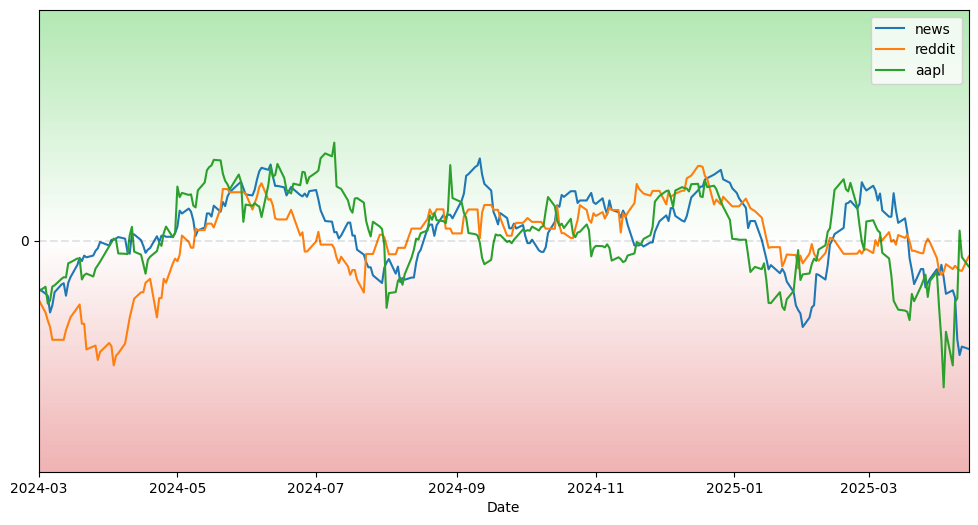

(4460, 1)
(3711, 7)
(34, 7)
(1142, 7)
(2535, 7)
(0, 7)


[*********************100%***********************]  1 of 1 completed


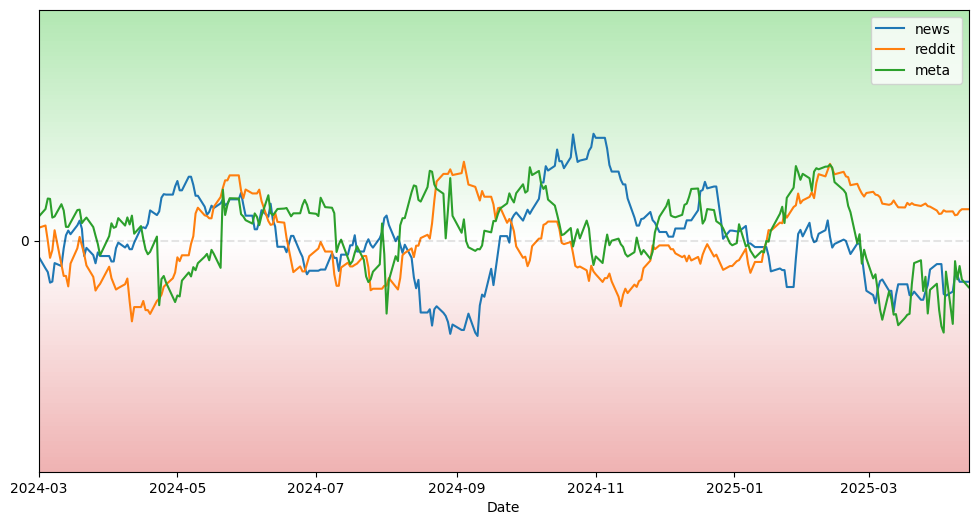

(4830, 1)


[*********************100%***********************]  1 of 1 completed

(2490, 7)
(308, 7)
(245, 7)
(1937, 7)
(0, 7)


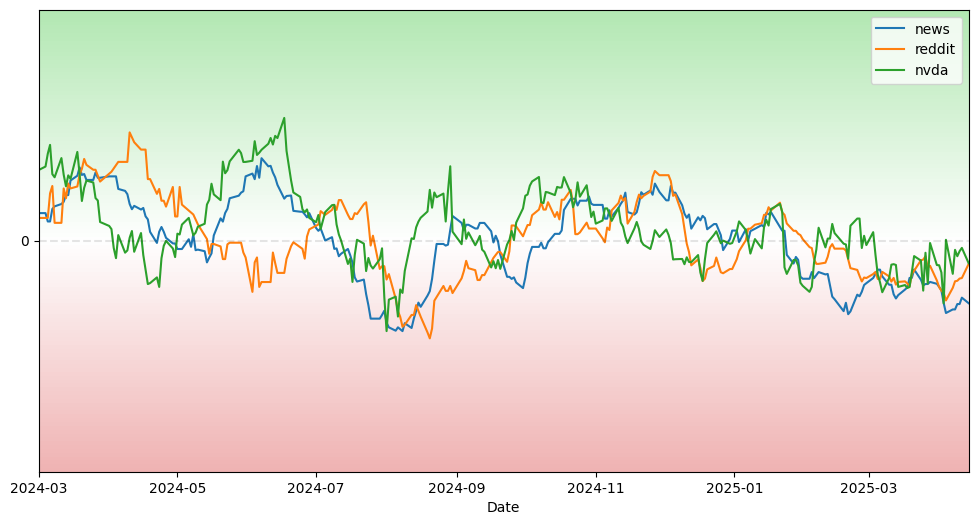

(1683, 1)


[*********************100%***********************]  1 of 1 completed

(2280, 7)
(216, 7)
(124, 7)
(1940, 7)
(0, 7)


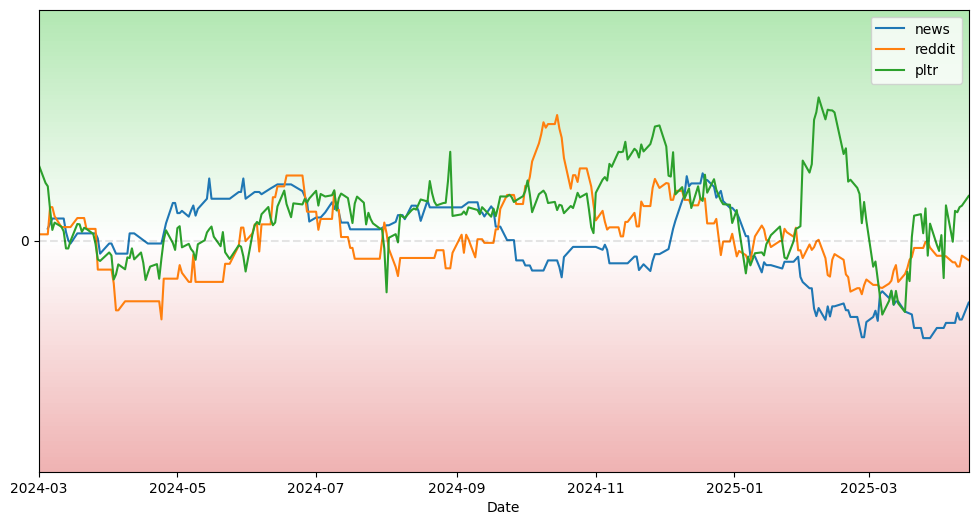

(6270, 1)


[*********************100%***********************]  1 of 1 completed

(3113, 7)
(330, 7)
(472, 7)
(2311, 7)
(0, 7)


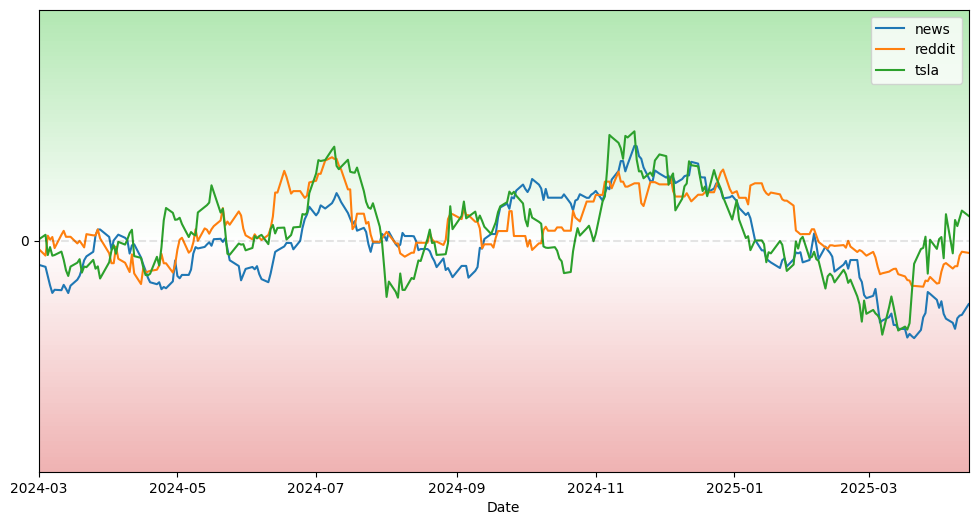

(1854, 1)
(3675, 7)
(139, 7)
(409, 7)
(3127, 7)
(0, 7)


[*********************100%***********************]  1 of 1 completed


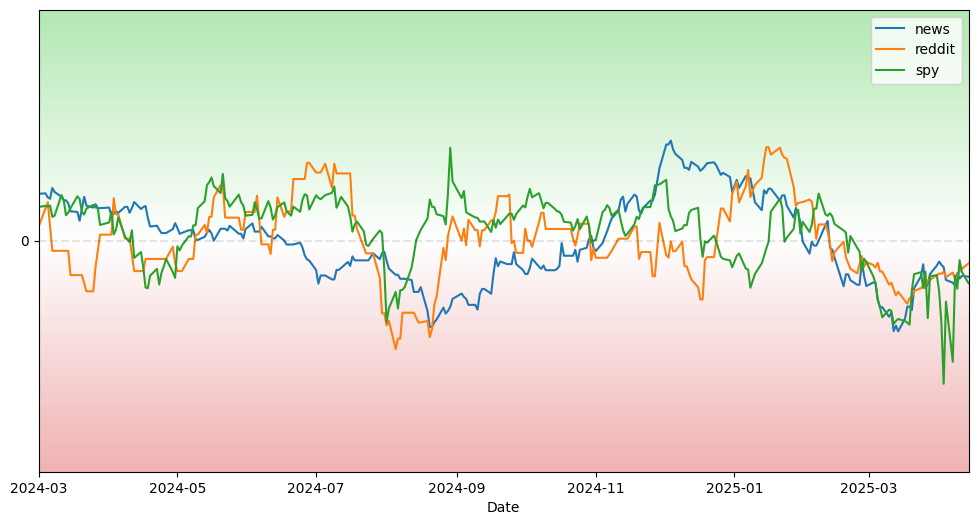

In [73]:
score1_list = []
cmap = plt.get_cmap("tab10")
for tic in ['AAPL', 'META', 'NVDA', 'PLTR', 'TSLA', 'SPY']:
    windows = 1
    version = 9
    cat = 'C'
    with open(f"/content/drive/MyDrive/eecs6414/data/{tic.lower()}_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)

    with open(f"/content/drive/MyDrive/eecs6414/data/{tic.lower()}_cat{version}.pkl", "rb") as f:
        news_cat_df = pickle.load(f)
    news_df['answer2'] = news_cat_df['answer'].to_numpy()
    news_df = news_df[news_df['answer2'] == cat]
    _news_df = pd.DataFrame(news_df['answer'])
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    _news_df['sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})
    # score1 = _news_df.groupby('date')['score'].mean()
    score1 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score1['count'] = pd.DataFrame(_news_df.groupby('date')['sentiment'].count())
    score1['rolling_sum'] = score1.rolling(windows)['sentiment'].sum()
    score1['rolling_count'] = score1.rolling(windows)['count'].sum()
    score1['score'] = score1['rolling_sum'] / score1['rolling_count'] + 0.04
    # score1['score'] = score1['rolling_sum']
    score1 = score1[score1.index >= '2023-09-01']
    score1 = score1[score1.index <= '2025-04-14']
    score1 = pd.DataFrame(score1)
    version = 9

    with open(f"/content/drive/MyDrive/eecs6414/data/reddit_chat{version}.pkl", "rb") as f:
        news_df = pickle.load(f)
    with open(f"/content/drive/MyDrive/eecs6414/data/reddit_cat{version}.pkl", "rb") as f:
        news_cat_df = pickle.load(f)
    news_df['answer2'] = news_cat_df['answer'].to_numpy()
    news_df = news_df[news_df['answer2'] == cat]

    _news_df = news_df[(news_df.index.get_level_values(1).isin([tic]))]
    # _news_df = news_df
    _news_df.loc[:,'answer'] = _news_df['answer']
    _news_df = _news_df[_news_df['answer'] != 'unknown']
    print(_news_df.shape)
    print(_news_df[_news_df['answer'] == 'positive'].shape)
    print(_news_df[_news_df['answer'] == 'negative'].shape)
    print(_news_df[_news_df['answer'] == 'neutral'].shape)
    print(_news_df[_news_df['answer'] == 'unknown'].shape)
    _news_df.loc[:, 'sentiment'] = _news_df['answer'].map({'positive': 1, 'neutral': 0, 'negative': -1})

    score2 = pd.DataFrame(_news_df.groupby('date')['sentiment'].sum())
    score2['count'] = _news_df.groupby('date')['sentiment'].count()
    score2['rolling_sum'] = score2.rolling(windows)['sentiment'].sum()
    score2['rolling_count'] = score2.rolling(windows)['count'].sum()
    score2['score'] = score2['rolling_sum'] / score2['rolling_count'] + 0.0596
    # score2['score'] = score2['rolling_sum']

    score2 = score2[score2.index >= '2023-09-01']
    score2 = score2[score2.index <= '2025-04-14']
    score2 = pd.DataFrame(score2)
    # prompt: use yfinance to download the stock price info for nvda starting from 2022-01-01 till now
    import yfinance as yf
    # Download data
    data = yf.download([tic], start="2023-09-01")
    # data = yf.download(["TSLA"], start="2023-09-01")
    # Print the data (optional)
    data.columns = data.columns.get_level_values(0)
    data = data.shift(-1)
    data['movement'] = data['Open'].shift(-1)/data['Open'] - 1
    data['score'] = data['movement'].rolling(windows).mean()
    score3 = pd.DataFrame(data['score'])
    score3 = score3[score3.index <= '2025-04-14']

    ma_value = 20
    suffix = 'EMA' if ma_value < 1 else 'SMA'
    for i in [ma_value]:
        graph([score1, score2, score3], i, with_mean=[True, True, False], vertical=None, text=None, hightlight=False, color=[cmap(0), cmap(1), cmap(2)], label=['news', 'reddit', tic.lower()])
    # score3 = pd.DataFrame(score3)
    score1['y'] = score3['score']
    score1['rate'] = score3['score']
    score1['y'] = score1['y'].interpolate(method='linear', limit_direction='forward')
    score1['rate'] = score1['rate'].interpolate(method='linear', limit_direction='forward')

    mean = score1['rate'].mean()
    std = score1['rate'].std()
    score1['rate_scaled'] = (score1['rate'] - mean) / (std + 1e-8)

    score1['y_scaled'] = (score1['y'] - mean) / (std + 1e-8)

    score1 = score1[score1.index >= pd.to_datetime('2023-01-01')]
    score1['rate_rolling_5'] = score1['rate'].rolling(5).mean()
    mean = score1['rate_rolling_5'].mean()
    std = score1['rate_rolling_5'].std()
    score1['rate_rolling_5_scaled'] = (score1['rate_rolling_5'] - mean) / (std + 1e-8)
    score1['rate_rolling_3'] = score1['rate'].rolling(3).mean()
    mean = score1['rate_rolling_3'].mean()
    std = score1['rate_rolling_3'].std()
    score1['rate_rolling_3_scaled'] = (score1['rate_rolling_3'] - mean) / (std + 1e-8)
    mean = score1['score'].mean()
    std = score1['score'].std()
    score1['score_scaled'] = (score1['score'] - mean) / (std + 1e-8)
    score1['score2'] = score2['score']
    mean = score1['score2'].mean()
    std = score1['score2'].std()
    score1['score2_scaled'] = (score1['score2'] - mean) / (std + 1e-8)
    score1['score2_scaled'] = score1['score2_scaled'].fillna(0)
    # score1['score3'] = score1['EMA0.05']
    score1['score3'] = score3[f'{suffix}{ma_value}']
    mean = score1['score3'].mean()
    std = score1['score3'].std()
    score1['score3_scaled'] = (score1['score3'] - mean) / (std + 1e-8)
    score1['score3_scaled'] = score1['score3_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score3_scaled'] = score1['score3_scaled'].interpolate(method='linear', limit_direction='backward')

    # score1['score4'] = score2['EMA0.05']
    score1['score4'] = score1[f'{suffix}{ma_value}']
    mean = score1['score4'].mean()
    std = score1['score4'].std()
    score1['score4_scaled'] = (score1['score4'] - mean) / (std + 1e-8)
    score1['score4_scaled'] = score1['score4_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score4_scaled'] = score1['score4_scaled'].interpolate(method='linear', limit_direction='backward')


    # score1['score5'] = score3['EMA0.05']
    score1['score5'] = score2[f'{suffix}{ma_value}']
    mean = score1['score5'].mean()
    std = score1['score5'].std()
    score1['score5_scaled'] = (score1['score5'] - mean) / (std + 1e-8)
    score1['score5_scaled'] = score1['score5_scaled'].interpolate(method='linear', limit_direction='forward')
    score1['score5_scaled'] = score1['score5_scaled'].interpolate(method='linear', limit_direction='backward')
    score1['tic'] = tic
    score1.fillna(0, inplace=True)

    score1_list.append(score1)

In [58]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
mean_corr_list[cat] = {}
ccorr_list = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    corr_list[tic] = {}
    mean_corr_list[cat][tic] = {}
    ccorr_list[tic] = {}
    for idx in [4, 5]:
        corr_list[tic][idx] = {}
        mean_corr_list[cat][tic][idx] = {}

        x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
        y = score1[f'score{idx}_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
        ccorr_list[tic][idx] = np.corrcoef(x.to_numpy(), y.to_numpy())[0, 1]
        for lag in range(-5, 6):
            # rolling_correlation = score1['score3_scaled'].rolling(window=15).corr(score1[f'score{idx}_scaled'].shift(lag))
            rolling_correlation = score1['score3_scaled'].rolling(window=15).corr(score1[f'score{idx}_scaled'].shift(lag))
            # rolling_correlation = rolling_correlation.replace(np.inf, 0)
            # rolling_correlation = rolling_correlation.replace(-np.inf, 0)
            # rolling_correlation = rolling_correlation.fillna(0)
            tmp = rolling_correlation[(rolling_correlation.index >= '2024-03-01') & (rolling_correlation.index <= '2025-04-14')].to_numpy()
            # if tmp[~np.isnan(tmp)].shape[0] == 0:
            # print(tic, lag, tmp[~np.isnan(tmp)].shape)
            corr_list[tic][idx][lag] = tmp[~np.isnan(tmp)]
            mean_corr_list[cat][tic][idx][lag] = np.nanmean(tmp)
            _score1 = score1[(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')]


        # corr_list[tic][lag]= rolling_correlation[(rolling_correlation.index >= '2024-04-04') & (rolling_correlation.index <= '2025-02-19')].to_numpy()


In [74]:
# prompt: rolling correlation for score1_list[0]['score3_scaled'] and score1_list[0]['score4_scaled']

import pandas as pd

# Assuming score1_list[0] is a pandas DataFrame as shown in the provided code
# and contains columns 'score3_scaled' and 'score4_scaled'.

corr_list = {}
mean_corr_list[cat] = {}
ccorr_list = {}
for score1 in score1_list:
    tic = score1['tic'].iloc[0]
    corr_list[tic] = {}
    mean_corr_list[cat][tic] = {}
    ccorr_list[tic] = {}
    for idx in [4, 5]:
        corr_list[tic][idx] = {}
        mean_corr_list[cat][tic][idx] = {}

        x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
        # print(x)
        y = score1[f'score{idx}_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
        # print(y)
        ccorr_list[tic][idx] = np.corrcoef(x.to_numpy(), y.to_numpy())[0, 1]
        for lag in range(-8, 9):
            x = score1['score3_scaled'][(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
            y = score1[f'score{idx}_scaled'].shift(lag)[(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')].interpolate(method='linear', limit_direction='forward')
            tmp = np.corrcoef(x.to_numpy(), y.to_numpy())[0, 1]
            mean_corr_list[cat][tic][idx][lag] = tmp
            # _score1 = score1[(score1.index >= '2024-03-01') & (score1.index <= '2025-04-14')]


        # corr_list[tic][lag]= rolling_correlation[(rolling_correlation.index >= '2024-04-04') & (rolling_correlation.index <= '2025-02-19')].to_numpy()


In [75]:
mean_corr_list['A']

{'AAPL': {4: {-8: np.float64(0.5843403345964873),
   -7: np.float64(0.6035825163074638),
   -6: np.float64(0.6192655915874519),
   -5: np.float64(0.632236962235478),
   -4: np.float64(0.642891054329826),
   -3: np.float64(0.6484969315576417),
   -2: np.float64(0.6450766858120417),
   -1: np.float64(0.6277137351903754),
   0: np.float64(0.5914205662836387),
   1: np.float64(0.5601127735462911),
   2: np.float64(0.5247795640838536),
   3: np.float64(0.49255263327284843),
   4: np.float64(0.46316274845356387),
   5: np.float64(0.43440461248064316),
   6: np.float64(0.40826151386419574),
   7: np.float64(0.3777624069728535),
   8: np.float64(0.3485531020393226)},
  5: {-8: np.float64(0.3426042892511067),
   -7: np.float64(0.32526967933574047),
   -6: np.float64(0.31129178598693635),
   -5: np.float64(0.3036950082234825),
   -4: np.float64(0.3013135633079958),
   -3: np.float64(0.29794418720752797),
   -2: np.float64(0.28831276848767995),
   -1: np.float64(0.2711133418201278),
   0: np.floa

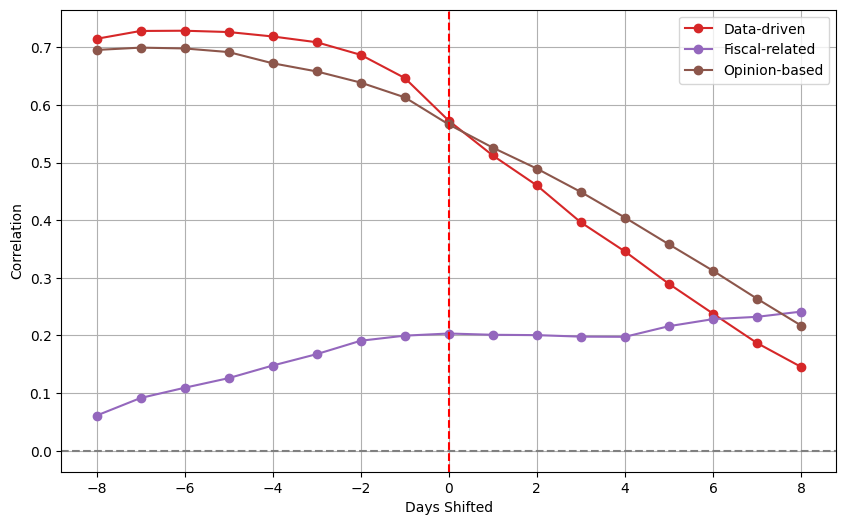

In [77]:
# prompt: plot correlation_result_news and correlation_result_reddit

import matplotlib.pyplot as plt
tic = 'NVDA'
plt.figure(figsize=(10, 6))
i = 0
for _cat, _label in zip(['A', 'B', 'C'], ['Data-driven', 'Fiscal-related', 'Opinion-based']):
    tmp = pd.DataFrame(mean_corr_list[_cat][tic])
    plt.plot(tmp.index, tmp.values[:, 0], label=_label, marker='o', color=cmap(i+3))
    i += 1
    # plt.plot(tmp.index, tmp.values[:, 1], label='Reddit Correlation', marker='^'
    # plt.plot(tmp.index, tmp.values[:, 1], label='Reddit Correlation', marker='^' )
plt.axvline(x=0, color='red', linestyle='--')
plt.axhline(y=0, color='grey', linestyle='--')
plt.xlabel('Days Shifted')
plt.ylabel('Correlation')
# plt.title('Lead-Lag Correlation with Stock Movement')
plt.legend()
plt.grid(True)
plt.show()


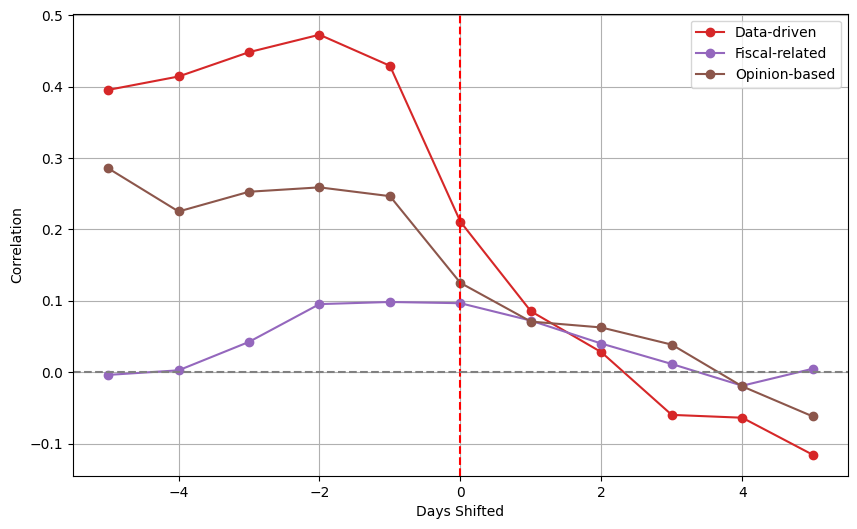

In [66]:
# prompt: plot correlation_result_news and correlation_result_reddit

import matplotlib.pyplot as plt
tic = 'NVDA'
plt.figure(figsize=(10, 6))
i = 0
for _cat, _label in zip(['A', 'B', 'C'], ['Data-driven', 'Fiscal-related', 'Opinion-based']):
    tmp = pd.DataFrame(mean_corr_list[_cat][tic])
    plt.plot(tmp.index, tmp.values[:, 0], label=_label, marker='o', color=cmap(i+3))
    i += 1
    # plt.plot(tmp.index, tmp.values[:, 1], label='Reddit Correlation', marker='^'
    # plt.plot(tmp.index, tmp.values[:, 1], label='Reddit Correlation', marker='^' )
plt.axvline(x=0, color='red', linestyle='--')
plt.axhline(y=0, color='grey', linestyle='--')
plt.xlabel('Days Shifted')
plt.ylabel('Correlation')
# plt.title('Lead-Lag Correlation with Stock Movement')
plt.legend()
plt.grid(True)
plt.show()
